In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

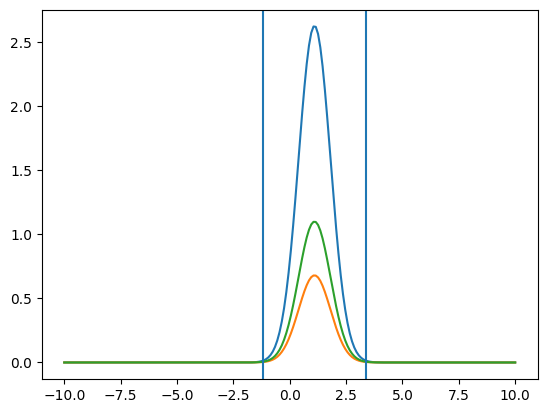

*Extracting Pieces for TH1*
Available Functions:
	Num_Xbins(TH1_) returns number of X bins for a TH1
	XEdges_1d(TH1_) returns edges of x bins for a TH1
	Center_Xbins(TH1_) returns center values for x bins for a TH1
	Values_1d(TH1_) returns the y values for a TH1
	Errors_1d(TH1_) returns the error values for TH1
	Errors2_1d(TH1_) returns the squared error values for TH1
Enjoy using TH1s

You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is concerned


In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [3]:
#date="06-13-2022"
date="07-15-2024"
par="zero"
sim="exp"
run="e16"

SLURM_ID="13866486"
top="m"+par
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_"+run+"/"+date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file=dir+"/"+sim+"_"+run+"_clas6_mm_"+par+"_"+date+".root"
file=uproot3.open(root_file)

In [4]:
Particle=''
if par == "pro":
    Particle = "Proton"
elif par == "pip":
    Particle = "\u03C0 +"
elif par == "pim":
    Particle = "\u03C0 -"
else:
    Particle = "Explicit"

In [5]:
#The Various layers of TDirectories to get to the histograms
layer0='MM'
layer1='MM_'+top
layer2=layer1+"_no-cut"
layer3=[layer2+"_sec"+str(i+1) for i in range(6)]
layer4=[layer3[i]+"_clean" for i in range(6)]
layer51=[layer4[i]+"_W_dep" for i in range(6)]
layer52=[layer4[i]+"_W_Range" for i in range(6)]
dir_loc=[([layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer51[i]],[layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer52[i]]) for i in range(6)]
names1=[["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:"+W_Bin_Name[j] for j in range(_W_bins_)] for i in range(6)]
names2=["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:in_range" for i in range(6)]
#Histogram Names
hist_name=[[[file[dir_loc[i][0][0]][names1[i][j]] for j in range(_W_bins_)],file[dir_loc[i][1][0]][names2[i]]] for i in range(6)]
          

In [6]:
def sign(n_):
    if n_ >= 0:
        return 1
    else:
        return -1
    
cut_names =["tight","mid","loose"]
color_order=['b','g','r']
cut_width = [2.5,3,3.5]

initial bw fit:  [ 2.10854412e+03 -1.71912231e-04  3.69167641e-04]
input parameters for r2 [ 2.10854412e+03 -1.71912231e-04  3.69167641e-04  5.00000000e+02
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 1.86893776e+03 -1.05146848e-04  1.56586153e-04  8.58379833e+02
 -3.86250989e-04  7.96490714e-04]
-6.250181059202224e-08 8.461352983347763e-08
Main Gaus Peak [ 1.86893776e+03 -1.05146848e-04  1.56586153e-04]
Gaus2 [ 8.58379833e+02 -3.86250989e-04  7.96490714e-04]


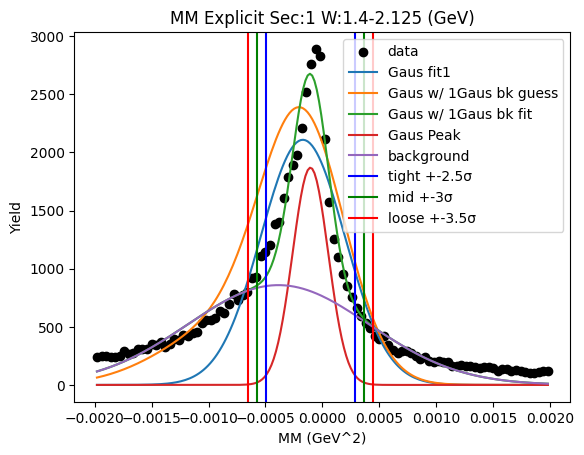

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 8.36601379e+00 -1.05905184e-04  2.76926600e-04]
2nd level W dependent
W1_ini_pars: [ 8.36601379e+00 -1.05905184e-04  2.76926600e-04  3.07211428e+00
 -1.00000000e-02  6.74285300e-02]
Gaus1 Peak: [ 7.64511626e+00 -9.05678686e-05  1.98063917e-04]
Gaus2 Peak: [ 1.69704923e+00 -5.65120679e-04  9.40026397e-04]
tight should be -0.000585727660118227   0.00040459192300724213
[[-0.00058573  0.          0.        ]
 [ 0.00040459  0.          0.        ]]
mid should be -0.0006847596184307739   0.000503623881319789
[[-0.00058573 -0.00068476  0.        ]
 [ 0.00040459  0.00050362  0.        ]]
loose should be -0.0007837915767433208   0.0006026558396323359
[[-0.00058573 -0.00068476 -0.00078379]
 [ 0.00040459  0.00050362  0.00060266]]
-1.0948540639193139e-07 1.258904840213013e-07
Main Gaus Peak [ 7.64511626e+00 -9.05678686e-05  1.98063917e-04]
Gaus2 [ 1.69704923e+00 -5.65120679e-04  9.40026397e-04]


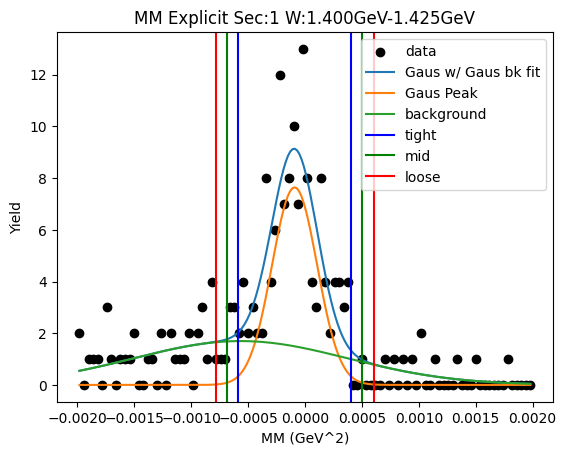

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 8.99912884e+00 -1.87705526e-04  4.52714520e-04]
2nd level W dependent
W1_ini_pars: [ 8.99912884e+00 -1.87705526e-04  4.52714520e-04  1.69704923e+00
 -5.65120679e-04  9.40026397e-04]
Gaus1 Peak: [ 8.55007980e+00 -9.95203895e-05  1.30681035e-04]
Gaus2 Peak: [ 4.75911999e+00 -3.71621064e-04  7.58627712e-04]
tight should be -0.0004262229768527437   0.00022718219785358246
[[-0.00042622  0.          0.        ]
 [ 0.00022718  0.          0.        ]]
mid should be -0.0004915634943233763   0.00029252271532421504
[[-0.00042622 -0.00049156  0.        ]
 [ 0.00022718  0.00029252  0.        ]]
loose should be -0.0005569040117940089   0.0003578632327948476
[[-0.00042622 -0.00049156 -0.0005569 ]
 [ 0.00022718  0.00029252  0.00035786]]
-4.1328290753812304e-08 6.113690660610878e-08
Main Gaus Peak [ 8.55007980e+00 -9.95203895e-05  1.30681035e-04]
Gaus2 [ 4.75911999e+00 -3.71621064e-04  7.58627712e-04]


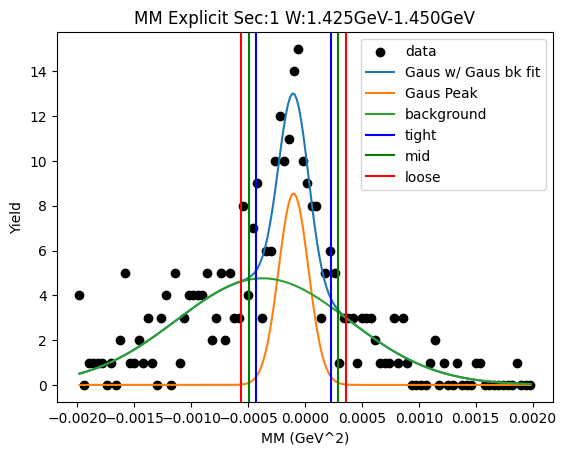

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 1.45818634e+01 -1.52946067e-04  4.14074473e-04]
2nd level W dependent
W1_ini_pars: [ 1.45818634e+01 -1.52946067e-04  4.14074473e-04  4.75911999e+00
 -3.71621064e-04  7.58627712e-04]
Gaus1 Peak: [ 1.01383158e+01 -1.27564818e-04  1.39219954e-04]
Gaus2 Peak: [ 8.48018716e+00 -2.13889492e-04  6.23928452e-04]
tight should be -0.000475614703360961   0.00022048506676959915
[[-0.00047561  0.          0.        ]
 [ 0.00022049  0.          0.        ]]
mid should be -0.0005452246803740171   0.0002900950437826552
[[-0.00047561 -0.00054522  0.        ]
 [ 0.00022049  0.0002901   0.        ]]
loose should be -0.000614834657387073   0.0003597050207957112
[[-0.00047561 -0.00054522 -0.00061483]
 [ 0.00022049  0.0002901   0.00035971]]
-4.187380393028817e-08 7.441936966390834e-08
Main Gaus Peak [ 1.01383158e+01 -1.27564818e-04  1.39219954e-04]
Gaus2 [ 8.48018716e+00 -2.13889492e-04  6.23928452e-04]


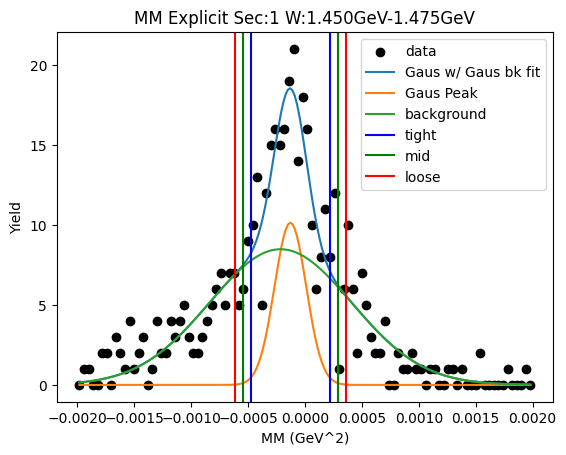

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 2.02701251e+01 -1.45187439e-04  3.68317636e-04]
2nd level W dependent
W1_ini_pars: [ 2.02701251e+01 -1.45187439e-04  3.68317636e-04  8.48018716e+00
 -2.13889492e-04  6.23928452e-04]
Gaus1 Peak: [ 1.69764474e+01 -9.99623471e-05  1.84215912e-04]
Gaus2 Peak: [ 7.56932176e+00 -3.29053899e-04  7.90138985e-04]
tight should be -0.000560502126291135   0.00036057743200753245
[[-0.0005605   0.          0.        ]
 [ 0.00036058  0.          0.        ]]
mid should be -0.0006526100821210017   0.0004526853878373991
[[-0.0005605  -0.00065261  0.        ]
 [ 0.00036058  0.00045269  0.        ]]
loose should be -0.0007447180379508685   0.0005447933436672659
[[-0.0005605  -0.00065261 -0.00074472]
 [ 0.00036058  0.00045269  0.00054479]]
-9.18140354797822e-08 1.1179897717197818e-07
Main Gaus Peak [ 1.69764474e+01 -9.99623471e-05  1.84215912e-04]
Gaus2 [ 7.56932176e+00 -3.29053899e-04  7.90138985e-04]


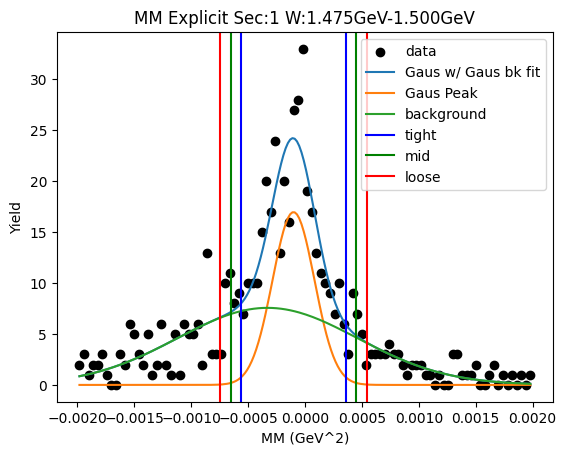

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 2.39168904e+01 -1.22955289e-04  3.64642067e-04]
2nd level W dependent
W1_ini_pars: [ 2.39168904e+01 -1.22955289e-04  3.64642067e-04  7.56932176e+00
 -3.29053899e-04  7.90138985e-04]
Gaus1 Peak: [ 2.09716366e+01 -7.93790800e-05  2.37937736e-04]
Gaus2 Peak: [ 6.28499337e+00 -5.57030813e-04  1.03687999e-03]
tight should be -0.0006742234194893568   0.0005154652594951398
[[-0.00067422  0.          0.        ]
 [ 0.00051547  0.          0.        ]]
mid should be -0.0007931922873878064   0.0006344341273935894
[[-0.00067422 -0.00079319  0.        ]
 [ 0.00051547  0.00063443  0.        ]]
loose should be -0.0009121611552862562   0.0007534029952920391
[[-0.00067422 -0.00079319 -0.00091216]
 [ 0.00051547  0.00063443  0.0007534 ]]
-1.6354206000727784e-07 1.7614413668965251e-07
Main Gaus Peak [ 2.09716366e+01 -7.93790800e-05  2.37937736e-04]
Gaus2 [ 6.28499337e+00 -5.57030813e-04  1.03687999e-03]


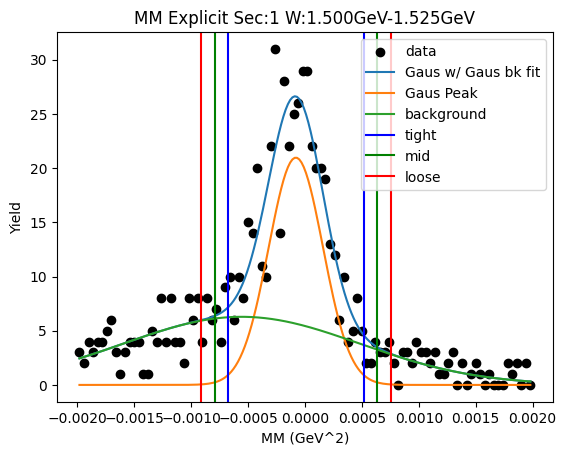

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 2.69385504e+01 -1.78291137e-04  4.21556954e-04]
2nd level W dependent
W1_ini_pars: [ 2.69385504e+01 -1.78291137e-04  4.21556954e-04  6.28499337e+00
 -5.57030813e-04  1.03687999e-03]
Gaus1 Peak: [ 2.08897035e+01 -6.65873876e-05  1.48924071e-04]
Gaus2 Peak: [ 1.48909371e+01 -3.43291221e-04  6.47011662e-04]
tight should be -0.0004388975642126888   0.0003057227890661542
[[-0.0004389   0.          0.        ]
 [ 0.00030572  0.          0.        ]]
mid should be -0.0005133595995405731   0.0003801848243940385
[[-0.0004389  -0.00051336  0.        ]
 [ 0.00030572  0.00038018  0.        ]]
loose should be -0.0005878216348684575   0.00045464685972192284
[[-0.0004389  -0.00051336 -0.00058782]
 [ 0.00030572  0.00038018  0.00045465]]
-6.210125627822057e-08 7.09690166458856e-08
Main Gaus Peak [ 2.08897035e+01 -6.65873876e-05  1.48924071e-04]
Gaus2 [ 1.48909371e+01 -3.43291221e-04  6.47011662e-04]


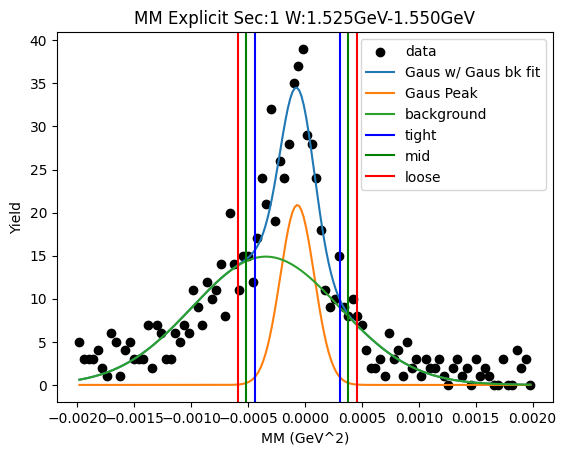

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 2.76297732e+01 -1.23321278e-04  4.45368543e-04]
2nd level W dependent
W1_ini_pars: [ 2.76297732e+01 -1.23321278e-04  4.45368543e-04  1.48909371e+01
 -3.43291221e-04  6.47011662e-04]
Gaus1 Peak: [ 2.15108488e+01 -8.94593602e-05  2.36883932e-04]
Gaus2 Peak: [ 1.07016546e+01 -2.66840670e-04  8.67142534e-04]
tight should be -0.0006816691910664116   0.0005027504707316908
[[-0.00068167  0.          0.        ]
 [ 0.00050275  0.          0.        ]]
mid should be -0.0008001111572462217   0.0006211924369115009
[[-0.00068167 -0.00080011  0.        ]
 [ 0.00050275  0.00062119  0.        ]]
loose should be -0.000918553123426032   0.0007396344030913112
[[-0.00068167 -0.00080011 -0.00091855]
 [ 0.00050275  0.00062119  0.00073963]]
-1.603390151089182e-07 1.7634496935202523e-07
Main Gaus Peak [ 2.15108488e+01 -8.94593602e-05  2.36883932e-04]
Gaus2 [ 1.07016546e+01 -2.66840670e-04  8.67142534e-04]


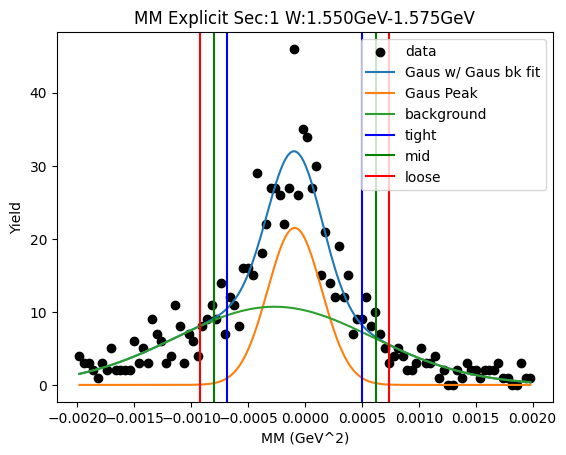

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 2.77628683e+01 -1.48859590e-04  4.37854148e-04]
2nd level W dependent
W1_ini_pars: [ 2.77628683e+01 -1.48859590e-04  4.37854148e-04  1.07016546e+01
 -2.66840670e-04  8.67142534e-04]
Gaus1 Peak: [ 2.28603465e+01 -7.97393149e-05  1.29840627e-04]
Gaus2 Peak: [ 1.54076331e+01 -2.51145775e-04  7.15434517e-04]
tight should be -0.00040434088283158767   0.0002448622529736111
[[-0.00040434  0.          0.        ]
 [ 0.00024486  0.          0.        ]]
mid should be -0.0004692611964121075   0.00030978256655413096
[[-0.00040434 -0.00046926  0.        ]
 [ 0.00024486  0.00030978  0.        ]]
loose should be -0.0005341815099926274   0.00037470288013465085
[[-0.00040434 -0.00046926 -0.00053418]
 [ 0.00024486  0.00030978  0.0003747 ]]
-4.421740703937202e-08 5.6934123730060776e-08
Main Gaus Peak [ 2.28603465e+01 -7.97393149e-05  1.29840627e-04]
Gaus2 [ 1.54076331e+01 -2.51145775e-04  7.15434517e-04]


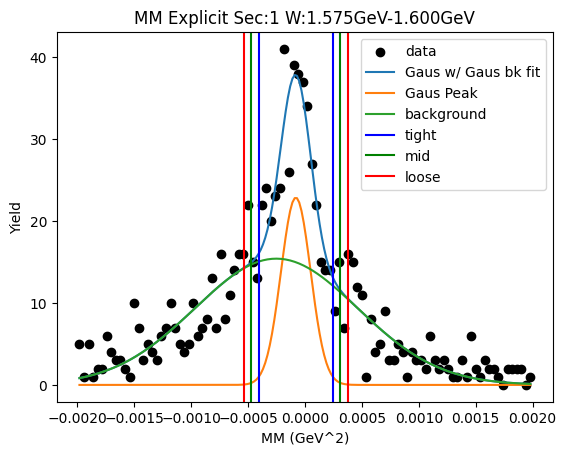

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 2.90854223e+01 -1.65261404e-04  4.43382029e-04]
2nd level W dependent
W1_ini_pars: [ 2.90854223e+01 -1.65261404e-04  4.43382029e-04  1.54076331e+01
 -2.51145775e-04  7.15434517e-04]
Gaus1 Peak: [ 2.30384785e+01 -1.01715240e-04  1.98904432e-04]
Gaus2 Peak: [ 1.27667275e+01 -3.21636668e-04  8.31458460e-04]
tight should be -0.0005989763213499197   0.00039554584054584166
[[-0.00059898  0.          0.        ]
 [ 0.00039555  0.          0.        ]]
mid should be -0.000698428537539496   0.0004949980567354179
[[-0.00059898 -0.00069843  0.        ]
 [ 0.00039555  0.000495    0.        ]]
loose should be -0.0007978807537290722   0.0005944502729249941
[[-0.00059898 -0.00069843 -0.00079788]
 [ 0.00039555  0.000495    0.00059445]]
-1.0834292953017372e-07 1.2903490979026292e-07
Main Gaus Peak [ 2.30384785e+01 -1.01715240e-04  1.98904432e-04]
Gaus2 [ 1.27667275e+01 -3.21636668e-04  8.31458460e-04]


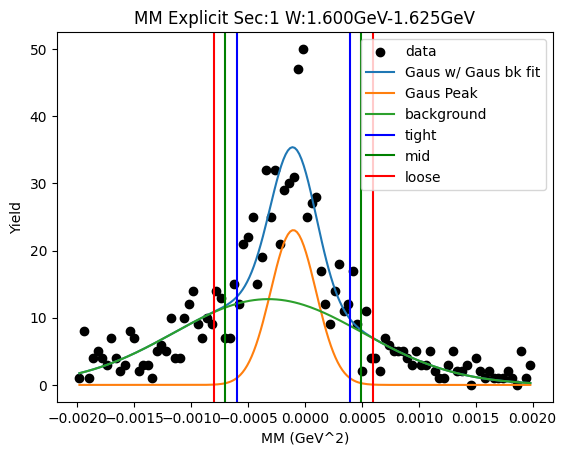

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 3.25323366e+01 -1.38041308e-04  4.10515974e-04]
2nd level W dependent
W1_ini_pars: [ 3.25323366e+01 -1.38041308e-04  4.10515974e-04  1.27667275e+01
 -3.21636668e-04  8.31458460e-04]
Gaus1 Peak: [ 2.65007702e+01 -9.39745981e-05  1.68827227e-04]
Gaus2 Peak: [ 1.45982670e+01 -2.79113406e-04  7.85415044e-04]
tight should be -0.0005160426648675354   0.00032809346858444604
[[-0.00051604  0.          0.        ]
 [ 0.00032809  0.          0.        ]]
mid should be -0.0006004562782127335   0.0004125070819296442
[[-0.00051604 -0.00060046  0.        ]
 [ 0.00032809  0.00041251  0.        ]]
loose should be -0.0006848698915579316   0.0004969206952748422
[[-0.00051604 -0.00060046 -0.00068487]
 [ 0.00032809  0.00041251  0.00049692]]
-7.667667232004655e-08 9.433912251177617e-08
Main Gaus Peak [ 2.65007702e+01 -9.39745981e-05  1.68827227e-04]
Gaus2 [ 1.45982670e+01 -2.79113406e-04  7.85415044e-04]


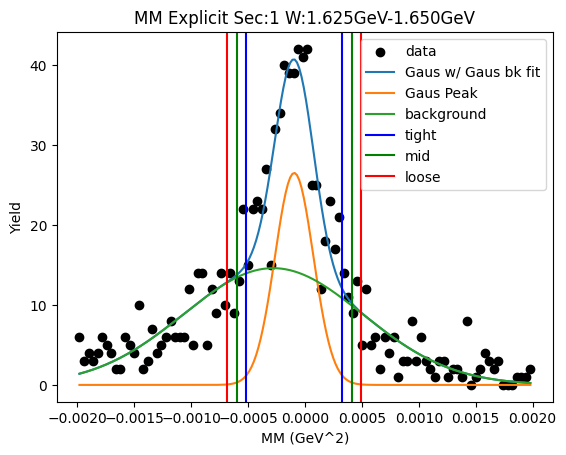

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 3.64405319e+01 -1.87534795e-04  4.24855695e-04]
2nd level W dependent
W1_ini_pars: [ 3.64405319e+01 -1.87534795e-04  4.24855695e-04  1.45982670e+01
 -2.79113406e-04  7.85415044e-04]
Gaus1 Peak: [ 3.03068767e+01 -1.30500489e-04  2.10851385e-04]
Gaus2 Peak: [ 1.39557119e+01 -4.02027296e-04  8.88029174e-04]
tight should be -0.0006576289532023741   0.00039662797420645117
[[-0.00065763  0.          0.        ]
 [ 0.00039663  0.          0.        ]]
mid should be -0.0007630546459432566   0.0005020536669473336
[[-0.00065763 -0.00076305  0.        ]
 [ 0.00039663  0.00050205  0.        ]]
loose should be -0.0008684803386841391   0.0006074793596882162
[[-0.00065763 -0.00076305 -0.00086848]
 [ 0.00039663  0.00050205  0.00060748]]
-1.1634454251953209e-07 1.5040529803794718e-07
Main Gaus Peak [ 3.03068767e+01 -1.30500489e-04  2.10851385e-04]
Gaus2 [ 1.39557119e+01 -4.02027296e-04  8.88029174e-04]


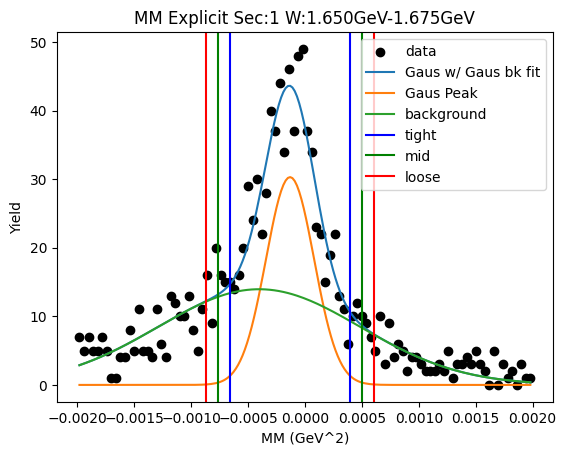

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 4.28536319e+01 -1.72221503e-04  3.94985244e-04]
2nd level W dependent
W1_ini_pars: [ 4.28536319e+01 -1.72221503e-04  3.94985244e-04  1.39557119e+01
 -4.02027296e-04  8.88029174e-04]
Gaus1 Peak: [ 3.93176435e+01 -1.08055082e-04  1.33958529e-04]
Gaus2 Peak: [ 1.99975597e+01 -3.43732844e-04  7.79669944e-04]
tight should be -0.00044295140345253166   0.00022684123987329216
[[-0.00044295  0.          0.        ]
 [ 0.00022684  0.          0.        ]]
mid should be -0.000509930667785114   0.0002938205042058745
[[-0.00044295 -0.00050993  0.        ]
 [ 0.00022684  0.00029382  0.        ]]
loose should be -0.0005769099321176964   0.00036079976853845686
[[-0.00044295 -0.00050993 -0.00057691]
 [ 0.00022684  0.00029382  0.0003608 ]]
-4.2158761505845886e-08 6.551056290696872e-08
Main Gaus Peak [ 3.93176435e+01 -1.08055082e-04  1.33958529e-04]
Gaus2 [ 1.99975597e+01 -3.43732844e-04  7.79669944e-04]


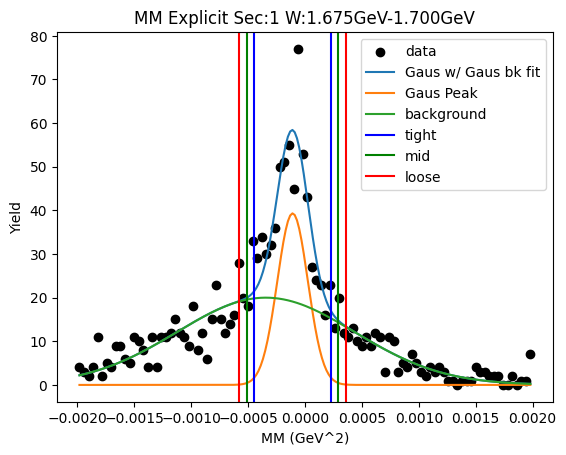

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 5.86866721e+01 -1.59902358e-04  3.55509306e-04]
2nd level W dependent
W1_ini_pars: [ 5.86866721e+01 -1.59902358e-04  3.55509306e-04  1.99975597e+01
 -3.43732844e-04  7.79669944e-04]
Gaus1 Peak: [ 5.18842017e+01 -1.11779282e-04  1.58842995e-04]
Gaus2 Peak: [ 2.27458553e+01 -3.64170236e-04  7.89623255e-04]
tight should be -0.0005088867692181613   0.0002853282053381251
[[-0.00050889  0.          0.        ]
 [ 0.00028533  0.          0.        ]]
mid should be -0.0005883082666737899   0.0003647497027937537
[[-0.00050889 -0.00058831  0.        ]
 [ 0.00028533  0.00036475  0.        ]]
loose should be -0.0006677297641294185   0.00044417120024938233
[[-0.00050889 -0.00058831 -0.00066773]
 [ 0.00028533  0.00036475  0.00044417]]
-6.319868322610705e-08 8.818789896815916e-08
Main Gaus Peak [ 5.18842017e+01 -1.11779282e-04  1.58842995e-04]
Gaus2 [ 2.27458553e+01 -3.64170236e-04  7.89623255e-04]


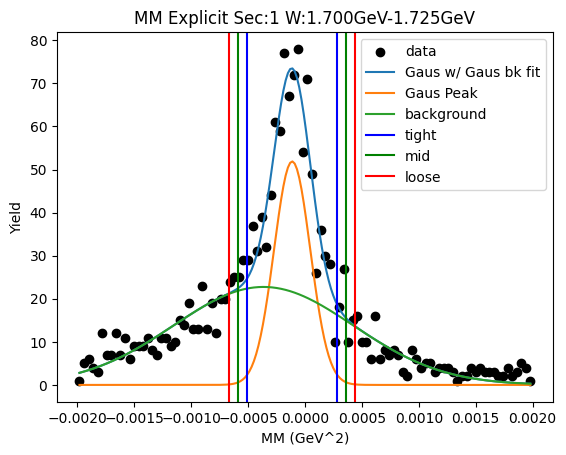

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 6.46997410e+01 -1.59290657e-04  3.83226919e-04]
2nd level W dependent
W1_ini_pars: [ 6.46997410e+01 -1.59290657e-04  3.83226919e-04  2.27458553e+01
 -3.64170236e-04  7.89623255e-04]
Gaus1 Peak: [ 5.46036788e+01 -1.01831737e-04  1.76033180e-04]
Gaus2 Peak: [ 2.61482732e+01 -3.66550116e-04  7.85668194e-04]
tight should be -0.0005419146875320934   0.0003382512143667571
[[-0.00054191  0.          0.        ]
 [ 0.00033825  0.          0.        ]]
mid should be -0.0006299312777219786   0.00042626780455664226
[[-0.00054191 -0.00062993  0.        ]
 [ 0.00033825  0.00042627  0.        ]]
loose should be -0.0007179478679118636   0.0005142843947465273
[[-0.00054191 -0.00062993 -0.00071795]
 [ 0.00033825  0.00042627  0.00051428]]
-8.259333920840814e-08 1.0333274435929197e-07
Main Gaus Peak [ 5.46036788e+01 -1.01831737e-04  1.76033180e-04]
Gaus2 [ 2.61482732e+01 -3.66550116e-04  7.85668194e-04]


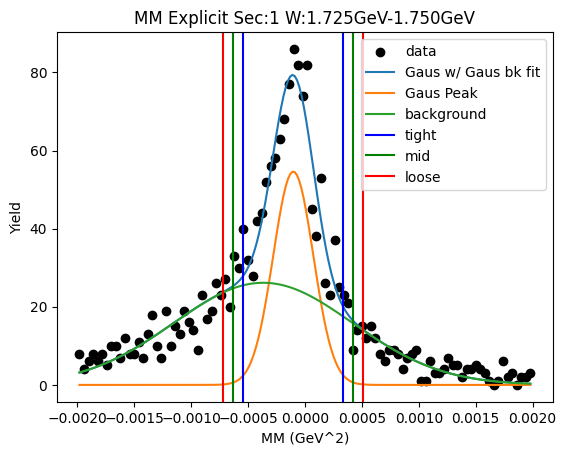

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 6.46536682e+01 -1.68639957e-04  4.06317250e-04]
2nd level W dependent
W1_ini_pars: [ 6.46536682e+01 -1.68639957e-04  4.06317250e-04  2.61482732e+01
 -3.66550116e-04  7.85668194e-04]
Gaus1 Peak: [ 5.98695403e+01 -6.08507868e-05  7.62558135e-05]
Gaus2 Peak: [ 4.27697345e+01 -2.66089704e-04  5.77564169e-04]
tight should be -0.0002514903205480478   0.00012978874695341948
[[-0.00025149  0.          0.        ]
 [ 0.00012979  0.          0.        ]]
mid should be -0.0002896182272981945   0.0001679166537035662
[[-0.00025149 -0.00028962  0.        ]
 [ 0.00012979  0.00016792  0.        ]]
loose should be -0.0003277461340483412   0.0002060445604537129
[[-0.00025149 -0.00028962 -0.00032775]
 [ 0.00012979  0.00016792  0.00020604]]
-1.374202902392243e-08 2.114766553162679e-08
Main Gaus Peak [ 5.98695403e+01 -6.08507868e-05  7.62558135e-05]
Gaus2 [ 4.27697345e+01 -2.66089704e-04  5.77564169e-04]


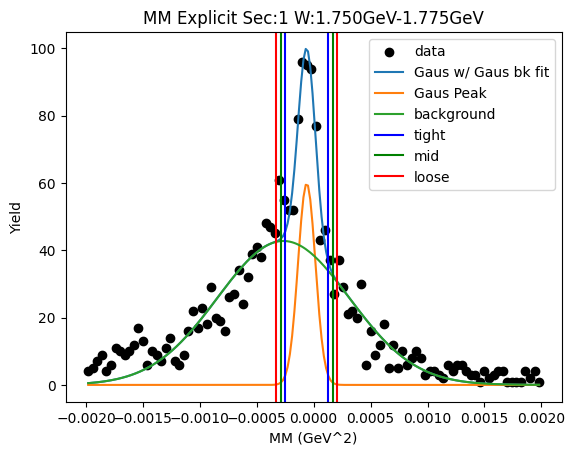

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 5.80764322e+01 -1.84586012e-04  4.41966117e-04]
2nd level W dependent
W1_ini_pars: [ 5.80764322e+01 -1.84586012e-04  4.41966117e-04  4.27697345e+01
 -2.66089704e-04  5.77564169e-04]
Gaus1 Peak: [ 5.40327582e+01 -9.08678665e-05  1.43292029e-04]
Gaus2 Peak: [ 2.86648314e+01 -3.93607680e-04  7.99906320e-04]
tight should be -0.00044909793804278014   0.0002673622049646679
[[-0.0004491   0.          0.        ]
 [ 0.00026736  0.          0.        ]]
mid should be -0.000520743952343525   0.0003390082192654127
[[-0.0004491  -0.00052074  0.        ]
 [ 0.00026736  0.00033901  0.        ]]
loose should be -0.0005923899666442698   0.0004106542335661575
[[-0.0004491  -0.00052074 -0.00059239]
 [ 0.00026736  0.00033901  0.00041065]]
-5.334084721283062e-08 6.985478555155007e-08
Main Gaus Peak [ 5.40327582e+01 -9.08678665e-05  1.43292029e-04]
Gaus2 [ 2.86648314e+01 -3.93607680e-04  7.99906320e-04]


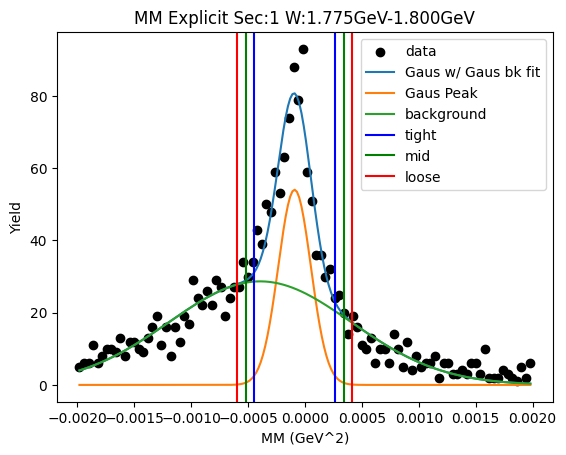

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 5.89328371e+01 -1.67621562e-04  4.04436607e-04]
2nd level W dependent
W1_ini_pars: [ 5.89328371e+01 -1.67621562e-04  4.04436607e-04  2.86648314e+01
 -3.93607680e-04  7.99906320e-04]
Gaus1 Peak: [ 4.81364310e+01 -1.19827153e-04  2.12455824e-04]
Gaus2 Peak: [ 2.16610178e+01 -3.50115498e-04  8.57254149e-04]
tight should be -0.0006509667126742549   0.00041131240622494804
[[-0.00065097  0.          0.        ]
 [ 0.00041131  0.          0.        ]]
mid should be -0.0007571946245641751   0.0005175403181148683
[[-0.00065097 -0.00075719  0.        ]
 [ 0.00041131  0.00051754  0.        ]]
loose should be -0.0008634225364540954   0.0006237682300047886
[[-0.00065097 -0.00075719 -0.00086342]
 [ 0.00041131  0.00051754  0.00062377]]
-1.2105388452398744e-07 1.4977097782383657e-07
Main Gaus Peak [ 4.81364310e+01 -1.19827153e-04  2.12455824e-04]
Gaus2 [ 2.16610178e+01 -3.50115498e-04  8.57254149e-04]


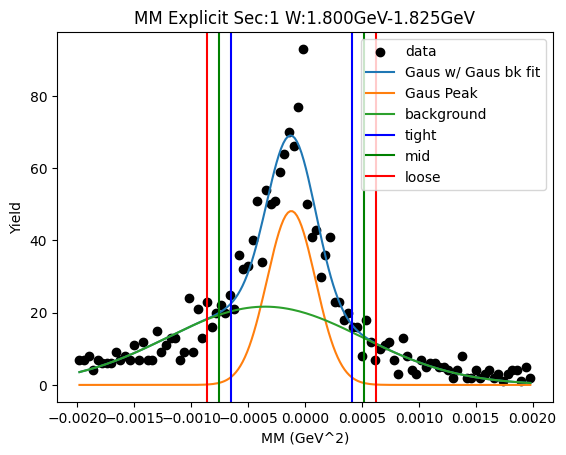

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 5.76584999e+01 -1.70816984e-04  4.18398361e-04]
2nd level W dependent
W1_ini_pars: [ 5.76584999e+01 -1.70816984e-04  4.18398361e-04  2.16610178e+01
 -3.50115498e-04  8.57254149e-04]
Gaus1 Peak: [ 4.69368523e+01 -1.20896228e-04  2.35761970e-04]
Gaus2 Peak: [ 1.99781306e+01 -3.62758285e-04  8.97371403e-04]
tight should be -0.0007103011531691671   0.00046850869691919853
[[-0.0007103   0.          0.        ]
 [ 0.00046851  0.          0.        ]]
mid should be -0.0008281821381780038   0.0005863896819280352
[[-0.0007103  -0.00082818  0.        ]
 [ 0.00046851  0.00058639  0.        ]]
loose should be -0.0009460631231868403   0.0007042706669368717
[[-0.0007103  -0.00082818 -0.00094606]
 [ 0.00046851  0.00058639  0.00070427]]
-1.521352215449944e-07 1.8136701749469087e-07
Main Gaus Peak [ 4.69368523e+01 -1.20896228e-04  2.35761970e-04]
Gaus2 [ 1.99781306e+01 -3.62758285e-04  8.97371403e-04]


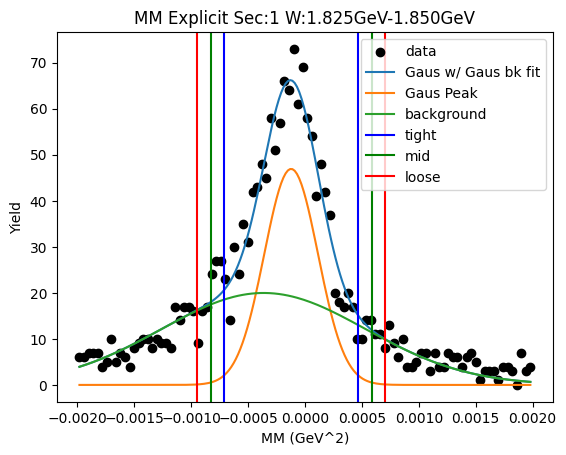

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 5.86690519e+01 -1.71099050e-04  3.84536035e-04]
2nd level W dependent
W1_ini_pars: [ 5.86690519e+01 -1.71099050e-04  3.84536035e-04  1.99781306e+01
 -3.62758285e-04  8.97371403e-04]
Gaus1 Peak: [ 5.18010531e+01 -1.23186532e-04  1.95831092e-04]
Gaus2 Peak: [ 1.98830362e+01 -4.44859452e-04  9.80225885e-04]
tight should be -0.0006127642618633084   0.000366391196995542
[[-0.00061276  0.          0.        ]
 [ 0.00036639  0.          0.        ]]
mid should be -0.0007106798077491934   0.00046430674288142694
[[-0.00061276 -0.00071068  0.        ]
 [ 0.00036639  0.00046431  0.        ]]
loose should be -0.0008085953536350785   0.000562222288767312
[[-0.00061276 -0.00071068 -0.0008086 ]
 [ 0.00036639  0.00046431  0.00056222]]
-9.987452774048612e-08 1.3022437128665446e-07
Main Gaus Peak [ 5.18010531e+01 -1.23186532e-04  1.95831092e-04]
Gaus2 [ 1.98830362e+01 -4.44859452e-04  9.80225885e-04]


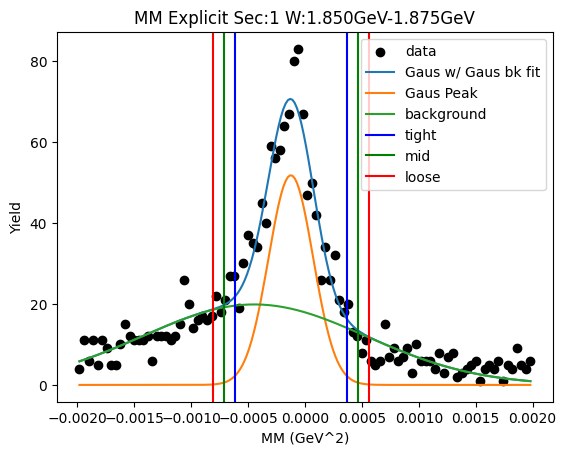

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 5.81675475e+01 -1.79482775e-04  3.79837249e-04]
2nd level W dependent
W1_ini_pars: [ 5.81675475e+01 -1.79482775e-04  3.79837249e-04  1.98830362e+01
 -4.44859452e-04  9.80225885e-04]
Gaus1 Peak: [ 5.00876957e+01 -1.41588886e-04  2.06614436e-04]
Gaus2 Peak: [ 1.89959529e+01 -4.09622844e-04  9.31555207e-04]
tight should be -0.0006581249758441802   0.00037494720435205095
[[-0.00065812  0.          0.        ]
 [ 0.00037495  0.          0.        ]]
mid should be -0.0007614321938638032   0.000478254422371674
[[-0.00065812 -0.00076143  0.        ]
 [ 0.00037495  0.00047825  0.        ]]
loose should be -0.0008647394118834262   0.000581561640391297
[[-0.00065812 -0.00076143 -0.00086474]
 [ 0.00037495  0.00047825  0.00058156]]
-1.0802116297263514e-07 1.4811598810625942e-07
Main Gaus Peak [ 5.00876957e+01 -1.41588886e-04  2.06614436e-04]
Gaus2 [ 1.89959529e+01 -4.09622844e-04  9.31555207e-04]


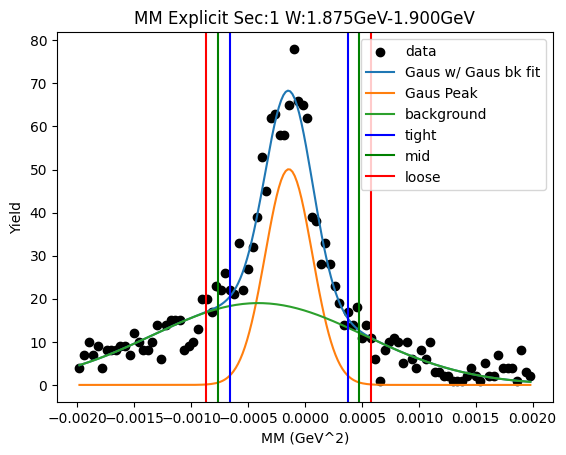

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 6.21731198e+01 -1.76457981e-04  3.89375755e-04]
2nd level W dependent
W1_ini_pars: [ 6.21731198e+01 -1.76457981e-04  3.89375755e-04  1.89959529e+01
 -4.09622844e-04  9.31555207e-04]
Gaus1 Peak: [ 5.36614331e+01 -1.21053579e-04  1.76564359e-04]
Gaus2 Peak: [ 2.47905367e+01 -4.01107226e-04  8.28237900e-04]
tight should be -0.0005624644764202687   0.00032035731824690106
[[-0.00056246  0.          0.        ]
 [ 0.00032036  0.          0.        ]]
mid should be -0.0006507466558869858   0.0004086394977136181
[[-0.00056246 -0.00065075  0.        ]
 [ 0.00032036  0.00040864  0.        ]]
loose should be -0.0007390288353537027   0.000496921677180335
[[-0.00056246 -0.00065075 -0.00073903]
 [ 0.00032036  0.00040864  0.00049692]]
-7.887094952702749e-08 1.0817888754641952e-07
Main Gaus Peak [ 5.36614331e+01 -1.21053579e-04  1.76564359e-04]
Gaus2 [ 2.47905367e+01 -4.01107226e-04  8.28237900e-04]


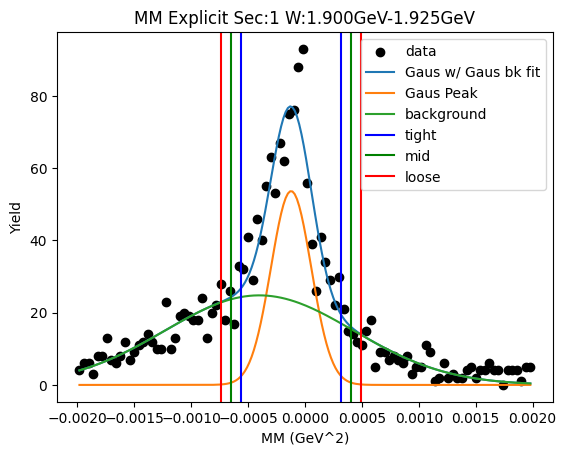

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 5.87167318e+01 -1.82315805e-04  4.00040931e-04]
2nd level W dependent
W1_ini_pars: [ 5.87167318e+01 -1.82315805e-04  4.00040931e-04  2.47905367e+01
 -4.01107226e-04  8.28237900e-04]
Gaus1 Peak: [ 5.26795771e+01 -1.04311036e-04  1.45291614e-04]
Gaus2 Peak: [ 2.71579036e+01 -3.67633614e-04  7.64707558e-04]
tight should be -0.0004675400717857789   0.0002589180006288817
[[-0.00046754  0.          0.        ]
 [ 0.00025892  0.          0.        ]]
mid should be -0.000540185879027245   0.00033156380787034776
[[-0.00046754 -0.00054019  0.        ]
 [ 0.00025892  0.00033156  0.        ]]
loose should be -0.000612831686268711   0.00040420961511181385
[[-0.00046754 -0.00054019 -0.00061283]
 [ 0.00025892  0.00033156  0.00040421]]
-5.244816757372255e-08 7.420975186061929e-08
Main Gaus Peak [ 5.26795771e+01 -1.04311036e-04  1.45291614e-04]
Gaus2 [ 2.71579036e+01 -3.67633614e-04  7.64707558e-04]


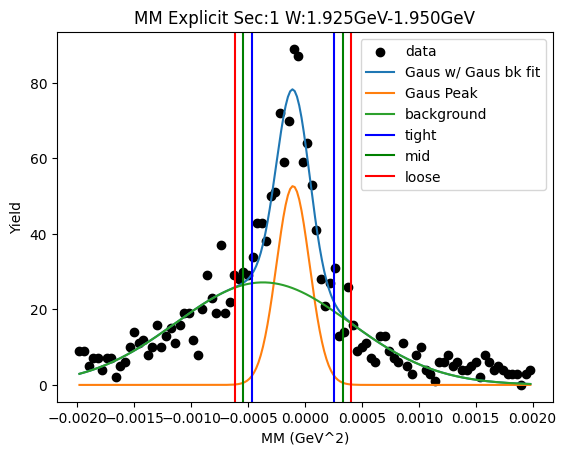

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 6.41271339e+01 -1.91766012e-04  3.73861877e-04]
2nd level W dependent
W1_ini_pars: [ 6.41271339e+01 -1.91766012e-04  3.73861877e-04  2.71579036e+01
 -3.67633614e-04  7.64707558e-04]
Gaus1 Peak: [ 5.57418050e+01 -1.20227161e-04  1.73944940e-04]
Gaus2 Peak: [ 2.51419981e+01 -4.40500594e-04  8.00005346e-04]
tight should be -0.0005550895105109196   0.0003146351884956913
[[-0.00055509  0.          0.        ]
 [ 0.00031464  0.          0.        ]]
mid should be -0.0006420619804115808   0.00040160765839635247
[[-0.00055509 -0.00064206  0.        ]
 [ 0.00031464  0.00040161  0.        ]]
loose should be -0.0007290344503122419   0.0004885801282970136
[[-0.00055509 -0.00064206 -0.00072903]
 [ 0.00031464  0.00040161  0.00048858]]
-7.631595600350605e-08 1.052250964914076e-07
Main Gaus Peak [ 5.57418050e+01 -1.20227161e-04  1.73944940e-04]
Gaus2 [ 2.51419981e+01 -4.40500594e-04  8.00005346e-04]


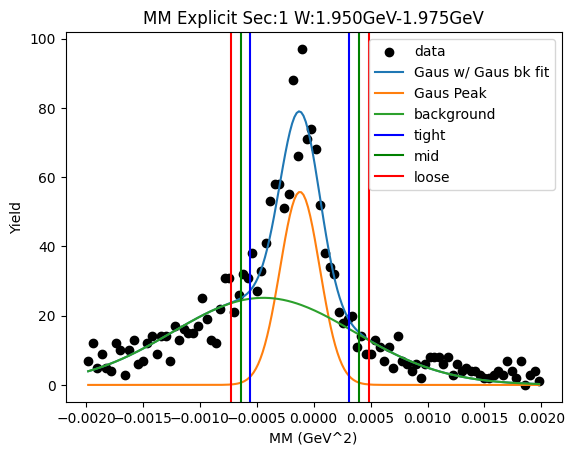

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 6.24916547e+01 -1.89417885e-04  3.72747041e-04]
2nd level W dependent
W1_ini_pars: [ 6.24916547e+01 -1.89417885e-04  3.72747041e-04  2.51419981e+01
 -4.40500594e-04  8.00005346e-04]
Gaus1 Peak: [ 4.96696827e+01 -1.26041356e-04  1.87607287e-04]
Gaus2 Peak: [ 2.51032101e+01 -3.64593493e-04  7.29483315e-04]
tight should be -0.0005950595743826121   0.00034297686231610995
[[-0.00059506  0.          0.        ]
 [ 0.00034298  0.          0.        ]]
mid should be -0.0006888632180524842   0.00043678050598598207
[[-0.00059506 -0.00068886  0.        ]
 [ 0.00034298  0.00043678  0.        ]]
loose should be -0.0007826668617223565   0.0005305841496558543
[[-0.00059506 -0.00068886 -0.00078267]
 [ 0.00034298  0.00043678  0.00053058]]
-8.970305935823148e-08 1.2147590621963302e-07
Main Gaus Peak [ 4.96696827e+01 -1.26041356e-04  1.87607287e-04]
Gaus2 [ 2.51032101e+01 -3.64593493e-04  7.29483315e-04]


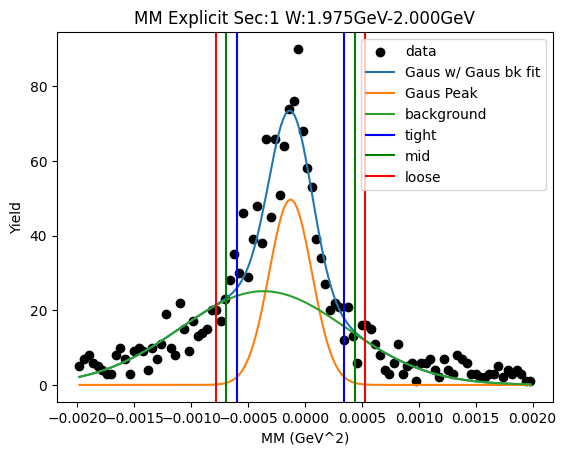

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 5.83255424e+01 -1.61141226e-04  3.77855681e-04]
2nd level W dependent
W1_ini_pars: [ 5.83255424e+01 -1.61141226e-04  3.77855681e-04  2.51032101e+01
 -3.64593493e-04  7.29483315e-04]
Gaus1 Peak: [ 5.00160142e+01 -9.40891556e-05  1.82683784e-04]
Gaus2 Peak: [ 2.22129394e+01 -4.06662199e-04  8.26629143e-04]
tight should be -0.0005507986168052746   0.00036262030558640256
[[-0.0005508   0.          0.        ]
 [ 0.00036262  0.          0.        ]]
mid should be -0.0006421405090444423   0.0004539621978255702
[[-0.0005508  -0.00064214  0.        ]
 [ 0.00036262  0.00045396  0.        ]]
loose should be -0.00073348240128361   0.0005453040900647379
[[-0.0005508  -0.00064214 -0.00073348]
 [ 0.00036262  0.00045396  0.0005453 ]]
-9.126732613068404e-08 1.0897286453727738e-07
Main Gaus Peak [ 5.00160142e+01 -9.40891556e-05  1.82683784e-04]
Gaus2 [ 2.22129394e+01 -4.06662199e-04  8.26629143e-04]


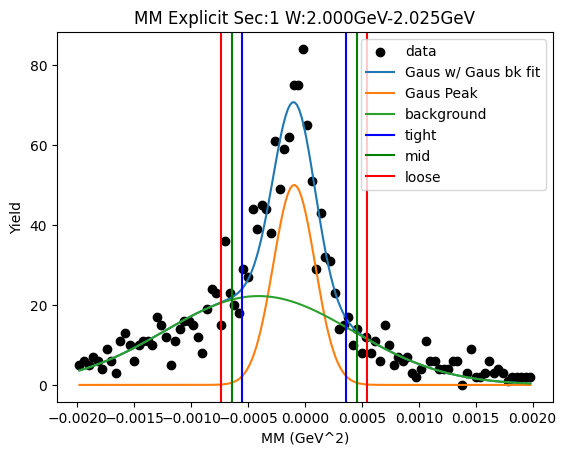

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 5.79144656e+01 -1.87306965e-04  3.75326173e-04]
2nd level W dependent
W1_ini_pars: [ 5.79144656e+01 -1.87306965e-04  3.75326173e-04  2.22129394e+01
 -4.06662199e-04  8.26629143e-04]
Gaus1 Peak: [ 5.06153316e+01 -7.96229319e-05  1.18977164e-04]
Gaus2 Peak: [ 3.11551220e+01 -3.60022387e-04  6.12739817e-04]
tight should be -0.0003770658430012217   0.00021781997916006814
[[-0.00037707  0.          0.        ]
 [ 0.00021782  0.          0.        ]]
mid should be -0.00043655442521735066   0.0002773085613761971
[[-0.00037707 -0.00043655  0.        ]
 [ 0.00021782  0.00027731  0.        ]]
loose should be -0.0004960430074334797   0.0003367971435923261
[[-0.00037707 -0.00043655 -0.00049604]
 [ 0.00021782  0.00027731  0.0003368 ]]
-3.6126885681392845e-08 4.880650825665045e-08
Main Gaus Peak [ 5.06153316e+01 -7.96229319e-05  1.18977164e-04]
Gaus2 [ 3.11551220e+01 -3.60022387e-04  6.12739817e-04]


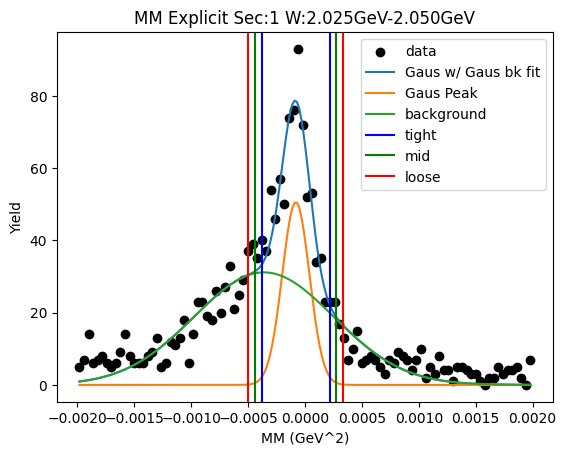

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 5.74608607e+01 -1.67065832e-04  3.48279009e-04]
2nd level W dependent
W1_ini_pars: [ 5.74608607e+01 -1.67065832e-04  3.48279009e-04  3.11551220e+01
 -3.60022387e-04  6.12739817e-04]
Gaus1 Peak: [ 5.37080863e+01 -9.26654112e-05  1.21666069e-04]
Gaus2 Peak: [ 2.56569760e+01 -3.61073661e-04  7.35175901e-04]
tight should be -0.0003968305837490333   0.00021149976127884116
[[-0.00039683  0.          0.        ]
 [ 0.0002115   0.          0.        ]]
mid should be -0.00045766361825182075   0.0002723327957816286
[[-0.00039683 -0.00045766  0.        ]
 [ 0.0002115   0.00027233  0.        ]]
loose should be -0.0005184966527546082   0.00033316583028441605
[[-0.00039683 -0.00045766 -0.0005185 ]
 [ 0.0002115   0.00027233  0.00033317]]
-3.5821018602438465e-08 5.29947754811774e-08
Main Gaus Peak [ 5.37080863e+01 -9.26654112e-05  1.21666069e-04]
Gaus2 [ 2.56569760e+01 -3.61073661e-04  7.35175901e-04]


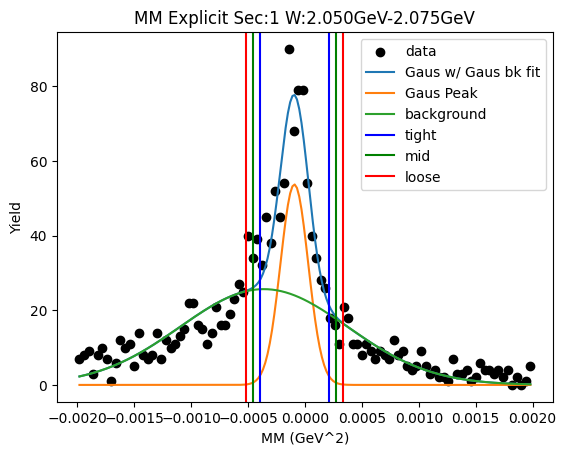

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 6.03626737e+01 -1.50298527e-04  3.19643121e-04]
2nd level W dependent
W1_ini_pars: [ 6.03626737e+01 -1.50298527e-04  3.19643121e-04  2.56569760e+01
 -3.61073661e-04  7.35175901e-04]
Gaus1 Peak: [ 5.66749879e+01 -8.30526009e-05  1.28458815e-04]
Gaus2 Peak: [ 2.46106115e+01 -3.64801357e-04  6.80557883e-04]
tight should be -0.0004041996394005673   0.0002380944375422618
[[-0.0004042   0.          0.        ]
 [ 0.00023809  0.          0.        ]]
mid should be -0.00046842904709485023   0.0003023238452365447
[[-0.0004042  -0.00046843  0.        ]
 [ 0.00023809  0.00030232  0.        ]]
loose should be -0.0005326584547891332   0.00036655325293082763
[[-0.0004042  -0.00046843 -0.00053266]
 [ 0.00023809  0.00030232  0.00036655]]
-4.26072672320038e-08 5.640273627419801e-08
Main Gaus Peak [ 5.66749879e+01 -8.30526009e-05  1.28458815e-04]
Gaus2 [ 2.46106115e+01 -3.64801357e-04  6.80557883e-04]


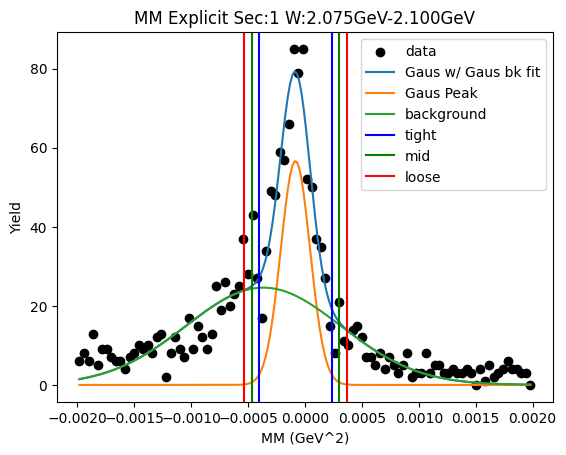

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 5.39467352e+01 -2.05595617e-04  3.58185614e-04]
2nd level W dependent
W1_ini_pars: [ 5.39467352e+01 -2.05595617e-04  3.58185614e-04  2.46106115e+01
 -3.64801357e-04  6.80557883e-04]
Gaus1 Peak: [ 4.62471939e+01 -1.40893802e-04  2.01191826e-04]
Gaus2 Peak: [ 1.78491450e+01 -5.05535141e-04  8.49982793e-04]
tight should be -0.0006438733664128289   0.0003620857628549892
[[-0.00064387  0.          0.        ]
 [ 0.00036209  0.          0.        ]]
mid should be -0.0007444692793396107   0.000462681675781771
[[-0.00064387 -0.00074447  0.        ]
 [ 0.00036209  0.00046268  0.        ]]
loose should be -0.0008450651922663925   0.0005632775887085528
[[-0.00064387 -0.00074447 -0.00084507]
 [ 0.00036209  0.00046268  0.00056328]]
-1.0158338899115443e-07 1.4128551575058956e-07
Main Gaus Peak [ 4.62471939e+01 -1.40893802e-04  2.01191826e-04]
Gaus2 [ 1.78491450e+01 -5.05535141e-04  8.49982793e-04]


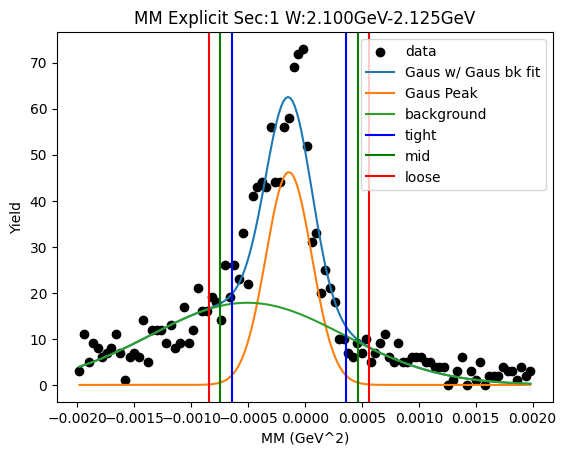

initial bw fit:  [ 1.96667919e+03 -1.60328336e-04  2.62505036e-04]
input parameters for r2 [ 1.96667919e+03 -1.60328336e-04  2.62505036e-04  5.00000000e+02
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 1.86798649e+03 -1.01101590e-04  1.25867311e-04  6.79167921e+02
 -4.74066562e-04  6.75620603e-04]
-3.730620864936338e-08 5.774927163962786e-08
Main Gaus Peak [ 1.86798649e+03 -1.01101590e-04  1.25867311e-04]
Gaus2 [ 6.79167921e+02 -4.74066562e-04  6.75620603e-04]


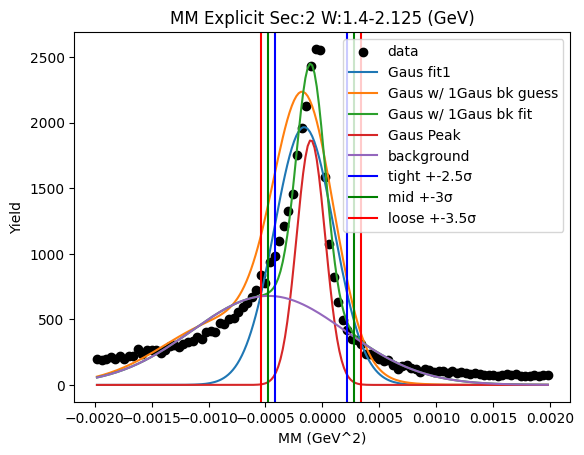

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 1.25999949e+01 -1.20096708e-04  1.33844321e-04]
2nd level W dependent
W1_ini_pars: [ 1.25999949e+01 -1.20096708e-04  1.33844321e-04  3.07211428e+00
 -1.00000000e-02  6.74285300e-02]
Gaus1 Peak: [ 1.09238517e+01 -1.01656316e-04  9.37097204e-05]
Gaus2 Peak: [ 3.26204906e+00 -3.06744974e-04  3.48844699e-04]
tight should be -0.0003359306174064898   0.00013261798461434025
[[-0.00033593  0.          0.        ]
 [ 0.00013262  0.          0.        ]]
mid should be -0.00038278547760857277   0.00017947284481642327
[[-0.00033593 -0.00038279  0.        ]
 [ 0.00013262  0.00017947  0.        ]]
loose should be -0.00042964033781065576   0.00022632770501850627
[[-0.00033593 -0.00038279 -0.00042964]
 [ 0.00013262  0.00017947  0.00022633]]
-1.6010528431462045e-08 3.667854175789975e-08
Main Gaus Peak [ 1.09238517e+01 -1.01656316e-04  9.37097204e-05]
Gaus2 [ 3.26204906e+00 -3.06744974e-04  3.48844699e-04]


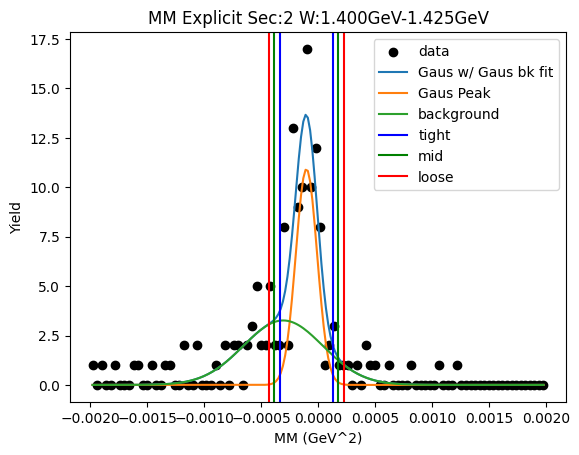

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 1.64677330e+01 -1.10376048e-04  1.61142141e-04]
2nd level W dependent
W1_ini_pars: [ 1.64677330e+01 -1.10376048e-04  1.61142141e-04  3.26204906e+00
 -3.06744974e-04  3.48844699e-04]
Gaus1 Peak: [ 1.49341280e+01 -8.84260665e-05  1.08967145e-04]
Gaus2 Peak: [ 3.98599900e+00 -4.15469845e-04  5.33538566e-04]
tight should be -0.00036084392796897365   0.0001839917949998915
[[-0.00036084  0.          0.        ]
 [ 0.00018399  0.          0.        ]]
mid should be -0.00041532750026586015   0.000238475367296778
[[-0.00036084 -0.00041533  0.        ]
 [ 0.00018399  0.00023848  0.        ]]
loose should be -0.00046981107256274666   0.0002929589395936645
[[-0.00036084 -0.00041533 -0.00046981]
 [ 0.00018399  0.00023848  0.00029296]]
-2.7802346568832236e-08 4.3440685036689186e-08
Main Gaus Peak [ 1.49341280e+01 -8.84260665e-05  1.08967145e-04]
Gaus2 [ 3.98599900e+00 -4.15469845e-04  5.33538566e-04]


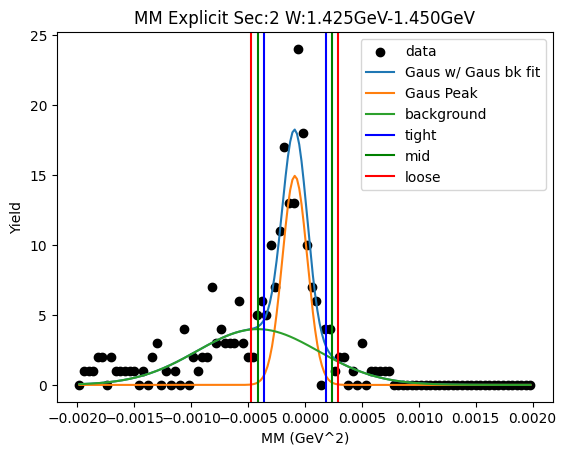

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 1.60852538e+01 -1.61470688e-04  2.34768600e-04]
2nd level W dependent
W1_ini_pars: [ 1.60852538e+01 -1.61470688e-04  2.34768600e-04  3.98599900e+00
 -4.15469845e-04  5.33538566e-04]
Gaus1 Peak: [ 2.31470129e+01 -1.34292575e-04  3.14272901e-05]
Gaus2 Peak: [ 1.00236601e+01 -2.25383398e-04  3.51272594e-04]
tight should be -0.0002128608003932237   -5.572434973659016e-05
[[-2.12860800e-04  0.00000000e+00  0.00000000e+00]
 [-5.57243497e-05  0.00000000e+00  0.00000000e+00]]
mid should be -0.00022857444545888706   -4.00107046709268e-05
[[-2.12860800e-04 -2.28574445e-04  0.00000000e+00]
 [-5.57243497e-05 -4.00107047e-05  0.00000000e+00]]
loose should be -0.0002442880905245504   -2.4297059605263448e-05
[[-2.12860800e-04 -2.28574445e-04 -2.44288091e-04]
 [-5.57243497e-05 -4.00107047e-05 -2.42970596e-05]]
1.5071472022567907e-08 2.099751941255942e-08
Main Gaus Peak [ 2.31470129e+01 -1.34292575e-04  3.14272901e-05]
Gaus2 [ 1.00236601e+01 -2.25383398e-

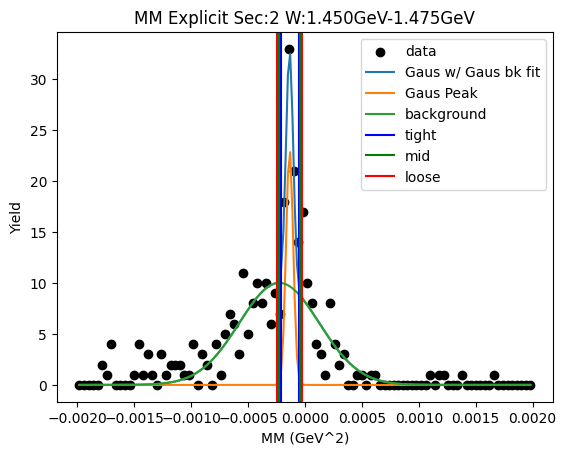

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 2.49227685e+01 -8.00132522e-05  1.41887088e-04]
2nd level W dependent
W1_ini_pars: [ 2.49227685e+01 -8.00132522e-05  1.41887088e-04  1.00236601e+01
 -2.25383398e-04  3.51272594e-04]
Gaus1 Peak: [ 2.74842364e+01 -4.84457561e-05  5.97700809e-05]
Gaus2 Peak: [ 8.74028368e+00 -4.02857346e-04  4.71895613e-04]
tight should be -0.00019787095844814054   0.00010097944629640265
[[-0.00019787  0.          0.        ]
 [ 0.00010098  0.          0.        ]]
mid should be -0.00022775599892259487   0.00013086448677085698
[[-0.00019787 -0.00022776  0.        ]
 [ 0.00010098  0.00013086  0.        ]]
loose should be -0.0002576410393970492   0.00016074952724531128
[[-0.00019787 -0.00022776 -0.00025764]
 [ 0.00010098  0.00013086  0.00016075]]
-8.370396448154682e-09 1.3064379011679868e-08
Main Gaus Peak [ 2.74842364e+01 -4.84457561e-05  5.97700809e-05]
Gaus2 [ 8.74028368e+00 -4.02857346e-04  4.71895613e-04]


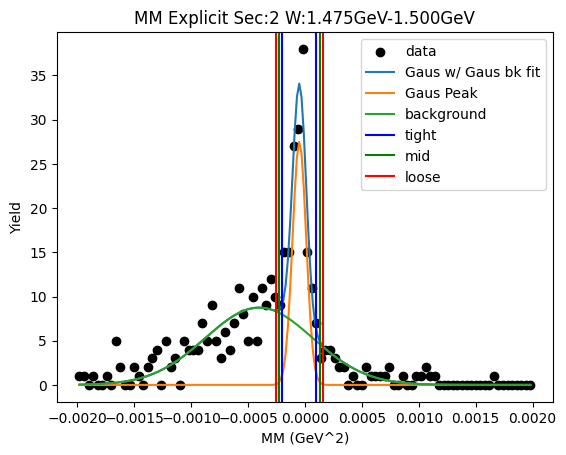

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 2.42825286e+01 -1.33723959e-04  2.56246308e-04]
2nd level W dependent
W1_ini_pars: [ 2.42825286e+01 -1.33723959e-04  2.56246308e-04  8.74028368e+00
 -4.02857346e-04  4.71895613e-04]
Gaus1 Peak: [ 2.21603556e+01 -5.71752759e-05  8.82305993e-05]
Gaus2 Peak: [ 1.22643255e+01 -3.00797024e-04  4.32584022e-04]
tight should be -0.0002777517740720295   0.00016340122219863173
[[-0.00027775  0.          0.        ]
 [ 0.0001634   0.          0.        ]]
mid should be -0.00032186707369909564   0.0002075165218256979
[[-0.00027775 -0.00032187  0.        ]
 [ 0.0001634   0.00020752  0.        ]]
loose should be -0.0003659823733261618   0.000251631821452764
[[-0.00027775 -0.00032187 -0.00036598]
 [ 0.0001634   0.00020752  0.00025163]]
-2.0084903755792192e-08 2.662292811266751e-08
Main Gaus Peak [ 2.21603556e+01 -5.71752759e-05  8.82305993e-05]
Gaus2 [ 1.22643255e+01 -3.00797024e-04  4.32584022e-04]


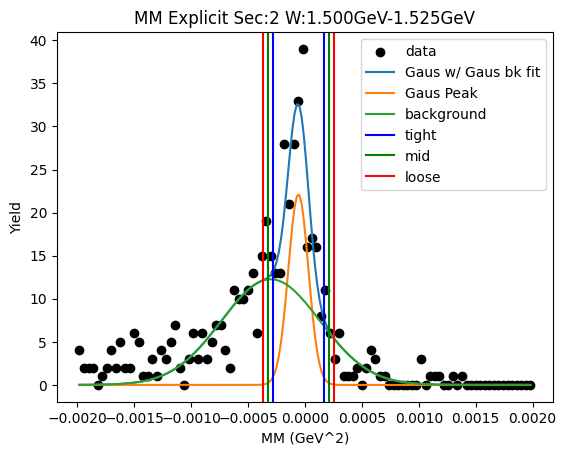

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 2.11093812e+01 -1.59092679e-04  2.94560080e-04]
2nd level W dependent
W1_ini_pars: [ 2.11093812e+01 -1.59092679e-04  2.94560080e-04  1.22643255e+01
 -3.00797024e-04  4.32584022e-04]
Gaus1 Peak: [ 2.01736715e+01 -7.94977565e-05  1.27963191e-04]
Gaus2 Peak: [ 8.69807760e+00 -4.98405825e-04  6.19783266e-04]
tight should be -0.00039940573373421025   0.0002404102207743422
[[-0.00039941  0.          0.        ]
 [ 0.00024041  0.          0.        ]]
mid should be -0.0004633873291850655   0.00030439181622519745
[[-0.00039941 -0.00046339  0.        ]
 [ 0.00024041  0.00030439  0.        ]]
loose should be -0.0005273689246359207   0.0003683734116760527
[[-0.00039941 -0.00046339 -0.00052737]
 [ 0.00024041  0.00030439  0.00036837]]
-4.280384139189992e-08 5.54436279625857e-08
Main Gaus Peak [ 2.01736715e+01 -7.94977565e-05  1.27963191e-04]
Gaus2 [ 8.69807760e+00 -4.98405825e-04  6.19783266e-04]


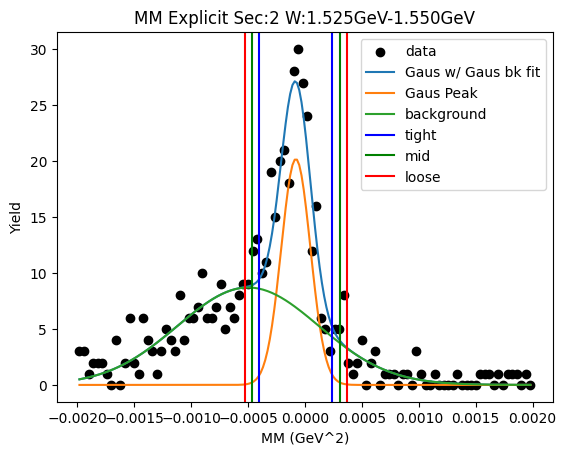

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 3.02658849e+01 -1.30908308e-04  2.20504202e-04]
2nd level W dependent
W1_ini_pars: [ 3.02658849e+01 -1.30908308e-04  2.20504202e-04  8.69807760e+00
 -4.98405825e-04  6.19783266e-04]
Gaus1 Peak: [ 2.89946336e+01 -9.72925621e-05  1.44229135e-04]
Gaus2 Peak: [ 6.86652772e+00 -6.24249750e-04  7.58318758e-04]
tight should be -0.00045786539946611455   0.0002632802753619341
[[-0.00045787  0.          0.        ]
 [ 0.00026328  0.          0.        ]]
mid should be -0.0005299799669489195   0.000335394842844739
[[-0.00045787 -0.00052998  0.        ]
 [ 0.00026328  0.00033539  0.        ]]
loose should be -0.0006020945344317243   0.0004075094103275439
[[-0.00045787 -0.00052998 -0.00060209]
 [ 0.00026328  0.00033539  0.00040751]]
-5.2940287488124387e-08 7.187197274944405e-08
Main Gaus Peak [ 2.89946336e+01 -9.72925621e-05  1.44229135e-04]
Gaus2 [ 6.86652772e+00 -6.24249750e-04  7.58318758e-04]


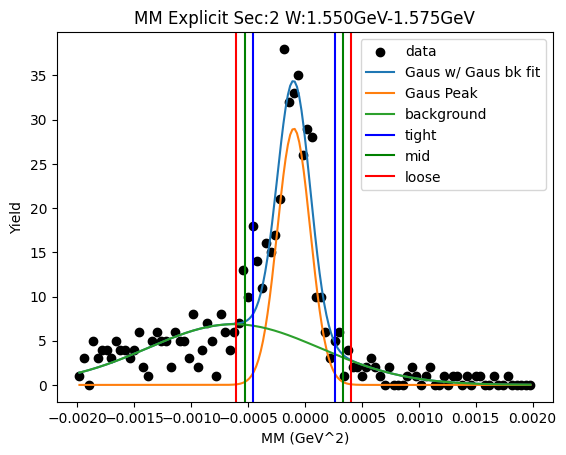

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 2.51141898e+01 -1.45187662e-04  2.50948700e-04]
2nd level W dependent
W1_ini_pars: [ 2.51141898e+01 -1.45187662e-04  2.50948700e-04  6.86652772e+00
 -6.24249750e-04  7.58318758e-04]
Gaus1 Peak: [ 2.33300362e+01 -1.02614169e-04  1.64469409e-04]
Gaus2 Peak: [ 6.60697267e+00 -6.63629857e-04  7.24046277e-04]
tight should be -0.0005137876912036521   0.00030855935248897065
[[-0.00051379  0.          0.        ]
 [ 0.00030856  0.          0.        ]]
mid should be -0.0005960223955729144   0.00039079405685823283
[[-0.00051379 -0.00059602  0.        ]
 [ 0.00030856  0.00039079  0.        ]]
loose should be -0.0006782570999421766   0.0004730287612274951
[[-0.00051379 -0.00059602 -0.00067826]
 [ 0.00030856  0.00039079  0.00047303]]
-7.062089147950255e-08 9.168022698529655e-08
Main Gaus Peak [ 2.33300362e+01 -1.02614169e-04  1.64469409e-04]
Gaus2 [ 6.60697267e+00 -6.63629857e-04  7.24046277e-04]


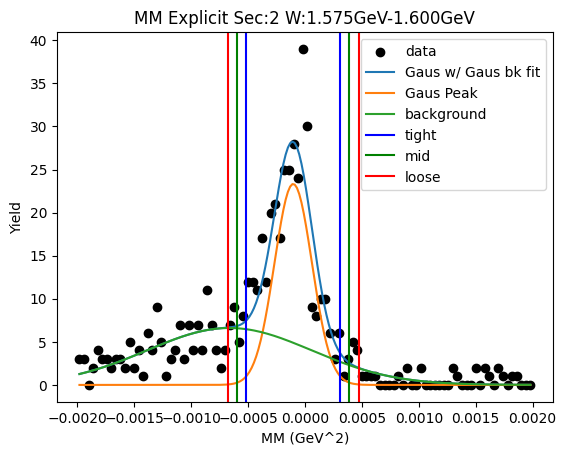

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 3.05381434e+01 -1.45668073e-04  2.21139474e-04]
2nd level W dependent
W1_ini_pars: [ 3.05381434e+01 -1.45668073e-04  2.21139474e-04  6.60697267e+00
 -6.63629857e-04  7.24046277e-04]
Gaus1 Peak: [ 2.82206208e+01 -1.01416608e-04  1.27379520e-04]
Gaus2 Peak: [ 9.18554298e+00 -5.14514985e-04  6.36821637e-04]
tight should be -0.00041986540842594704   0.00021703219169062548
[[-0.00041987  0.          0.        ]
 [ 0.00021703  0.          0.        ]]
mid should be -0.0004835551684376043   0.00028072195170228273
[[-0.00041987 -0.00048356  0.        ]
 [ 0.00021703  0.00028072  0.        ]]
loose should be -0.0005472449284492616   0.00034441171171394
[[-0.00041987 -0.00048356 -0.00054724]
 [ 0.00021703  0.00028072  0.00034441]]
-3.839129791131046e-08 5.8961954816909426e-08
Main Gaus Peak [ 2.82206208e+01 -1.01416608e-04  1.27379520e-04]
Gaus2 [ 9.18554298e+00 -5.14514985e-04  6.36821637e-04]


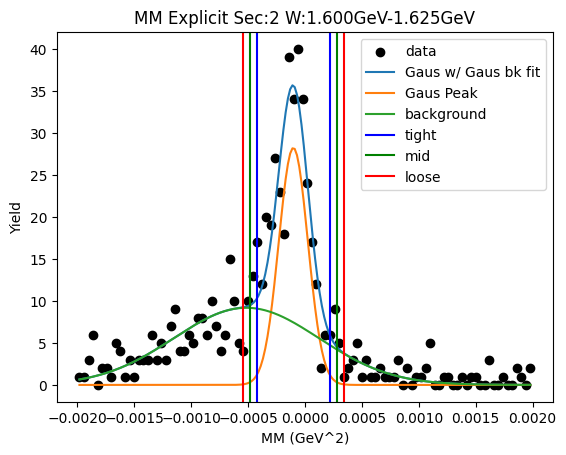

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 2.99122447e+01 -1.35234139e-04  2.69067718e-04]
2nd level W dependent
W1_ini_pars: [ 2.99122447e+01 -1.35234139e-04  2.69067718e-04  9.18554298e+00
 -5.14514985e-04  6.36821637e-04]
Gaus1 Peak: [ 2.90723813e+01 -6.69427742e-05  9.51777825e-05]
Gaus2 Peak: [ 1.35226177e+01 -3.40449763e-04  5.27075863e-04]
tight should be -0.0003048872303359262   0.00017100168197399922
[[-0.00030489  0.          0.        ]
 [ 0.000171    0.          0.        ]]
mid should be -0.00035247612156691886   0.0002185905732049918
[[-0.00030489 -0.00035248  0.        ]
 [ 0.000171    0.00021859  0.        ]]
loose should be -0.0004000650127979114   0.0002661794644359843
[[-0.00030489 -0.00035248 -0.00040007]
 [ 0.000171    0.00021859  0.00026618]]
-2.2695095808099402e-08 3.165776583818635e-08
Main Gaus Peak [ 2.90723813e+01 -6.69427742e-05  9.51777825e-05]
Gaus2 [ 1.35226177e+01 -3.40449763e-04  5.27075863e-04]


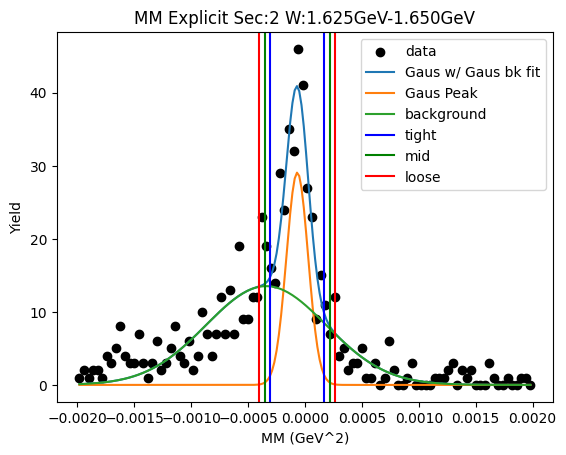

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 3.16282531e+01 -1.90602948e-04  3.04509371e-04]
2nd level W dependent
W1_ini_pars: [ 3.16282531e+01 -1.90602948e-04  3.04509371e-04  1.35226177e+01
 -3.40449763e-04  5.27075863e-04]
Gaus1 Peak: [ 2.94001942e+01 -1.16310380e-04  1.43453868e-04]
Gaus2 Peak: [ 1.19675260e+01 -5.32448682e-04  6.78561425e-04]
tight should be -0.00047494505065980854   0.00024232429099313186
[[-0.00047495  0.          0.        ]
 [ 0.00024232  0.          0.        ]]
mid should be -0.0005466719848251026   0.0003140512251584259
[[-0.00047495 -0.00054667  0.        ]
 [ 0.00024232  0.00031405  0.        ]]
loose should be -0.0006183989189903966   0.00038577815932372
[[-0.00047495 -0.00054667 -0.0006184 ]
 [ 0.00024232  0.00031405  0.00038578]]
-4.820893256005366e-08 7.526514147400454e-08
Main Gaus Peak [ 2.94001942e+01 -1.16310380e-04  1.43453868e-04]
Gaus2 [ 1.19675260e+01 -5.32448682e-04  6.78561425e-04]


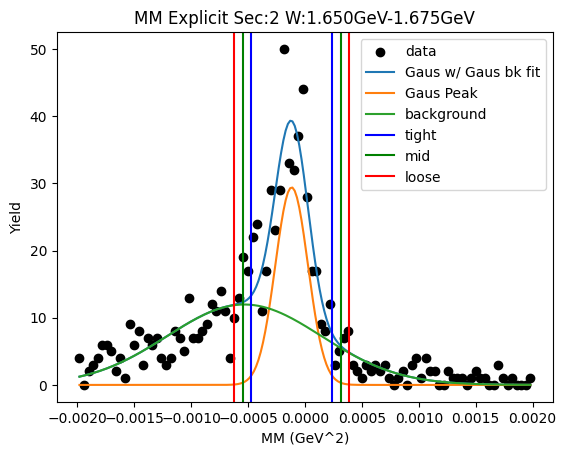

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 4.98609553e+01 -1.18394370e-04  2.22443408e-04]
2nd level W dependent
W1_ini_pars: [ 4.98609553e+01 -1.18394370e-04  2.22443408e-04  1.19675260e+01
 -5.32448682e-04  6.78561425e-04]
Gaus1 Peak: [ 4.79062568e+01 -8.32729869e-05  1.13843585e-04]
Gaus2 Peak: [ 1.52643002e+01 -4.16661726e-04  6.45049537e-04]
tight should be -0.0003678819485753363   0.00020133597477606414
[[-0.00036788  0.          0.        ]
 [ 0.00020134  0.          0.        ]]
mid should be -0.0004248037409104764   0.0002582577671112042
[[-0.00036788 -0.0004248   0.        ]
 [ 0.00020134  0.00025826  0.        ]]
loose should be -0.00048172553324561646   0.0003151795594463443
[[-0.00036788 -0.0004248  -0.00048173]
 [ 0.00020134  0.00025826  0.00031518]]
-3.1946694964550745e-08 4.5815475658924664e-08
Main Gaus Peak [ 4.79062568e+01 -8.32729869e-05  1.13843585e-04]
Gaus2 [ 1.52643002e+01 -4.16661726e-04  6.45049537e-04]


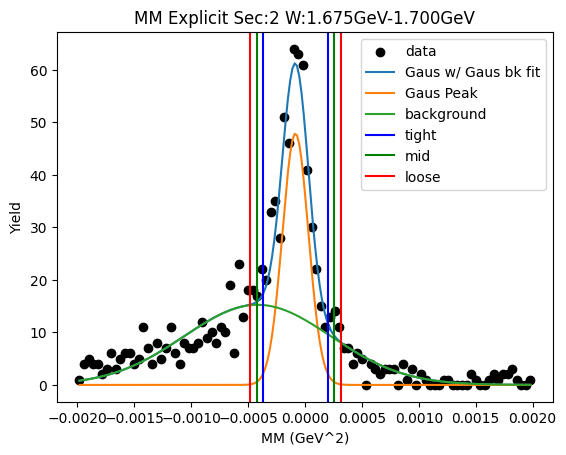

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 6.02362533e+01 -1.49871611e-04  2.46659503e-04]
2nd level W dependent
W1_ini_pars: [ 6.02362533e+01 -1.49871611e-04  2.46659503e-04  1.52643002e+01
 -4.16661726e-04  6.45049537e-04]
Gaus1 Peak: [ 5.84015950e+01 -9.60093679e-05  1.18236295e-04]
Gaus2 Peak: [ 2.15518985e+01 -4.79528218e-04  5.97111162e-04]
tight should be -0.0003916001065387221   0.00019958137072476138
[[-0.0003916   0.          0.        ]
 [ 0.00019958  0.          0.        ]]
mid should be -0.0004507182542650705   0.00025869951845110977
[[-0.0003916  -0.00045072  0.        ]
 [ 0.00019958  0.0002587   0.        ]]
loose should be -0.0005098364019914188   0.0003178176661774581
[[-0.0003916  -0.00045072 -0.00050984]
 [ 0.00019958  0.0002587   0.00031782]]
-3.272166596123425e-08 5.1157263413030074e-08
Main Gaus Peak [ 5.84015950e+01 -9.60093679e-05  1.18236295e-04]
Gaus2 [ 2.15518985e+01 -4.79528218e-04  5.97111162e-04]


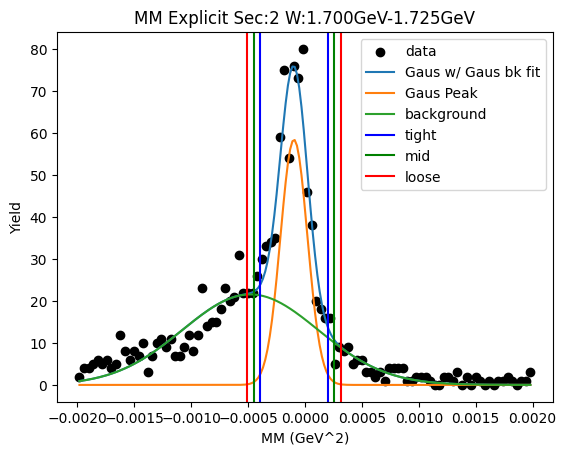

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 6.80799892e+01 -1.54852179e-04  2.38323044e-04]
2nd level W dependent
W1_ini_pars: [ 6.80799892e+01 -1.54852179e-04  2.38323044e-04  2.15518985e+01
 -4.79528218e-04  5.97111162e-04]
Gaus1 Peak: [ 6.27866965e+01 -1.12775590e-04  1.41883616e-04]
Gaus2 Peak: [ 1.88885282e+01 -5.02929479e-04  6.86510656e-04]
tight should be -0.00046748463047626955   0.0002419334514586439
[[-0.00046748  0.          0.        ]
 [ 0.00024193  0.          0.        ]]
mid should be -0.0005384264386697609   0.0003128752596521353
[[-0.00046748 -0.00053843  0.        ]
 [ 0.00024193  0.00031288  0.        ]]
loose should be -0.0006093682468632523   0.00038381706784562663
[[-0.00046748 -0.00053843 -0.00060937]
 [ 0.00024193  0.00031288  0.00038382]]
-4.767454820808515e-08 7.311121538620566e-08
Main Gaus Peak [ 6.27866965e+01 -1.12775590e-04  1.41883616e-04]
Gaus2 [ 1.88885282e+01 -5.02929479e-04  6.86510656e-04]


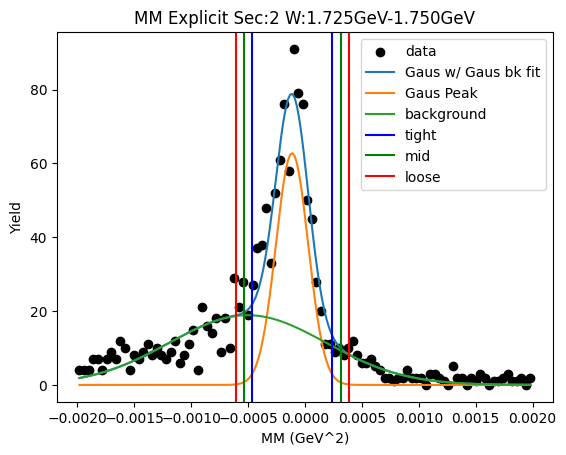

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 6.22736398e+01 -1.41307905e-04  2.48274796e-04]
2nd level W dependent
W1_ini_pars: [ 6.22736398e+01 -1.41307905e-04  2.48274796e-04  1.88885282e+01
 -5.02929479e-04  6.86510656e-04]
Gaus1 Peak: [ 5.93470559e+01 -8.94880141e-05  1.16420054e-04]
Gaus2 Peak: [ 2.16506206e+01 -4.09239970e-04  6.35021038e-04]
tight should be -0.000380538148375986   0.00020156212017836508
[[-0.00038054  0.          0.        ]
 [ 0.00020156  0.          0.        ]]
mid should be -0.00043874817523142104   0.0002597721470338002
[[-0.00038054 -0.00043875  0.        ]
 [ 0.00020156  0.00025977  0.        ]]
loose should be -0.0004969582020868562   0.00031798217388923533
[[-0.00038054 -0.00043875 -0.00049696]
 [ 0.00020156  0.00025977  0.00031798]]
-3.265278205077682e-08 4.8668991385474614e-08
Main Gaus Peak [ 5.93470559e+01 -8.94880141e-05  1.16420054e-04]
Gaus2 [ 2.16506206e+01 -4.09239970e-04  6.35021038e-04]


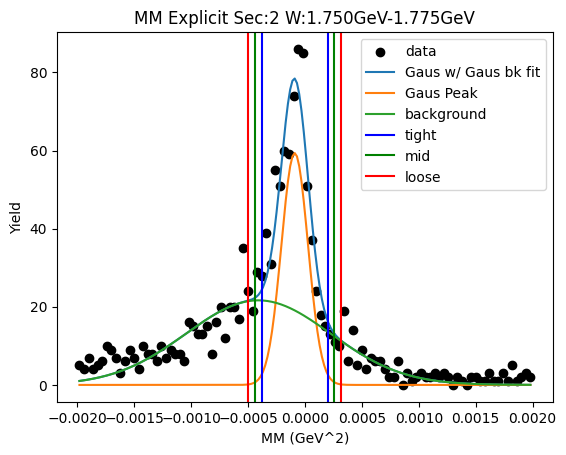

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 6.66530612e+01 -1.53170593e-04  2.27315928e-04]
2nd level W dependent
W1_ini_pars: [ 6.66530612e+01 -1.53170593e-04  2.27315928e-04  2.16506206e+01
 -4.09239970e-04  6.35021038e-04]
Gaus1 Peak: [ 6.06416166e+01 -1.21184371e-04  1.42820346e-04]
Gaus2 Peak: [ 1.75122631e+01 -5.05552437e-04  7.02953426e-04]
tight should be -0.0004782352355908278   0.00023586649314396929
[[-0.00047824  0.          0.        ]
 [ 0.00023587  0.          0.        ]]
mid should be -0.0005496454084643076   0.000307276666017449
[[-0.00047824 -0.00054965  0.        ]
 [ 0.00023587  0.00030728  0.        ]]
loose should be -0.0006210555813377873   0.00037868683889092877
[[-0.00047824 -0.00054965 -0.00062106]
 [ 0.00023587  0.00030728  0.00037869]]
-4.650730164902519e-08 7.587860530666101e-08
Main Gaus Peak [ 6.06416166e+01 -1.21184371e-04  1.42820346e-04]
Gaus2 [ 1.75122631e+01 -5.05552437e-04  7.02953426e-04]


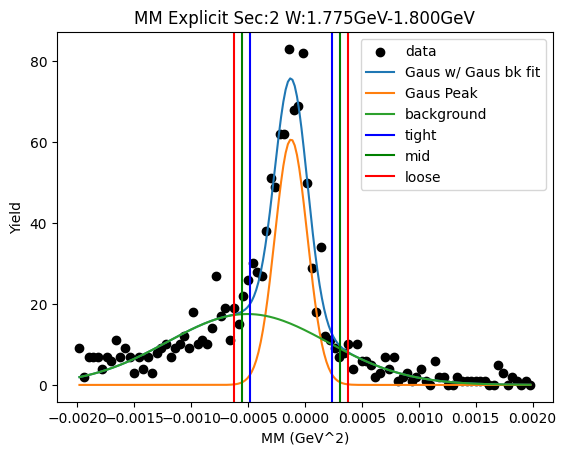

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 5.11673573e+01 -1.72119692e-04  3.00962968e-04]
2nd level W dependent
W1_ini_pars: [ 5.11673573e+01 -1.72119692e-04  3.00962968e-04  1.75122631e+01
 -5.05552437e-04  7.02953426e-04]
Gaus1 Peak: [ 4.76381348e+01 -7.23319212e-05  1.09285970e-04]
Gaus2 Peak: [ 2.42823959e+01 -4.14735286e-04  5.58871426e-04]
tight should be -0.00034554684640619347   0.0002008830041039961
[[-0.00034555  0.          0.        ]
 [ 0.00020088  0.          0.        ]]
mid should be -0.00040018983145721245   0.000255525989155015
[[-0.00034555 -0.00040019  0.        ]
 [ 0.00020088  0.00025553  0.        ]]
loose should be -0.0004548328165082313   0.000310168974206034
[[-0.00034555 -0.00040019 -0.00045483]
 [ 0.00020088  0.00025553  0.00031017]]
-3.059836296602181e-08 4.1062176600839324e-08
Main Gaus Peak [ 4.76381348e+01 -7.23319212e-05  1.09285970e-04]
Gaus2 [ 2.42823959e+01 -4.14735286e-04  5.58871426e-04]


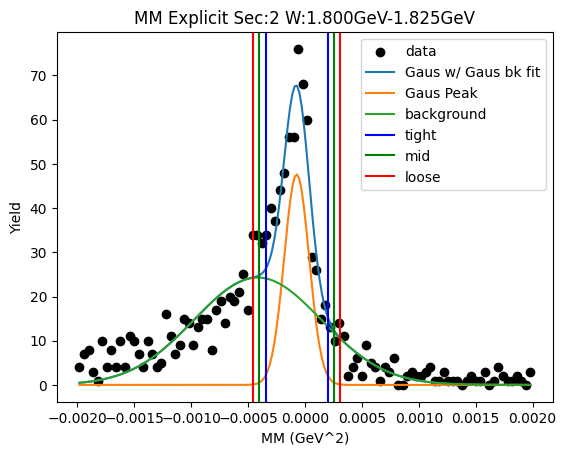

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 6.09997049e+01 -1.50505466e-04  2.48617741e-04]
2nd level W dependent
W1_ini_pars: [ 6.09997049e+01 -1.50505466e-04  2.48617741e-04  2.42823959e+01
 -4.14735286e-04  5.58871426e-04]
Gaus1 Peak: [ 5.82928088e+01 -1.04806871e-04  1.37748183e-04]
Gaus2 Peak: [ 1.75316500e+01 -5.52509436e-04  7.58394126e-04]
tight should be -0.00044917732839055253   0.00023956358642721564
[[-0.00044918  0.          0.        ]
 [ 0.00023956  0.          0.        ]]
mid should be -0.0005180514198723293   0.00030843767790899245
[[-0.00044918 -0.00051805  0.        ]
 [ 0.00023956  0.00030844  0.        ]]
loose should be -0.0005869255113541062   0.00037731176939076927
[[-0.00044918 -0.00051805 -0.00058693]
 [ 0.00023956  0.00030844  0.00037731]]
-4.5939205524313845e-08 6.790816593425004e-08
Main Gaus Peak [ 5.82928088e+01 -1.04806871e-04  1.37748183e-04]
Gaus2 [ 1.75316500e+01 -5.52509436e-04  7.58394126e-04]


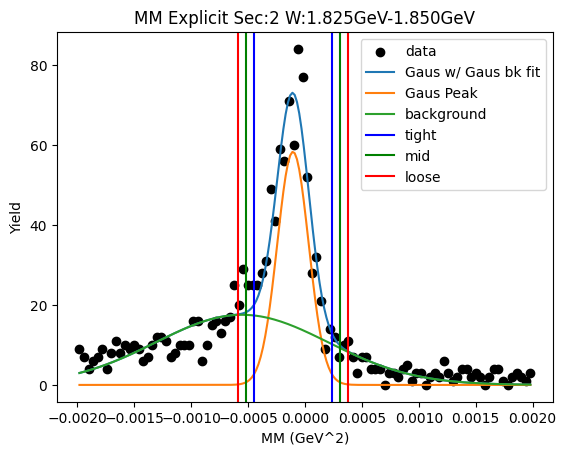

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 6.58602325e+01 -1.62223693e-04  2.53330238e-04]
2nd level W dependent
W1_ini_pars: [ 6.58602325e+01 -1.62223693e-04  2.53330238e-04  1.75316500e+01
 -5.52509436e-04  7.58394126e-04]
Gaus1 Peak: [ 5.95914408e+01 -1.17141223e-04  1.42100188e-04]
Gaus2 Peak: [ 1.98148563e+01 -4.24847002e-04  6.64100447e-04]
tight should be -0.000472391693145589   0.00023810924721854606
[[-0.00047239  0.          0.        ]
 [ 0.00023811  0.          0.        ]]
mid should be -0.0005434417871820025   0.0003091593412549596
[[-0.00047239 -0.00054344  0.        ]
 [ 0.00023811  0.00030916  0.        ]]
loose should be -0.0006144918812184159   0.00038020943529137305
[[-0.00047239 -0.00054344 -0.00061449]
 [ 0.00023811  0.00030916  0.00038021]]
-4.685532423360899e-08 7.429945646838788e-08
Main Gaus Peak [ 5.95914408e+01 -1.17141223e-04  1.42100188e-04]
Gaus2 [ 1.98148563e+01 -4.24847002e-04  6.64100447e-04]


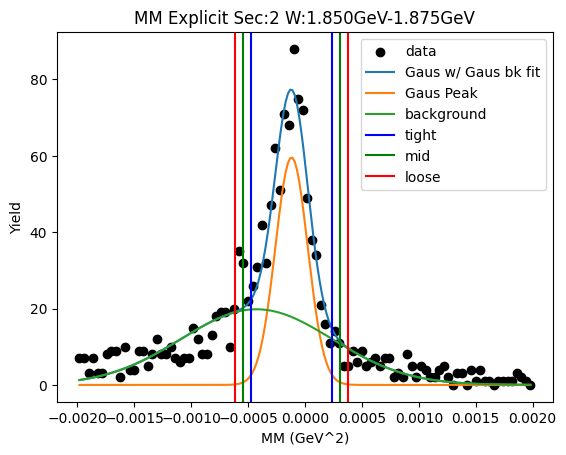

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 5.81898935e+01 -1.63834900e-04  2.77020744e-04]
2nd level W dependent
W1_ini_pars: [ 5.81898935e+01 -1.63834900e-04  2.77020744e-04  1.98148563e+01
 -4.24847002e-04  6.64100447e-04]
Gaus1 Peak: [ 5.64188268e+01 -8.95304440e-05  1.11075263e-04]
Gaus2 Peak: [ 2.43837098e+01 -4.34686781e-04  5.85200424e-04]
tight should be -0.00036721860024028054   0.0001881577122925614
[[-0.00036722  0.          0.        ]
 [ 0.00018816  0.          0.        ]]
mid should be -0.00042275623149356476   0.00024369534354584562
[[-0.00036722 -0.00042276  0.        ]
 [ 0.00018816  0.0002437   0.        ]]
loose should be -0.0004782938627468489   0.0002992329747991298
[[-0.00036722 -0.00042276 -0.00047829]
 [ 0.00018816  0.0002437   0.00029923]]
-2.8997441424552828e-08 4.502884222086564e-08
Main Gaus Peak [ 5.64188268e+01 -8.95304440e-05  1.11075263e-04]
Gaus2 [ 2.43837098e+01 -4.34686781e-04  5.85200424e-04]


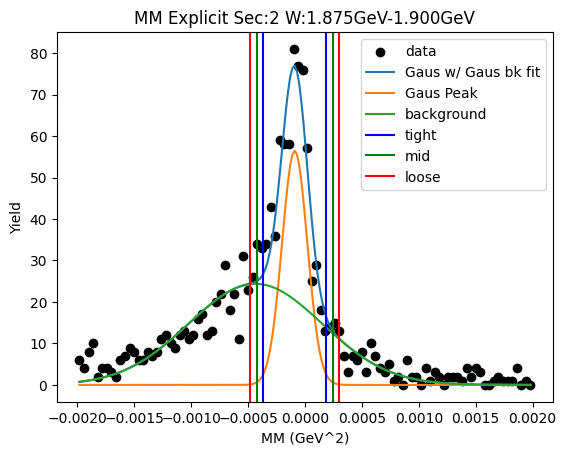

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 6.20842636e+01 -1.93038102e-04  3.04376158e-04]
2nd level W dependent
W1_ini_pars: [ 6.20842636e+01 -1.93038102e-04  3.04376158e-04  2.43837098e+01
 -4.34686781e-04  5.85200424e-04]
Gaus1 Peak: [ 5.93837926e+01 -9.50456849e-05  1.09028929e-04]
Gaus2 Peak: [ 3.04546462e+01 -4.12148292e-04  5.10108624e-04]
tight should be -0.0003676180079485469   0.0001775266381622348
[[-0.00036762  0.          0.        ]
 [ 0.00017753  0.          0.        ]]
mid should be -0.000422132472559625   0.00023204110277331294
[[-0.00036762 -0.00042213  0.        ]
 [ 0.00017753  0.00023204  0.        ]]
loose should be -0.0004766469371707032   0.00028655556738439107
[[-0.00036762 -0.00042213 -0.00047665]
 [ 0.00017753  0.00023204  0.00028656]]
-2.662824000518081e-08 4.4695604438799024e-08
Main Gaus Peak [ 5.93837926e+01 -9.50456849e-05  1.09028929e-04]
Gaus2 [ 3.04546462e+01 -4.12148292e-04  5.10108624e-04]


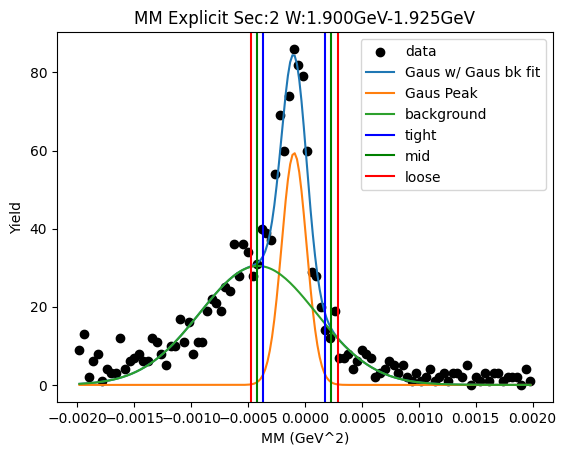

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 6.60865857e+01 -1.61333695e-04  2.47340136e-04]
2nd level W dependent
W1_ini_pars: [ 6.60865857e+01 -1.61333695e-04  2.47340136e-04  3.04546462e+01
 -4.12148292e-04  5.10108624e-04]
Gaus1 Peak: [ 6.27949283e+01 -1.07406956e-04  1.22549764e-04]
Gaus2 Peak: [ 2.21073038e+01 -4.79522962e-04  6.52363262e-04]
tight should be -0.0004137813652222604   0.00019896745354441172
[[-0.00041378  0.          0.        ]
 [ 0.00019897  0.          0.        ]]
mid should be -0.00047505624709892765   0.00026024233542107887
[[-0.00041378 -0.00047506  0.        ]
 [ 0.00019897  0.00026024  0.        ]]
loose should be -0.0005363311289755949   0.0003215172172977461
[[-0.00041378 -0.00047506 -0.00053633]
 [ 0.00019897  0.00026024  0.00032152]]
-3.351907962540959e-08 5.659158795057889e-08
Main Gaus Peak [ 6.27949283e+01 -1.07406956e-04  1.22549764e-04]
Gaus2 [ 2.21073038e+01 -4.79522962e-04  6.52363262e-04]


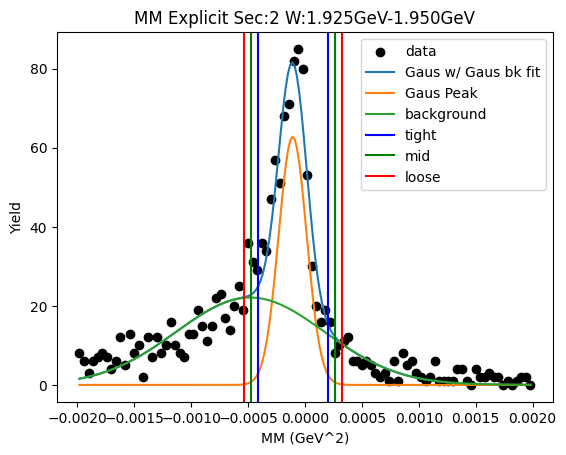

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 6.30704155e+01 -1.83739023e-04  2.69744801e-04]
2nd level W dependent
W1_ini_pars: [ 6.30704155e+01 -1.83739023e-04  2.69744801e-04  2.21073038e+01
 -4.79522962e-04  6.52363262e-04]
Gaus1 Peak: [ 5.70039115e+01 -1.34428480e-04  1.55837307e-04]
Gaus2 Peak: [ 1.87444872e+01 -5.13562779e-04  7.17451267e-04]
tight should be -0.0005240217475307639   0.0002551647884954923
[[-0.00052402  0.          0.        ]
 [ 0.00025516  0.          0.        ]]
mid should be -0.0006019404011333896   0.00033308344209811785
[[-0.00052402 -0.00060194  0.        ]
 [ 0.00025516  0.00033308  0.        ]]
loose should be -0.0006798590547360151   0.0004110020957007435
[[-0.00052402 -0.00060194 -0.00067986]
 [ 0.00025516  0.00033308  0.000411  ]]
-5.47847828455281e-08 9.092681505637497e-08
Main Gaus Peak [ 5.70039115e+01 -1.34428480e-04  1.55837307e-04]
Gaus2 [ 1.87444872e+01 -5.13562779e-04  7.17451267e-04]


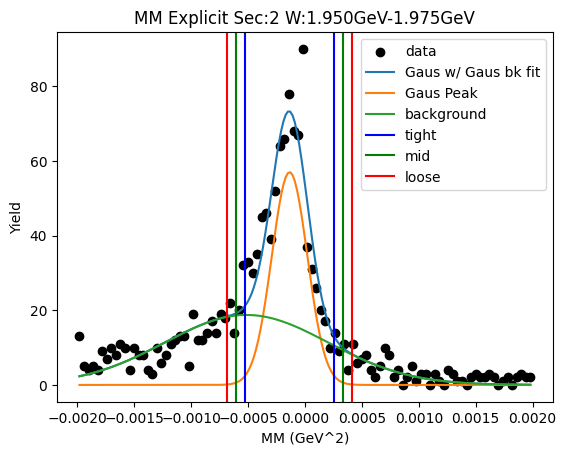

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 7.02085324e+01 -1.51403953e-04  2.45091840e-04]
2nd level W dependent
W1_ini_pars: [ 7.02085324e+01 -1.51403953e-04  2.45091840e-04  1.87444872e+01
 -5.13562779e-04  7.17451267e-04]
Gaus1 Peak: [ 6.67601526e+01 -8.70646080e-05  1.12536273e-04]
Gaus2 Peak: [ 2.59257202e+01 -4.31013499e-04  5.78131519e-04]
tight should be -0.0003684052911686642   0.00019427607514752824
[[-0.00036841  0.          0.        ]
 [ 0.00019428  0.          0.        ]]
mid should be -0.0004246734278002834   0.00025054421177914745
[[-0.00036841 -0.00042467  0.        ]
 [ 0.00019428  0.00025054  0.        ]]
loose should be -0.0004809415644319026   0.00030681234841076666
[[-0.00036841 -0.00042467 -0.00048094]
 [ 0.00019428  0.00025054  0.00030681]]
-3.0412992431900995e-08 4.5573484367968704e-08
Main Gaus Peak [ 6.67601526e+01 -8.70646080e-05  1.12536273e-04]
Gaus2 [ 2.59257202e+01 -4.31013499e-04  5.78131519e-04]


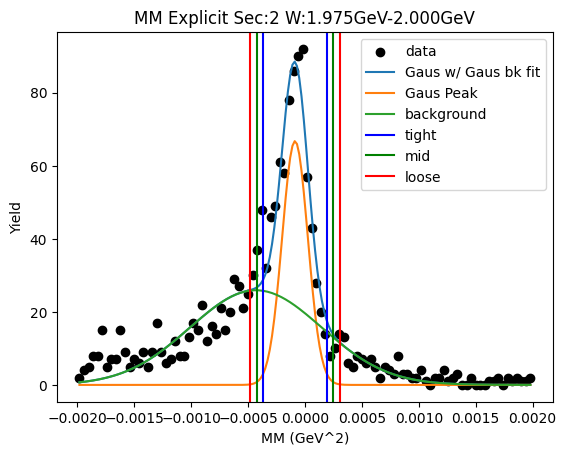

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 6.14727604e+01 -1.57801251e-04  2.55200163e-04]
2nd level W dependent
W1_ini_pars: [ 6.14727604e+01 -1.57801251e-04  2.55200163e-04  2.59257202e+01
 -4.31013499e-04  5.78131519e-04]
Gaus1 Peak: [ 5.86710217e+01 -1.18370221e-04  1.26143956e-04]
Gaus2 Peak: [ 2.00189391e+01 -4.88750096e-04  7.26195300e-04]
tight should be -0.00043373011177456726   0.00019698966959949408
[[-0.00043373  0.          0.        ]
 [ 0.00019699  0.          0.        ]]
mid should be -0.0004968020899119734   0.0002600616477369002
[[-0.00043373 -0.0004968   0.        ]
 [ 0.00019699  0.00026006  0.        ]]
loose should be -0.0005598740680493795   0.00032313362587430635
[[-0.00043373 -0.0004968  -0.00055987]
 [ 0.00019699  0.00026006  0.00032313]]
-3.372538387367295e-08 6.174840235429753e-08
Main Gaus Peak [ 5.86710217e+01 -1.18370221e-04  1.26143956e-04]
Gaus2 [ 2.00189391e+01 -4.88750096e-04  7.26195300e-04]


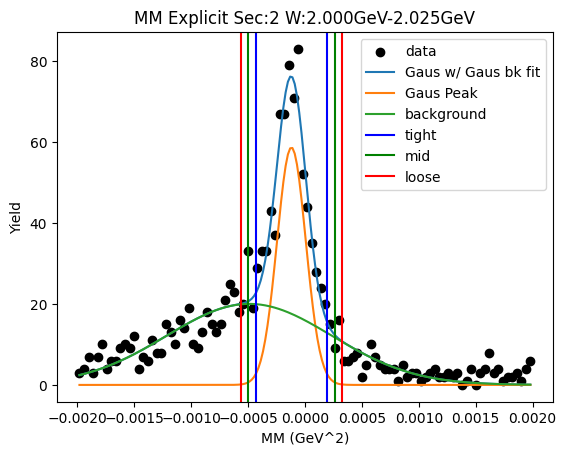

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 5.90512124e+01 -1.53954295e-04  2.61581575e-04]
2nd level W dependent
W1_ini_pars: [ 5.90512124e+01 -1.53954295e-04  2.61581575e-04  2.00189391e+01
 -4.88750096e-04  7.26195300e-04]
Gaus1 Peak: [ 5.47590445e+01 -9.98195351e-05  1.34629803e-04]
Gaus2 Peak: [ 1.95388753e+01 -4.86927361e-04  6.91082337e-04]
tight should be -0.00043639404322401605   0.00023675497303775664
[[-0.00043639  0.          0.        ]
 [ 0.00023675  0.          0.        ]]
mid should be -0.0005037089448501933   0.0003040698746639339
[[-0.00043639 -0.00050371  0.        ]
 [ 0.00023675  0.00030407  0.        ]]
loose should be -0.0005710238464763706   0.0003713847762901112
[[-0.00043639 -0.00050371 -0.00057102]
 [ 0.00023675  0.00030407  0.00037138]]
-4.441161218509452e-08 6.433949135751163e-08
Main Gaus Peak [ 5.47590445e+01 -9.98195351e-05  1.34629803e-04]
Gaus2 [ 1.95388753e+01 -4.86927361e-04  6.91082337e-04]


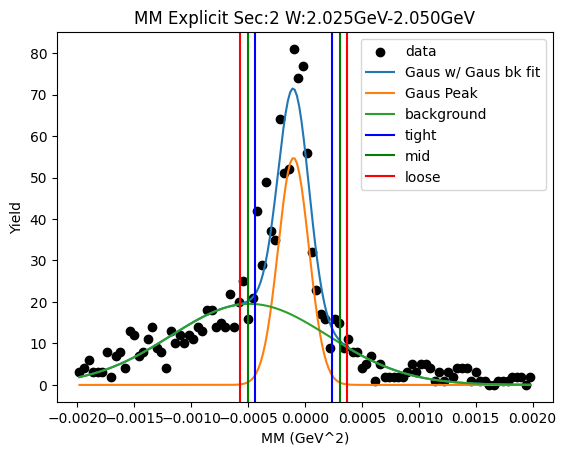

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 5.14424430e+01 -1.81266735e-04  3.10358959e-04]
2nd level W dependent
W1_ini_pars: [ 5.14424430e+01 -1.81266735e-04  3.10358959e-04  1.95388753e+01
 -4.86927361e-04  6.91082337e-04]
Gaus1 Peak: [ 5.44986774e+01 -8.80273757e-05  1.00921232e-04]
Gaus2 Peak: [ 2.35061677e+01 -4.57806618e-04  6.25389424e-04]
tight should be -0.00034033045660597527   0.0001642757051402901
[[-0.00034033  0.          0.        ]
 [ 0.00016428  0.          0.        ]]
mid should be -0.00039079107278060184   0.00021473632131491666
[[-0.00034033 -0.00039079  0.        ]
 [ 0.00016428  0.00021474  0.        ]]
loose should be -0.0004412516889552284   0.00026519693748954323
[[-0.00034033 -0.00039079 -0.00044125]
 [ 0.00016428  0.00021474  0.0002652 ]]
-2.2806466538264737e-08 3.830410429508683e-08
Main Gaus Peak [ 5.44986774e+01 -8.80273757e-05  1.00921232e-04]
Gaus2 [ 2.35061677e+01 -4.57806618e-04  6.25389424e-04]


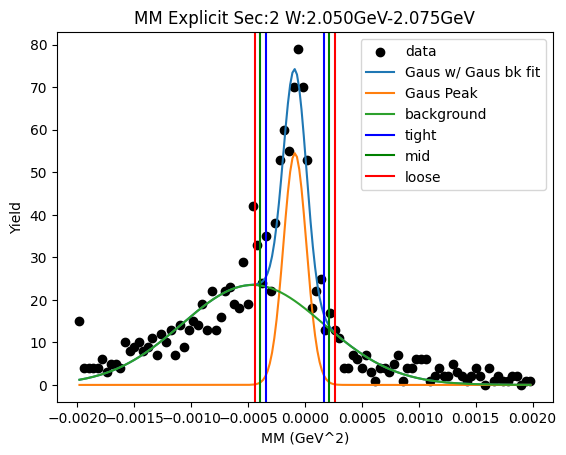

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 5.44836215e+01 -1.71175906e-04  2.71726594e-04]
2nd level W dependent
W1_ini_pars: [ 5.44836215e+01 -1.71175906e-04  2.71726594e-04  2.35061677e+01
 -4.57806618e-04  6.25389424e-04]
Gaus1 Peak: [ 5.04692869e+01 -1.06154133e-04  1.35312080e-04]
Gaus2 Peak: [ 1.90286058e+01 -4.82638342e-04  6.60750702e-04]
tight should be -0.00044443433330571035   0.00023212606669507167
[[-0.00044443  0.          0.        ]
 [ 0.00023213  0.          0.        ]]
mid should be -0.0005120903733057886   0.00029978210669514985
[[-0.00044443 -0.00051209  0.        ]
 [ 0.00023213  0.00029978  0.        ]]
loose should be -0.0005797464133058668   0.0003674381466952281
[[-0.00044443 -0.00051209 -0.00057975]
 [ 0.00023213  0.00029978  0.00036744]]
-4.3659376964102676e-08 6.61967769997097e-08
Main Gaus Peak [ 5.04692869e+01 -1.06154133e-04  1.35312080e-04]
Gaus2 [ 1.90286058e+01 -4.82638342e-04  6.60750702e-04]


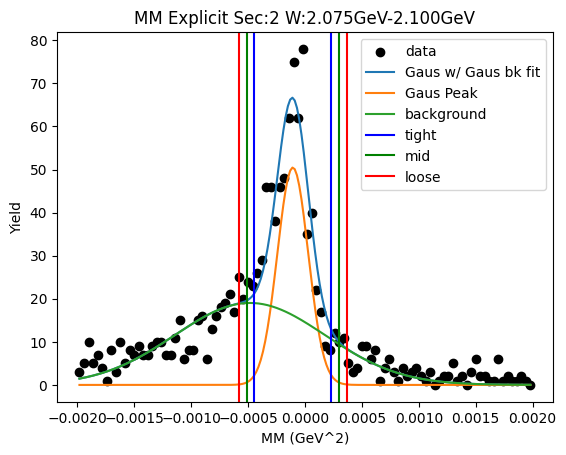

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 5.19359701e+01 -1.70791323e-04  2.59916990e-04]
2nd level W dependent
W1_ini_pars: [ 5.19359701e+01 -1.70791323e-04  2.59916990e-04  1.90286058e+01
 -4.82638342e-04  6.60750702e-04]
Gaus1 Peak: [ 4.74554934e+01 -1.37183919e-04  1.74859418e-04]
Gaus2 Peak: [ 1.17300345e+01 -6.31915134e-04  9.76176569e-04]
tight should be -0.0005743324631448329   0.0002999646243708679
[[-0.00057433  0.          0.        ]
 [ 0.00029996  0.          0.        ]]
mid should be -0.0006617621718964029   0.0003873943331224379
[[-0.00057433 -0.00066176  0.        ]
 [ 0.00029996  0.00038739  0.        ]]
loose should be -0.0007491918806479731   0.000474824041874008
[[-0.00057433 -0.00066176 -0.00074919]
 [ 0.00029996  0.00038739  0.00047482]]
-7.29080199302383e-08 1.1054687540698655e-07
Main Gaus Peak [ 4.74554934e+01 -1.37183919e-04  1.74859418e-04]
Gaus2 [ 1.17300345e+01 -6.31915134e-04  9.76176569e-04]


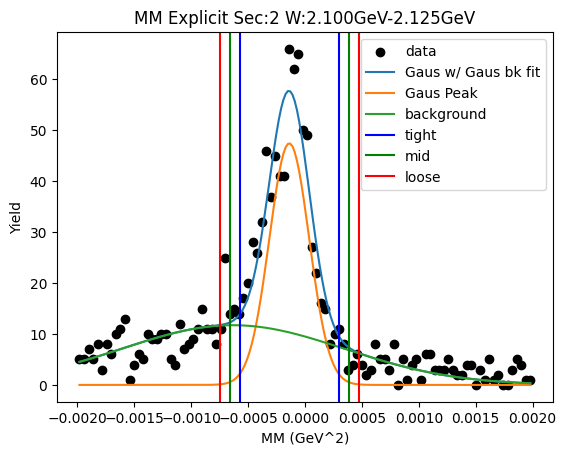

initial bw fit:  [ 2.10733739e+03 -1.66679773e-04  2.55545444e-04]
input parameters for r2 [ 2.10733739e+03 -1.66679773e-04  2.55545444e-04  5.00000000e+02
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 2.01826484e+03 -1.04294513e-04  1.21447129e-04  7.33871846e+02
 -4.89396938e-04  6.59788009e-04]
-3.3370870009868106e-08 5.5125560772262066e-08
Main Gaus Peak [ 2.01826484e+03 -1.04294513e-04  1.21447129e-04]
Gaus2 [ 7.33871846e+02 -4.89396938e-04  6.59788009e-04]


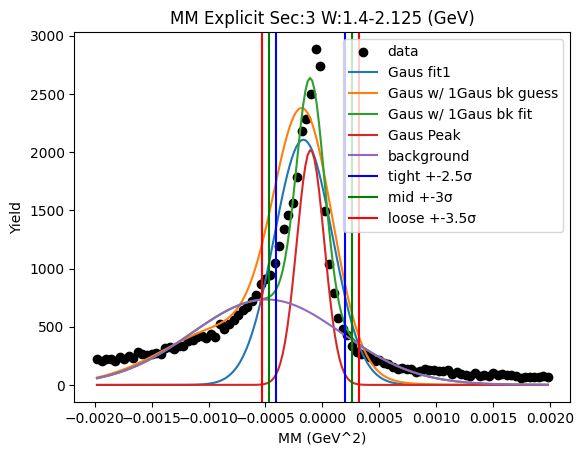

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 1.00659971e+01 -2.01392385e-04  2.60535416e-04]
2nd level W dependent
W1_ini_pars: [ 1.00659971e+01 -2.01392385e-04  2.60535416e-04  3.07211428e+00
 -1.00000000e-02  6.74285300e-02]
Gaus1 Peak: [ 9.68036916e+00 -1.38363132e-04  1.71389521e-04]
Gaus2 Peak: [ 3.27191868e+00 -8.08201518e-04  5.76255640e-04]
tight should be -0.0005668369345262926   0.0002901106707534184
[[-0.00056684  0.          0.        ]
 [ 0.00029011  0.          0.        ]]
mid should be -0.0006525316950542637   0.0003758054312813896
[[-0.00056684 -0.00065253  0.        ]
 [ 0.00029011  0.00037581  0.        ]]
loose should be -0.0007382264555822348   0.0004615001918093607
[[-0.00056684 -0.00065253 -0.00073823]
 [ 0.00029011  0.00037581  0.0004615 ]]
-6.89787475179322e-08 1.0726746004877936e-07
Main Gaus Peak [ 9.68036916e+00 -1.38363132e-04  1.71389521e-04]
Gaus2 [ 3.27191868e+00 -8.08201518e-04  5.76255640e-04]


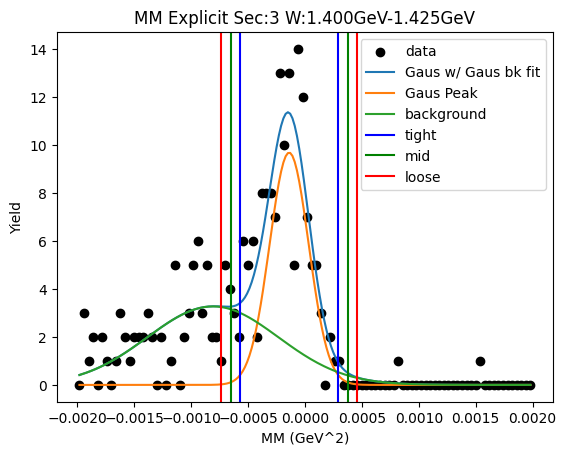

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 1.42322548e+01 -1.70423589e-04  2.13097488e-04]
2nd level W dependent
W1_ini_pars: [ 1.42322548e+01 -1.70423589e-04  2.13097488e-04  3.27191868e+00
 -8.08201518e-04  5.76255640e-04]
Gaus1 Peak: [ 1.37204945e+01 -1.18226841e-04  1.31270165e-04]
Gaus2 Peak: [ 4.05113834e+00 -6.57668246e-04  6.00425657e-04]
tight should be -0.00044640225498006873   0.00020994857215964887
[[-0.0004464   0.          0.        ]
 [ 0.00020995  0.          0.        ]]
mid should be -0.0005120373376940404   0.0002755836548736206
[[-0.0004464  -0.00051204  0.        ]
 [ 0.00020995  0.00027558  0.        ]]
loose should be -0.0005776724204080122   0.00034121873758759236
[[-0.0004464  -0.00051204 -0.00057767]
 [ 0.00020995  0.00027558  0.00034122]]
-3.7717982964604034e-08 6.567315502427389e-08
Main Gaus Peak [ 1.37204945e+01 -1.18226841e-04  1.31270165e-04]
Gaus2 [ 4.05113834e+00 -6.57668246e-04  6.00425657e-04]


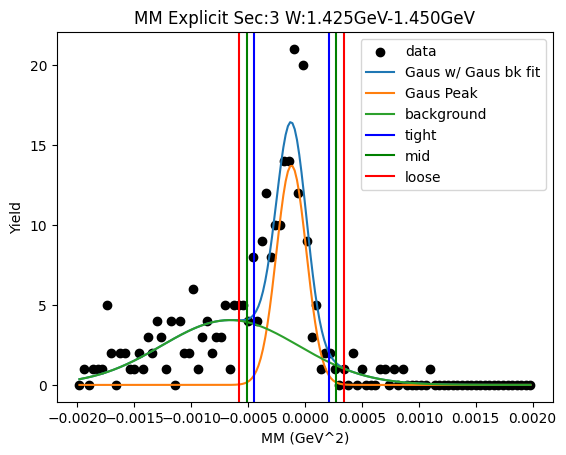

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 2.34982718e+01 -1.38111709e-04  1.66488673e-04]
2nd level W dependent
W1_ini_pars: [ 2.34982718e+01 -1.38111709e-04  1.66488673e-04  4.05113834e+00
 -6.57668246e-04  6.00425657e-04]
Gaus1 Peak: [ 2.77942895e+01 -6.33349467e-05  2.76302294e-05]
Gaus2 Peak: [ 1.49314411e+01 -2.30287619e-04  2.58116676e-04]
tight should be -0.00013241052022131426   5.7406267517768434e-06
[[-1.32410520e-04  0.00000000e+00  0.00000000e+00]
 [ 5.74062675e-06  0.00000000e+00  0.00000000e+00]]
mid should be -0.00014622563491862336   1.9555741449085964e-05
[[-1.32410520e-04 -1.46225635e-04  0.00000000e+00]
 [ 5.74062675e-06  1.95557414e-05  0.00000000e+00]]
loose should be -0.0001600407496159325   3.337085614639507e-05
[[-1.32410520e-04 -1.46225635e-04 -1.60040750e-04]
 [ 5.74062675e-06  1.95557414e-05  3.33708561e-05]]
1.721026748698315e-09 6.301604207093664e-09
Main Gaus Peak [ 2.77942895e+01 -6.33349467e-05  2.76302294e-05]
Gaus2 [ 1.49314411e+01 -2.30287619e-0

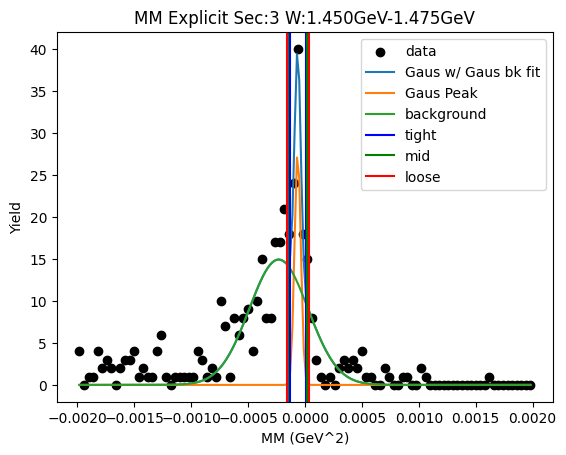

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 2.81071468e+01 -1.43659283e-04  1.99538457e-04]
2nd level W dependent
W1_ini_pars: [ 2.81071468e+01 -1.43659283e-04  1.99538457e-04  1.49314411e+01
 -2.30287619e-04  2.58116676e-04]
Gaus1 Peak: [ 2.60602729e+01 -1.18601109e-04  1.34853134e-04]
Gaus2 Peak: [ 6.49421735e+00 -5.46289022e-04  6.58353910e-04]
tight should be -0.0004557339432680188   0.00021853172499469335
[[-0.00045573  0.          0.        ]
 [ 0.00021853  0.          0.        ]]
mid should be -0.00052316051009429   0.00028595829182096453
[[-0.00045573 -0.00052316  0.        ]
 [ 0.00021853  0.00028596  0.        ]]
loose should be -0.0005905870769205611   0.0003533848586472357
[[-0.00045573 -0.00052316 -0.00059059]
 [ 0.00021853  0.00028596  0.00035338]]
-4.0489879879284824e-08 6.862232605617799e-08
Main Gaus Peak [ 2.60602729e+01 -1.18601109e-04  1.34853134e-04]
Gaus2 [ 6.49421735e+00 -5.46289022e-04  6.58353910e-04]


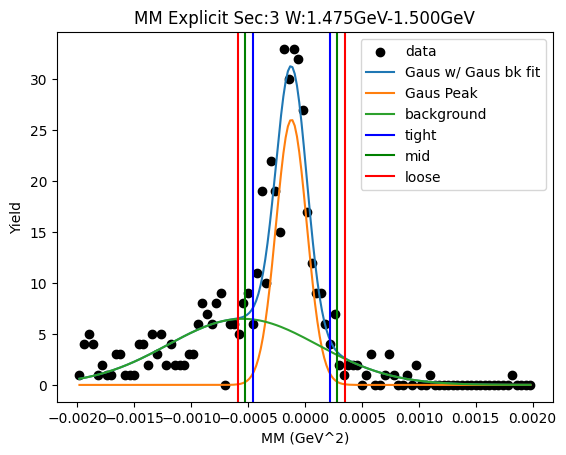

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 2.94856639e+01 -1.81220253e-04  2.56563456e-04]
2nd level W dependent
W1_ini_pars: [ 2.94856639e+01 -1.81220253e-04  2.56563456e-04  6.49421735e+00
 -5.46289022e-04  6.58353910e-04]
Gaus1 Peak: [ 2.96650609e+01 -6.98634870e-05  5.88856573e-05]
Gaus2 Peak: [ 1.83344045e+01 -3.18074617e-04  3.72160848e-04]
tight should be -0.0002170776302308194   7.735065619765421e-05
[[-2.17077630e-04  0.00000000e+00  0.00000000e+00]
 [ 7.73506562e-05  0.00000000e+00  0.00000000e+00]]
mid should be -0.0002465204588736668   0.00010679348484050157
[[-2.17077630e-04 -2.46520459e-04  0.00000000e+00]
 [ 7.73506562e-05  1.06793485e-04  0.00000000e+00]]
loose should be -0.0002759632875165141   0.00013623631348334895
[[-2.17077630e-04 -2.46520459e-04 -2.75963288e-04]
 [ 7.73506562e-05  1.06793485e-04  1.36236313e-04]]
-5.521655083788671e-09 1.528346872002108e-08
Main Gaus Peak [ 2.96650609e+01 -6.98634870e-05  5.88856573e-05]
Gaus2 [ 1.83344045e+01 -3.18074617e-04

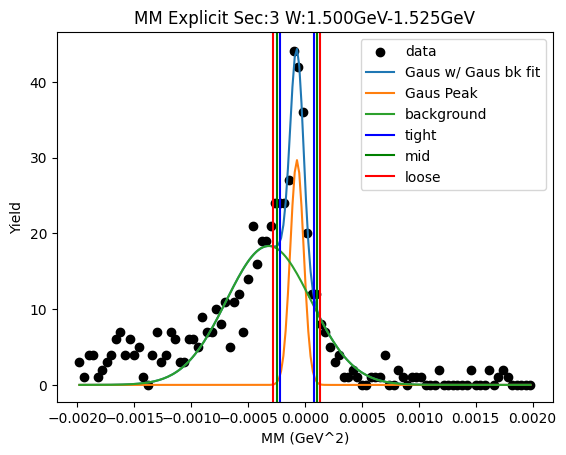

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 3.58556222e+01 -1.30602277e-04  1.95258022e-04]
2nd level W dependent
W1_ini_pars: [ 3.58556222e+01 -1.30602277e-04  1.95258022e-04  1.83344045e+01
 -3.18074617e-04  3.72160848e-04]
Gaus1 Peak: [ 3.52816697e+01 -8.25033121e-05  9.42617285e-05]
Gaus2 Peak: [ 1.20765250e+01 -4.42096236e-04  5.30942273e-04]
tight should be -0.0003181576333717425   0.00015315100913593915
[[-0.00031816  0.          0.        ]
 [ 0.00015315  0.          0.        ]]
mid should be -0.00036528849762251065   0.00020028187338670732
[[-0.00031816 -0.00036529  0.        ]
 [ 0.00015315  0.00020028  0.        ]]
loose should be -0.0004124193618732788   0.0002474127376374755
[[-0.00031816 -0.00036529 -0.00041242]
 [ 0.00015315  0.00020028  0.00024741]]
-1.984902386986814e-08 3.3462616890715935e-08
Main Gaus Peak [ 3.52816697e+01 -8.25033121e-05  9.42617285e-05]
Gaus2 [ 1.20765250e+01 -4.42096236e-04  5.30942273e-04]


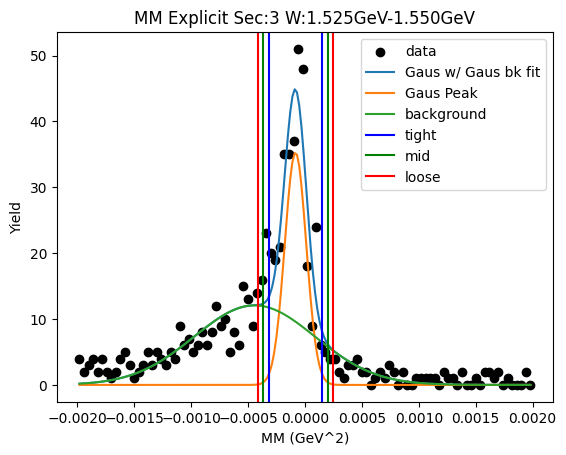

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 3.22193963e+01 -1.80528883e-04  2.58432682e-04]
2nd level W dependent
W1_ini_pars: [ 3.22193963e+01 -1.80528883e-04  2.58432682e-04  1.20765250e+01
 -4.42096236e-04  5.30942273e-04]
Gaus1 Peak: [ 3.12404180e+01 -1.16697692e-04  1.10244340e-04]
Gaus2 Peak: [ 1.25136810e+01 -4.62723456e-04  5.86727324e-04]
tight should be -0.0003923085424910681   0.00015891315880175257
[[-0.00039231  0.          0.        ]
 [ 0.00015891  0.          0.        ]]
mid should be -0.00044743071262035017   0.00021403532893103465
[[-0.00039231 -0.00044743  0.        ]
 [ 0.00015891  0.00021404  0.        ]]
loose should be -0.0005025528827496321   0.0002691574990603167
[[-0.00039231 -0.00044743 -0.00050255]
 [ 0.00015891  0.00021404  0.00026916]]
-2.2843092395267492e-08 5.007979495900889e-08
Main Gaus Peak [ 3.12404180e+01 -1.16697692e-04  1.10244340e-04]
Gaus2 [ 1.25136810e+01 -4.62723456e-04  5.86727324e-04]


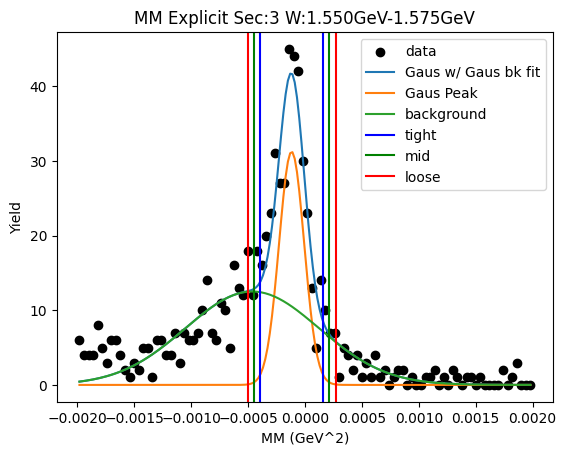

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 3.65699290e+01 -1.54776873e-04  2.41124579e-04]
2nd level W dependent
W1_ini_pars: [ 3.65699290e+01 -1.54776873e-04  2.41124579e-04  1.25136810e+01
 -4.62723456e-04  5.86727324e-04]
Gaus1 Peak: [ 3.36646413e+01 -1.08770525e-04  1.32482420e-04]
Gaus2 Peak: [ 1.17616161e+01 -4.88857302e-04  6.27060575e-04]
tight should be -0.0004399765766586957   0.00022243552572454218
[[-0.00043998  0.          0.        ]
 [ 0.00022244  0.          0.        ]]
mid should be -0.0005062177868970194   0.0002886767359628659
[[-0.00043998 -0.00050622  0.        ]
 [ 0.00022244  0.00028868  0.        ]]
loose should be -0.0005724589971353432   0.0003549179462011897
[[-0.00043998 -0.00050622 -0.00057246]
 [ 0.00022244  0.00028868  0.00035492]]
-4.082374799566974e-08 6.448580241643774e-08
Main Gaus Peak [ 3.36646413e+01 -1.08770525e-04  1.32482420e-04]
Gaus2 [ 1.17616161e+01 -4.88857302e-04  6.27060575e-04]


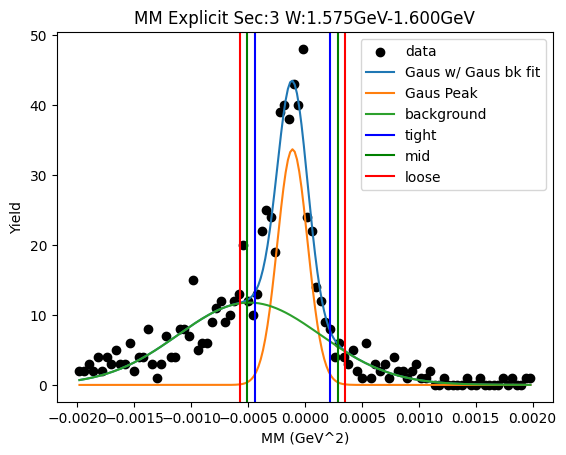

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 4.43846233e+01 -1.26763398e-04  1.83722921e-04]
2nd level W dependent
W1_ini_pars: [ 4.43846233e+01 -1.26763398e-04  1.83722921e-04  1.17616161e+01
 -4.88857302e-04  6.27060575e-04]
Gaus1 Peak: [ 4.17433173e+01 -9.89484205e-05  1.12218685e-04]
Gaus2 Peak: [ 1.20696851e+01 -5.28220684e-04  6.23593572e-04]
tight should be -0.00037949513312177693   0.00018159829214868062
[[-0.0003795  0.         0.       ]
 [ 0.0001816  0.         0.       ]]
mid should be -0.0004356044756488227   0.0002377076346757264
[[-0.0003795  -0.0004356   0.        ]
 [ 0.0001816   0.00023771  0.        ]]
loose should be -0.0004917138181758684   0.0002938169772027721
[[-0.0003795  -0.0004356  -0.00049171]
 [ 0.0001816   0.00023771  0.00029382]]
-2.7988309909025404e-08 4.756988974259089e-08
Main Gaus Peak [ 4.17433173e+01 -9.89484205e-05  1.12218685e-04]
Gaus2 [ 1.20696851e+01 -5.28220684e-04  6.23593572e-04]


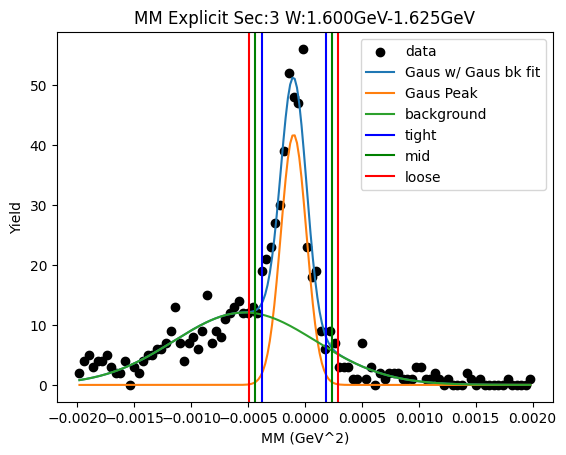

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 3.93824059e+01 -1.95788032e-04  2.78537640e-04]
2nd level W dependent
W1_ini_pars: [ 3.93824059e+01 -1.95788032e-04  2.78537640e-04  1.20696851e+01
 -5.28220684e-04  6.23593572e-04]
Gaus1 Peak: [ 3.60100125e+01 -1.14258790e-04  1.11855066e-04]
Gaus2 Peak: [ 1.75126579e+01 -4.22932341e-04  5.30219608e-04]
tight should be -0.0003938964534967302   0.00016537887416519212
[[-0.0003939   0.          0.        ]
 [ 0.00016538  0.          0.        ]]
mid should be -0.0004498239862629225   0.00022130640693138434
[[-0.0003939  -0.00044982  0.        ]
 [ 0.00016538  0.00022131  0.        ]]
loose should be -0.0005057515190291147   0.0002772339396975766
[[-0.0003939  -0.00044982 -0.00050575]
 [ 0.00016538  0.00022131  0.00027723]]
-2.447959603987562e-08 5.0589738071648526e-08
Main Gaus Peak [ 3.60100125e+01 -1.14258790e-04  1.11855066e-04]
Gaus2 [ 1.75126579e+01 -4.22932341e-04  5.30219608e-04]


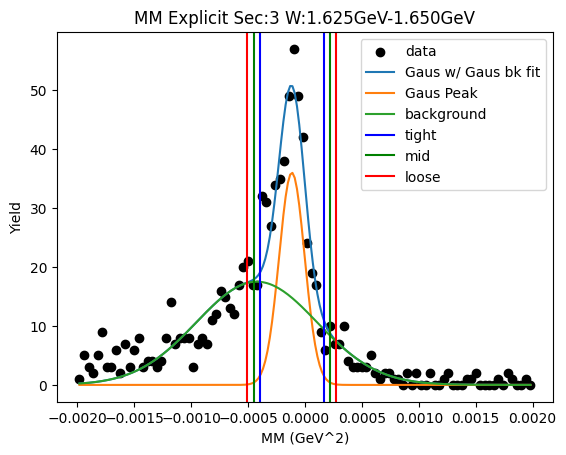

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 5.68888176e+01 -1.42641312e-04  1.96556094e-04]
2nd level W dependent
W1_ini_pars: [ 5.68888176e+01 -1.42641312e-04  1.96556094e-04  1.75126579e+01
 -4.22932341e-04  5.30219608e-04]
Gaus1 Peak: [ 5.46686277e+01 -9.80509028e-05  1.10352418e-04]
Gaus2 Peak: [ 1.66382793e+01 -5.09641225e-04  5.90432369e-04]
tight should be -0.0003739319488337442   0.00017783014321195423
[[-0.00037393  0.          0.        ]
 [ 0.00017783  0.          0.        ]]
mid should be -0.0004291081580383141   0.00023300635241652412
[[-0.00037393 -0.00042911  0.        ]
 [ 0.00017783  0.00023301  0.        ]]
loose should be -0.00048428436724288397   0.0002881825616210939
[[-0.00037393 -0.00042911 -0.00048428]
 [ 0.00017783  0.00023301  0.00028818]]
-2.691898920420593e-08 4.614694828826908e-08
Main Gaus Peak [ 5.46686277e+01 -9.80509028e-05  1.10352418e-04]
Gaus2 [ 1.66382793e+01 -5.09641225e-04  5.90432369e-04]


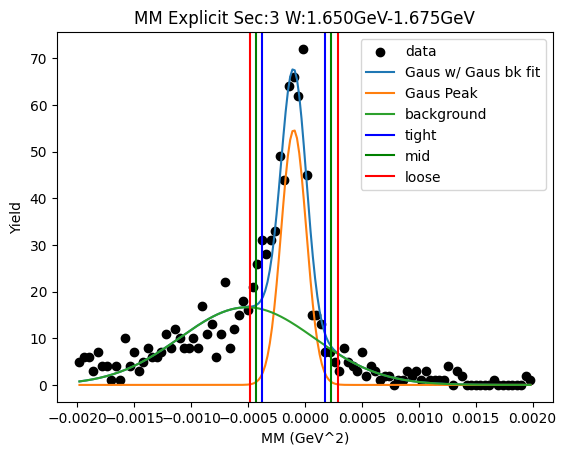

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 5.67753258e+01 -1.61397613e-04  2.52428126e-04]
2nd level W dependent
W1_ini_pars: [ 5.67753258e+01 -1.61397613e-04  2.52428126e-04  1.66382793e+01
 -5.09641225e-04  5.90432369e-04]
Gaus1 Peak: [ 6.00498441e+01 -7.71274368e-05  8.25001635e-05]
Gaus2 Peak: [ 2.62201285e+01 -3.85379218e-04  4.82847695e-04]
tight should be -0.00028337784562782755   0.0001291229721114534
[[-0.00028338  0.          0.        ]
 [ 0.00012912  0.          0.        ]]
mid should be -0.0003246279274017556   0.00017037305388538146
[[-0.00028338 -0.00032463  0.        ]
 [ 0.00012912  0.00017037  0.        ]]
loose should be -0.0003658780091756837   0.00021162313565930958
[[-0.00028338 -0.00032463 -0.00036588]
 [ 0.00012912  0.00017037  0.00021162]]
-1.4470189455380904e-08 2.6367472457157196e-08
Main Gaus Peak [ 6.00498441e+01 -7.71274368e-05  8.25001635e-05]
Gaus2 [ 2.62201285e+01 -3.85379218e-04  4.82847695e-04]


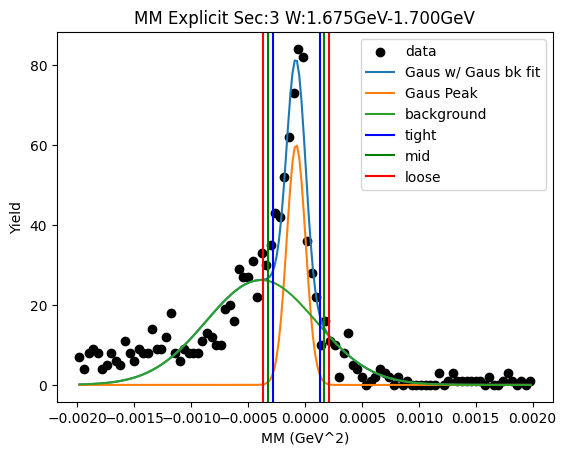

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 7.40514519e+01 -1.68916639e-04  2.18988902e-04]
2nd level W dependent
W1_ini_pars: [ 7.40514519e+01 -1.68916639e-04  2.18988902e-04  2.62201285e+01
 -3.85379218e-04  4.82847695e-04]
Gaus1 Peak: [ 6.83489660e+01 -1.32669555e-04  1.39657218e-04]
Gaus2 Peak: [ 1.98888382e+01 -6.07176424e-04  6.76390585e-04]
tight should be -0.0004818126011898058   0.00021647349023437234
[[-0.00048181  0.          0.        ]
 [ 0.00021647  0.          0.        ]]
mid should be -0.0005516412103322236   0.0002863020993767902
[[-0.00048181 -0.00055164  0.        ]
 [ 0.00021647  0.0002863   0.        ]]
loose should be -0.0006214698194746415   0.000356130708519208
[[-0.00048181 -0.00055164 -0.00062147]
 [ 0.00021647  0.0002863   0.00035613]]
-4.0911204906519734e-08 7.611362680782965e-08
Main Gaus Peak [ 6.83489660e+01 -1.32669555e-04  1.39657218e-04]
Gaus2 [ 1.98888382e+01 -6.07176424e-04  6.76390585e-04]


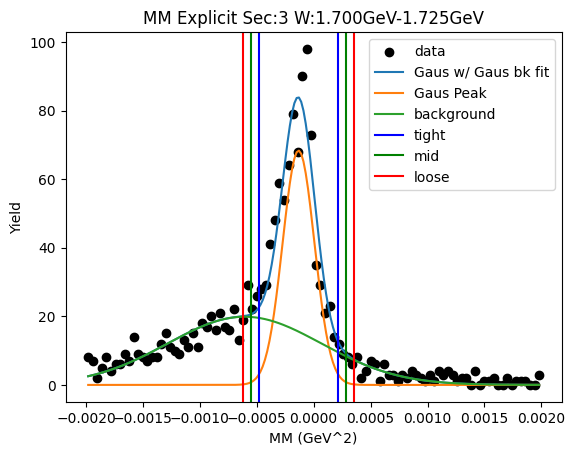

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 7.05845568e+01 -1.75550145e-04  2.44803172e-04]
2nd level W dependent
W1_ini_pars: [ 7.05845568e+01 -1.75550145e-04  2.44803172e-04  1.98888382e+01
 -6.07176424e-04  6.76390585e-04]
Gaus1 Peak: [ 6.59913546e+01 -1.15076469e-04  1.36151490e-04]
Gaus2 Peak: [ 2.26091402e+01 -5.54661039e-04  6.20337733e-04]
tight should be -0.0004554551946037135   0.0002253022565286426
[[-0.00045546  0.          0.        ]
 [ 0.0002253   0.          0.        ]]
mid should be -0.0005235309397169491   0.0002933780016418782
[[-0.00045546 -0.00052353  0.        ]
 [ 0.0002253   0.00029338  0.        ]]
loose should be -0.0005916066848301847   0.0003614537467551138
[[-0.00045546 -0.00052353 -0.00059161]
 [ 0.0002253   0.00029338  0.00036145]]
-4.236909114651981e-08 6.885427859881352e-08
Main Gaus Peak [ 6.59913546e+01 -1.15076469e-04  1.36151490e-04]
Gaus2 [ 2.26091402e+01 -5.54661039e-04  6.20337733e-04]


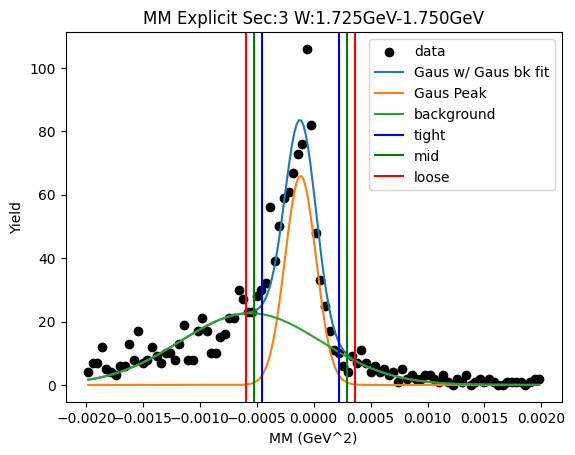

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 6.17065817e+01 -1.73775960e-04  2.85524710e-04]
2nd level W dependent
W1_ini_pars: [ 6.17065817e+01 -1.73775960e-04  2.85524710e-04  2.26091402e+01
 -5.54661039e-04  6.20337733e-04]
Gaus1 Peak: [ 8.40062003e+01 -4.50179877e-05  4.23905640e-05]
Gaus2 Peak: [ 3.95522329e+01 -3.19429628e-04  4.25265235e-04]
tight should be -0.00015099439758200247   6.095842217548454e-05
[[-1.50994398e-04  0.00000000e+00  0.00000000e+00]
 [ 6.09584222e-05  0.00000000e+00  0.00000000e+00]]
mid should be -0.0001721896795577512   8.215370415123324e-05
[[-1.50994398e-04 -1.72189680e-04  0.00000000e+00]
 [ 6.09584222e-05  8.21537042e-05  0.00000000e+00]]
loose should be -0.0001933849615334999   0.00010334898612698195
[[-1.50994398e-04 -1.72189680e-04 -1.93384962e-04]
 [ 6.09584222e-05  8.21537042e-05  1.03348986e-04]]
-3.364260519527198e-09 7.4174989532287495e-09
Main Gaus Peak [ 8.40062003e+01 -4.50179877e-05  4.23905640e-05]
Gaus2 [ 3.95522329e+01 -3.19429628e-

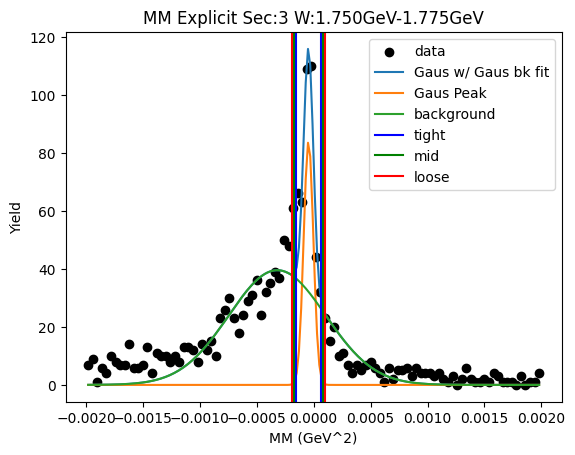

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 5.45401336e+01 -2.00507352e-04  3.03753111e-04]
2nd level W dependent
W1_ini_pars: [ 5.45401336e+01 -2.00507352e-04  3.03753111e-04  3.95522329e+01
 -3.19429628e-04  4.25265235e-04]
Gaus1 Peak: [ 5.31133766e+01 -4.79572807e-05  5.14467164e-05]
Gaus2 Peak: [ 3.99814655e+01 -3.00422633e-04  3.76325501e-04]
tight should be -0.00017657407161718864   8.06595102730643e-05
[[-1.76574072e-04  0.00000000e+00  0.00000000e+00]
 [ 8.06595103e-05  0.00000000e+00  0.00000000e+00]]
mid should be -0.0002022974298062139   0.00010638286846208957
[[-1.76574072e-04 -2.02297430e-04  0.00000000e+00]
 [ 8.06595103e-05  1.06382868e-04  0.00000000e+00]]
loose should be -0.0002280207879952392   0.00013210622665111487
[[-1.76574072e-04 -2.02297430e-04 -2.28020788e-04]
 [ 8.06595103e-05  1.06382868e-04  1.32106227e-04]]
-5.640393108791786e-09 1.0240194647709684e-08
Main Gaus Peak [ 5.31133766e+01 -4.79572807e-05  5.14467164e-05]
Gaus2 [ 3.99814655e+01 -3.00422633e-

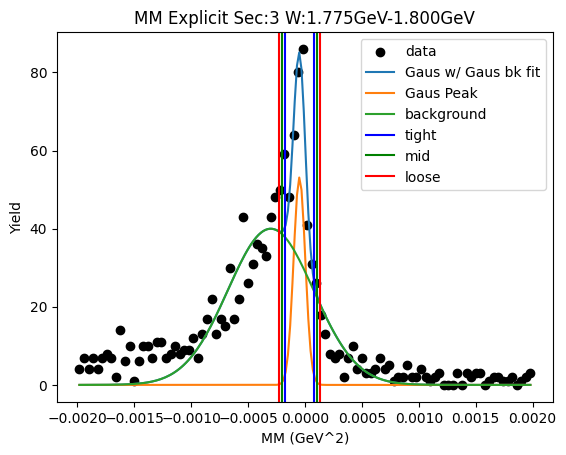

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 6.23990136e+01 -1.65855016e-04  2.41231845e-04]
2nd level W dependent
W1_ini_pars: [ 6.23990136e+01 -1.65855016e-04  2.41231845e-04  3.99814655e+01
 -3.00422633e-04  3.76325501e-04]
Gaus1 Peak: [ 5.83550839e+01 -1.08585464e-04  1.35989852e-04]
Gaus2 Peak: [ 1.97776104e+01 -5.75789082e-04  6.44351560e-04]
tight should be -0.0004485600940307712   0.00023138916605722594
[[-0.00044856  0.          0.        ]
 [ 0.00023139  0.          0.        ]]
mid should be -0.0005165550200395708   0.0002993840920660256
[[-0.00044856 -0.00051656  0.        ]
 [ 0.00023139  0.00029938  0.        ]]
loose should be -0.0005845499460483706   0.0003673790180748253
[[-0.00044856 -0.00051656 -0.00058455]
 [ 0.00023139  0.00029938  0.00036738]]
-4.3688916566083065e-08 6.727052254452846e-08
Main Gaus Peak [ 5.83550839e+01 -1.08585464e-04  1.35989852e-04]
Gaus2 [ 1.97776104e+01 -5.75789082e-04  6.44351560e-04]


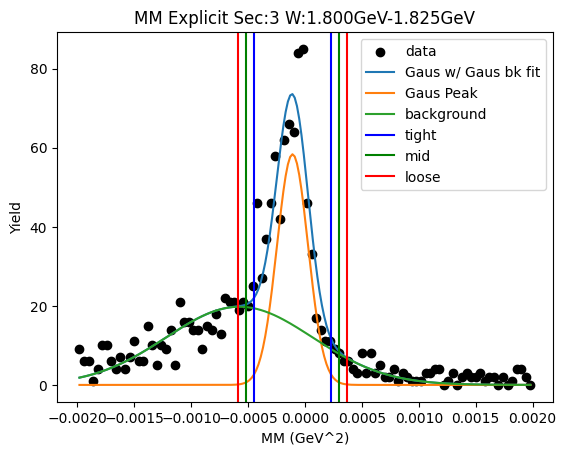

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 5.71793512e+01 -1.75221462e-04  2.53413544e-04]
2nd level W dependent
W1_ini_pars: [ 5.71793512e+01 -1.75221462e-04  2.53413544e-04  1.97776104e+01
 -5.75789082e-04  6.44351560e-04]
Gaus1 Peak: [ 5.22683592e+01 -1.22260847e-04  1.44148112e-04]
Gaus2 Peak: [ 1.77508202e+01 -5.44782748e-04  6.84286990e-04]
tight should be -0.00048263112591894435   0.00023810943193848397
[[-0.00048263  0.          0.        ]
 [ 0.00023811  0.          0.        ]]
mid should be -0.0005547051817046873   0.00031018348772422684
[[-0.00048263 -0.00055471  0.        ]
 [ 0.00023811  0.00031018  0.        ]]
loose should be -0.0006267792374904299   0.0003822575435099696
[[-0.00048263 -0.00055471 -0.00062678]
 [ 0.00023811  0.00031018  0.00038226]]
-4.738831950210797e-08 7.728374891564492e-08
Main Gaus Peak [ 5.22683592e+01 -1.22260847e-04  1.44148112e-04]
Gaus2 [ 1.77508202e+01 -5.44782748e-04  6.84286990e-04]


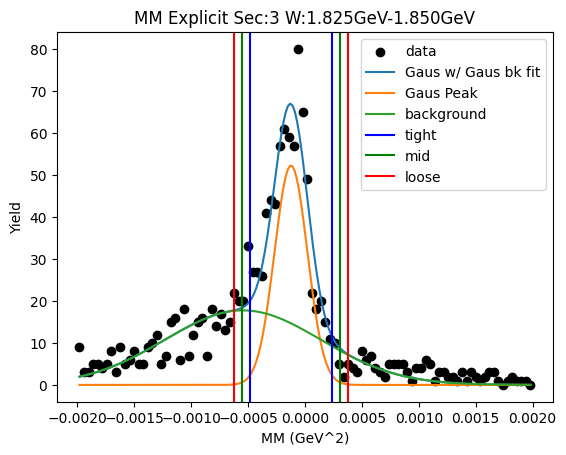

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 7.45531607e+01 -1.31954312e-04  1.94385264e-04]
2nd level W dependent
W1_ini_pars: [ 7.45531607e+01 -1.31954312e-04  1.94385264e-04  1.77508202e+01
 -5.44782748e-04  6.84286990e-04]
Gaus1 Peak: [ 7.07344360e+01 -9.82676014e-05  1.10240839e-04]
Gaus2 Peak: [ 2.13399413e+01 -4.70542149e-04  6.11903898e-04]
tight should be -0.0003738696983579093   0.0001773344955942892
[[-0.00037387  0.          0.        ]
 [ 0.00017733  0.          0.        ]]
mid should be -0.0004289901177531291   0.000232454914989509
[[-0.00037387 -0.00042899  0.        ]
 [ 0.00017733  0.00023245  0.        ]]
loose should be -0.00048411053714834896   0.0002875753343847289
[[-0.00037387 -0.00042899 -0.00048411]
 [ 0.00017733  0.00023245  0.00028758]]
-2.680260613032482e-08 4.611564909299345e-08
Main Gaus Peak [ 7.07344360e+01 -9.82676014e-05  1.10240839e-04]
Gaus2 [ 2.13399413e+01 -4.70542149e-04  6.11903898e-04]


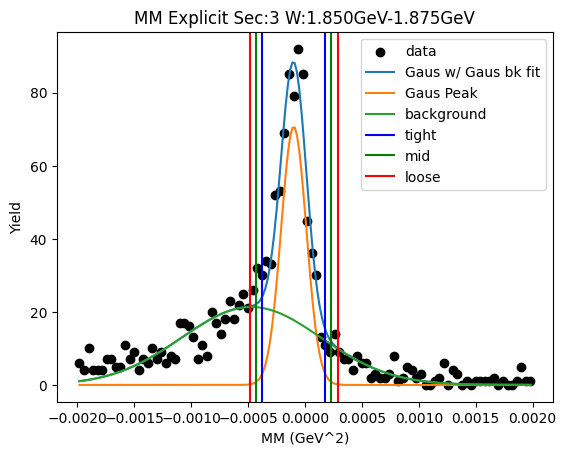

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 6.16164710e+01 -1.88431094e-04  2.57959132e-04]
2nd level W dependent
W1_ini_pars: [ 6.16164710e+01 -1.88431094e-04  2.57959132e-04  2.13399413e+01
 -4.70542149e-04  6.11903898e-04]
Gaus1 Peak: [ 5.61632641e+01 -1.21330105e-04  1.31881437e-04]
Gaus2 Peak: [ 2.28400946e+01 -5.03576180e-04  5.64764071e-04]
tight should be -0.0004510336963395557   0.0002083734868391672
[[-0.00045103  0.          0.        ]
 [ 0.00020837  0.          0.        ]]
mid should be -0.000516974414657428   0.00027431420515703947
[[-0.00045103 -0.00051697  0.        ]
 [ 0.00020837  0.00027431  0.        ]]
loose should be -0.0005829151329753002   0.00034025492347491173
[[-0.00045103 -0.00051697 -0.00058292]
 [ 0.00020837  0.00027431  0.00034025]]
-3.745714566863063e-08 6.689913430601684e-08
Main Gaus Peak [ 5.61632641e+01 -1.21330105e-04  1.31881437e-04]
Gaus2 [ 2.28400946e+01 -5.03576180e-04  5.64764071e-04]


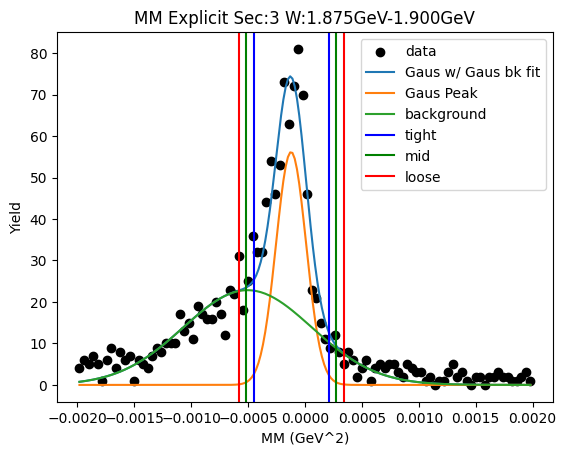

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 5.72111236e+01 -1.69083476e-04  2.56604322e-04]
2nd level W dependent
W1_ini_pars: [ 5.72111236e+01 -1.69083476e-04  2.56604322e-04  2.28400946e+01
 -5.03576180e-04  5.64764071e-04]
Gaus1 Peak: [ 5.64076003e+01 -1.03829872e-04  1.11026900e-04]
Gaus2 Peak: [ 2.16474995e+01 -4.68458646e-04  6.03155632e-04]
tight should be -0.0003813971229239795   0.00017373737951953858
[[-0.0003814   0.          0.        ]
 [ 0.00017374  0.          0.        ]]
mid should be -0.00043691057316833125   0.00022925082976389034
[[-0.0003814  -0.00043691  0.        ]
 [ 0.00017374  0.00022925  0.        ]]
loose should be -0.0004924240234126831   0.00028476428000824214
[[-0.0003814  -0.00043691 -0.00049242]
 [ 0.00017374  0.00022925  0.00028476]]
-2.620027563868592e-08 4.776156015408505e-08
Main Gaus Peak [ 5.64076003e+01 -1.03829872e-04  1.11026900e-04]
Gaus2 [ 2.16474995e+01 -4.68458646e-04  6.03155632e-04]


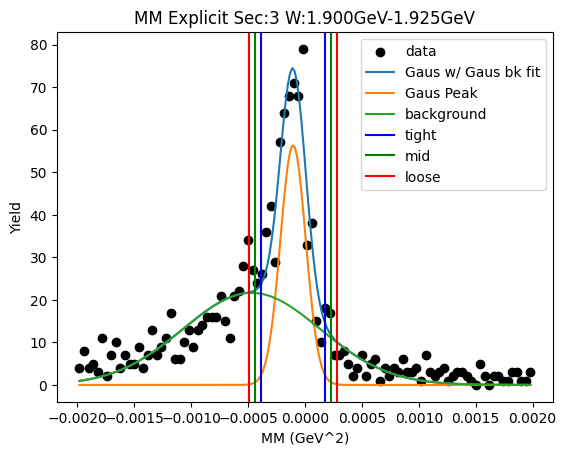

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 6.03699885e+01 -1.61238821e-04  2.45622080e-04]
2nd level W dependent
W1_ini_pars: [ 6.03699885e+01 -1.61238821e-04  2.45622080e-04  2.16474995e+01
 -4.68458646e-04  6.03155632e-04]
Gaus1 Peak: [ 6.43486878e+01 -8.60344605e-05  9.08871388e-05]
Gaus2 Peak: [ 2.34176853e+01 -4.49347994e-04  6.17181538e-04]
tight should be -0.000313252307605935   0.00014118338657213175
[[-0.00031325  0.          0.        ]
 [ 0.00014118  0.          0.        ]]
mid should be -0.0003586958770237417   0.00018662695598993837
[[-0.00031325 -0.0003587   0.        ]
 [ 0.00014118  0.00018663  0.        ]]
loose should be -0.00040413944644154836   0.00023207052540774505
[[-0.00031325 -0.0003587  -0.00040414]
 [ 0.00014118  0.00018663  0.00023207]]
-1.7379487620737858e-08 3.2183344413606474e-08
Main Gaus Peak [ 6.43486878e+01 -8.60344605e-05  9.08871388e-05]
Gaus2 [ 2.34176853e+01 -4.49347994e-04  6.17181538e-04]


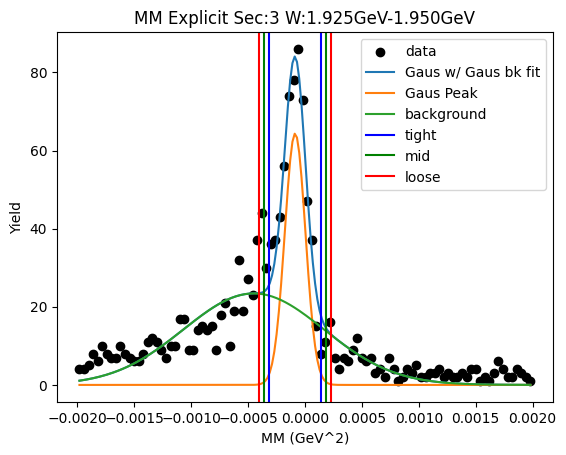

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 6.22996805e+01 -1.72396407e-04  2.34705101e-04]
2nd level W dependent
W1_ini_pars: [ 6.22996805e+01 -1.72396407e-04  2.34705101e-04  2.34176853e+01
 -4.49347994e-04  6.17181538e-04]
Gaus1 Peak: [ 5.76670347e+01 -1.29093907e-04  1.39045838e-04]
Gaus2 Peak: [ 1.79101414e+01 -5.64990306e-04  6.87893248e-04]
tight should be -0.0004767085029428757   0.00021852068857539493
[[-0.00047671  0.          0.        ]
 [ 0.00021852  0.          0.        ]]
mid should be -0.0005462314220947028   0.00028804360772722204
[[-0.00047671 -0.00054623  0.        ]
 [ 0.00021852  0.00028804  0.        ]]
loose should be -0.0006157543412465299   0.0003575665268790491
[[-0.00047671 -0.00054623 -0.00061575]
 [ 0.00021852  0.00028804  0.00035757]]
-4.1335998576733616e-08 7.466647232066198e-08
Main Gaus Peak [ 5.76670347e+01 -1.29093907e-04  1.39045838e-04]
Gaus2 [ 1.79101414e+01 -5.64990306e-04  6.87893248e-04]


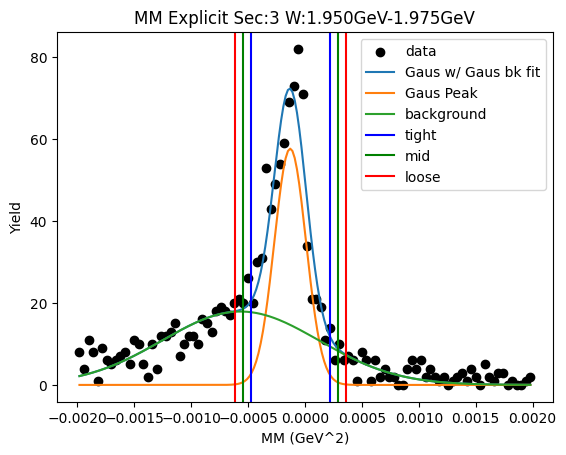

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 5.14606788e+01 -1.82433211e-04  2.78582622e-04]
2nd level W dependent
W1_ini_pars: [ 5.14606788e+01 -1.82433211e-04  2.78582622e-04  1.79101414e+01
 -5.64990306e-04  6.87893248e-04]
Gaus1 Peak: [ 5.00374013e+01 -8.52948875e-05  1.01802440e-04]
Gaus2 Peak: [ 2.29261056e+01 -4.47237871e-04  5.79651754e-04]
tight should be -0.0003398009881741375   0.00016921121324298236
[[-0.0003398   0.          0.        ]
 [ 0.00016921  0.          0.        ]]
mid should be -0.0003907022083158495   0.00022011243338469435
[[-0.0003398  -0.0003907   0.        ]
 [ 0.00016921  0.00022011  0.        ]]
loose should be -0.00044160342845756147   0.00027101365352640635
[[-0.0003398  -0.0003907  -0.0004416 ]
 [ 0.00016921  0.00022011  0.00027101]]
-2.3815992715214772e-08 3.836642837074585e-08
Main Gaus Peak [ 5.00374013e+01 -8.52948875e-05  1.01802440e-04]
Gaus2 [ 2.29261056e+01 -4.47237871e-04  5.79651754e-04]


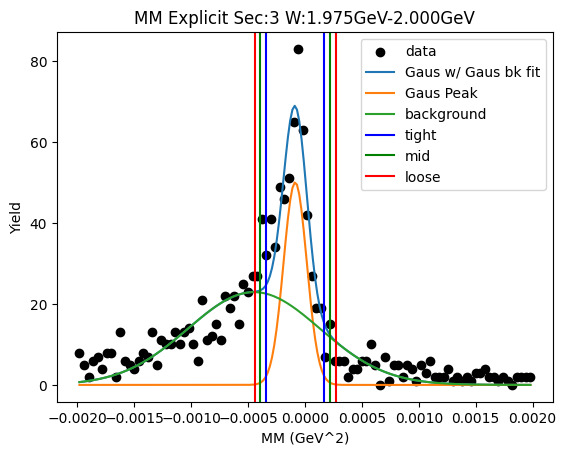

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 6.13077489e+01 -1.62719974e-04  2.21894533e-04]
2nd level W dependent
W1_ini_pars: [ 6.13077489e+01 -1.62719974e-04  2.21894533e-04  2.29261056e+01
 -4.47237871e-04  5.79651754e-04]
Gaus1 Peak: [ 6.19971347e+01 -8.33831794e-05  6.52883230e-05]
Gaus2 Peak: [ 3.11961573e+01 -3.14101871e-04  3.98518461e-04]
tight should be -0.000246603986853448   7.983762812322894e-05
[[-2.46603987e-04  0.00000000e+00  0.00000000e+00]
 [ 7.98376281e-05  0.00000000e+00  0.00000000e+00]]
mid should be -0.00027924814835111574   0.00011248178962089666
[[-2.46603987e-04 -2.79248148e-04  0.00000000e+00]
 [ 7.98376281e-05  1.12481790e-04  0.00000000e+00]]
loose should be -0.00031189230984878343   0.00014512595111856435
[[-2.46603987e-04 -2.79248148e-04 -3.11892310e-04]
 [ 7.98376281e-05  1.12481790e-04  1.45125951e-04]]
-5.834940757595693e-09 1.974044995966375e-08
Main Gaus Peak [ 6.19971347e+01 -8.33831794e-05  6.52883230e-05]
Gaus2 [ 3.11961573e+01 -3.14101871e-

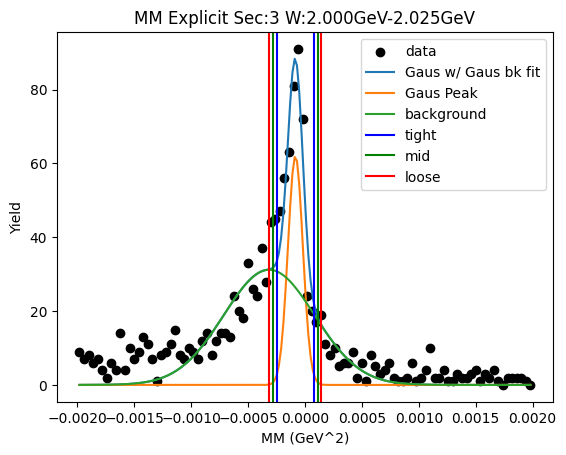

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 5.01469880e+01 -1.74207748e-04  2.72686439e-04]
2nd level W dependent
W1_ini_pars: [ 5.01469880e+01 -1.74207748e-04  2.72686439e-04  3.11961573e+01
 -3.14101871e-04  3.98518461e-04]
Gaus1 Peak: [ 4.66973557e+01 -1.00705456e-04  1.24629118e-04]
Gaus2 Peak: [ 1.93887391e+01 -4.61603462e-04  5.98691634e-04]
tight should be -0.0004122782515704105   0.00021086733955526238
[[-0.00041228  0.          0.        ]
 [ 0.00021087  0.          0.        ]]
mid should be -0.00047459281068297786   0.0002731818986678297
[[-0.00041228 -0.00047459  0.        ]
 [ 0.00021087  0.00027318  0.        ]]
loose should be -0.0005369073697955452   0.000335496457780397
[[-0.00041228 -0.00047459 -0.00053691]
 [ 0.00021087  0.00027318  0.0003355 ]]
-3.6455662459030286e-08 5.673884019841717e-08
Main Gaus Peak [ 4.66973557e+01 -1.00705456e-04  1.24629118e-04]
Gaus2 [ 1.93887391e+01 -4.61603462e-04  5.98691634e-04]


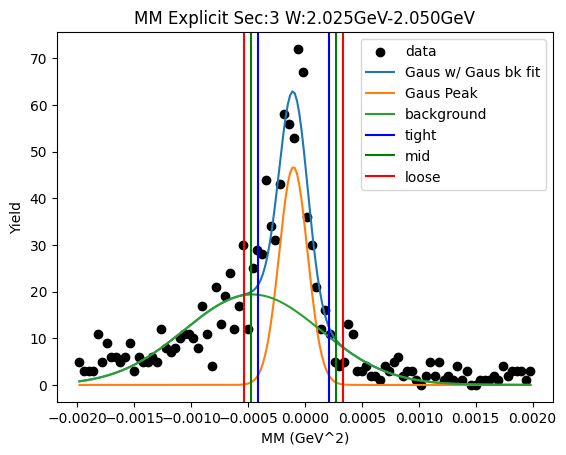

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 6.04836285e+01 -1.58028279e-04  2.18982076e-04]
2nd level W dependent
W1_ini_pars: [ 6.04836285e+01 -1.58028279e-04  2.18982076e-04  1.93887391e+01
 -4.61603462e-04  5.98691634e-04]
Gaus1 Peak: [ 5.58357939e+01 -1.19828096e-04  1.33807302e-04]
Gaus2 Peak: [ 1.64688808e+01 -5.70589497e-04  7.40422970e-04]
tight should be -0.0004543463511149222   0.00021469015834947472
[[-0.00045435  0.          0.        ]
 [ 0.00021469  0.          0.        ]]
mid should be -0.0005212500020613618   0.00028159380929591437
[[-0.00045435 -0.00052125  0.        ]
 [ 0.00021469  0.00028159  0.        ]]
loose should be -0.0005881536530078016   0.00034849746024235407
[[-0.00045435 -0.00052125 -0.00058815]
 [ 0.00021469  0.00028159  0.0003485 ]]
-3.9354409436849154e-08 6.807195480226381e-08
Main Gaus Peak [ 5.58357939e+01 -1.19828096e-04  1.33807302e-04]
Gaus2 [ 1.64688808e+01 -5.70589497e-04  7.40422970e-04]


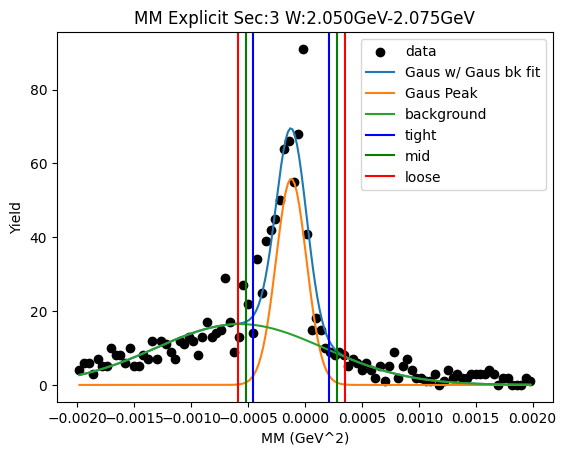

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 5.36854629e+01 -1.48937608e-04  2.35740245e-04]
2nd level W dependent
W1_ini_pars: [ 5.36854629e+01 -1.48937608e-04  2.35740245e-04  1.64688808e+01
 -5.70589497e-04  7.40422970e-04]
Gaus1 Peak: [ 5.18157931e+01 -1.12004611e-04  1.21614520e-04]
Gaus2 Peak: [ 1.59382910e+01 -4.84886514e-04  7.47505244e-04]
tight should be -0.00041604091105824497   0.0001920316892660775
[[-0.00041604  0.          0.        ]
 [ 0.00019203  0.          0.        ]]
mid should be -0.00047684817109067726   0.0002528389492985098
[[-0.00041604 -0.00047685  0.        ]
 [ 0.00019203  0.00025284  0.        ]]
loose should be -0.0005376554311231095   0.000313646209330942
[[-0.00041604 -0.00047685 -0.00053766]
 [ 0.00019203  0.00025284  0.00031365]]
-3.182524160983886e-08 5.6915307333805115e-08
Main Gaus Peak [ 5.18157931e+01 -1.12004611e-04  1.21614520e-04]
Gaus2 [ 1.59382910e+01 -4.84886514e-04  7.47505244e-04]


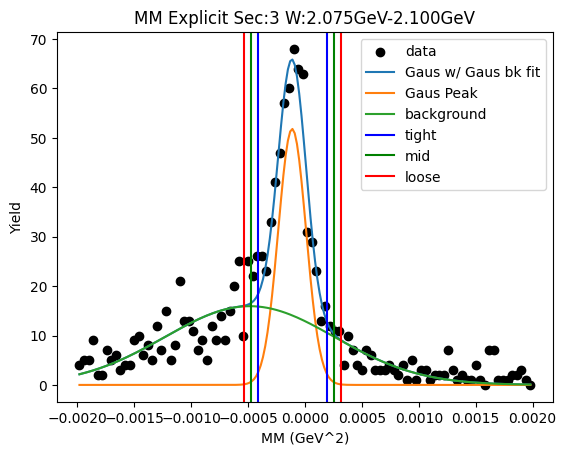

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 4.86131174e+01 -1.64413491e-04  2.44783982e-04]
2nd level W dependent
W1_ini_pars: [ 4.86131174e+01 -1.64413491e-04  2.44783982e-04  1.59382910e+01
 -4.84886514e-04  7.47505244e-04]
Gaus1 Peak: [ 4.65691106e+01 -1.10160950e-04  1.29505213e-04]
Gaus2 Peak: [ 1.42897392e+01 -5.73518583e-04  8.36150288e-04]
tight should be -0.00043392398277699413   0.0002136020831647659
[[-0.00043392  0.          0.        ]
 [ 0.0002136   0.          0.        ]]
mid should be -0.0004986765893711701   0.00027835468975894194
[[-0.00043392 -0.00049868  0.        ]
 [ 0.0002136   0.00027835  0.        ]]
loose should be -0.0005634291959653461   0.00034310729635311793
[[-0.00043392 -0.00049868 -0.00056343]
 [ 0.0002136   0.00027835  0.00034311]]
-3.817936586669632e-08 6.24502355910667e-08
Main Gaus Peak [ 4.65691106e+01 -1.10160950e-04  1.29505213e-04]
Gaus2 [ 1.42897392e+01 -5.73518583e-04  8.36150288e-04]


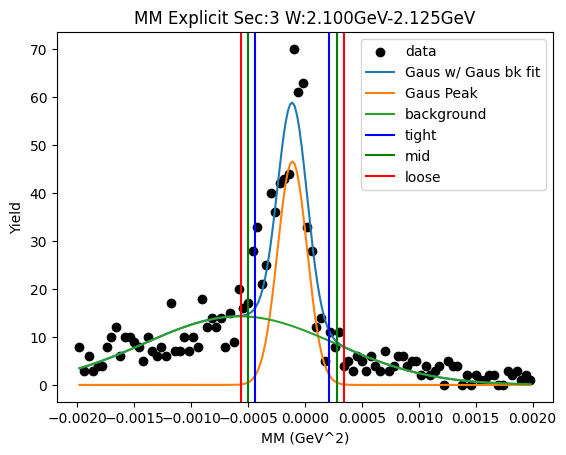

initial bw fit:  [ 1.46411472e+03 -1.96306327e-04  2.99921412e-04]
input parameters for r2 [ 1.46411472e+03 -1.96306327e-04  2.99921412e-04  5.00000000e+02
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 1.34185468e+03 -1.29724216e-04  1.48564788e-04  5.20257217e+02
 -5.16870426e-04  7.15397115e-04]
-4.938611616989808e-08 8.304286086123472e-08
Main Gaus Peak [ 1.34185468e+03 -1.29724216e-04  1.48564788e-04]
Gaus2 [ 5.20257217e+02 -5.16870426e-04  7.15397115e-04]


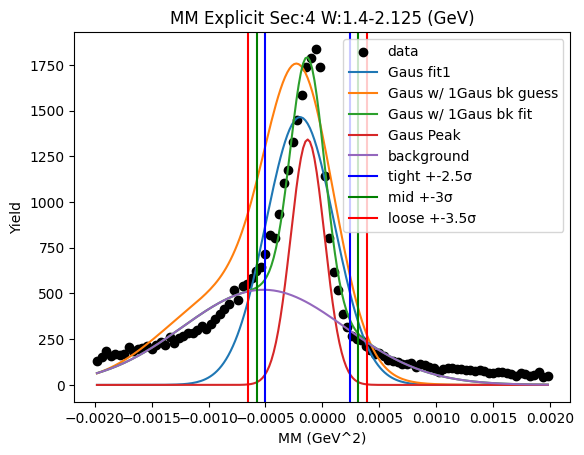

W bin: 0 1.400GeV-1.425GeV
W bin: 1 1.425GeV-1.450GeV
W bin: 2 1.450GeV-1.475GeV
W bin: 3 1.475GeV-1.500GeV
W bin: 4 1.500GeV-1.525GeV
W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 0.32330856 -0.0003432   0.00041977]
2nd level W dependent
W1_ini_pars: [ 3.23308556e-01 -3.43203031e-04  4.19774359e-04  3.07211428e+00
 -1.00000000e-02  6.74285300e-02]
Gaus1 Peak: [ 5.01696803e+00 -3.19995919e-04  1.05003141e-05]
Gaus2 Peak: [ 0.18360076 -0.00041484  0.00075385]
tight should be -0.0003462467039757547   -0.00029374513356685396
[[-0.00034625  0.          0.        ]
 [-0.00029375  0.          0.        ]]
mid should be -0.0003514968610166447   -0.0002884949765259639
[[-0.00034625 -0.0003515   0.        ]
 [-0.00029375 -0.00028849  0.        ]]
loose should be -0.0003567470180575348   -0.00028324481948507386
[[-0.00034625 -0.0003515  -0.00035675]
 [-0.00029375 -0.00028849 -0.00028324]]
1.020666182428431e-07 1.0272815781773927e-07
Main Gaus Peak [ 5.01696803e+00 -3.19995919e-04  1.05003141e-

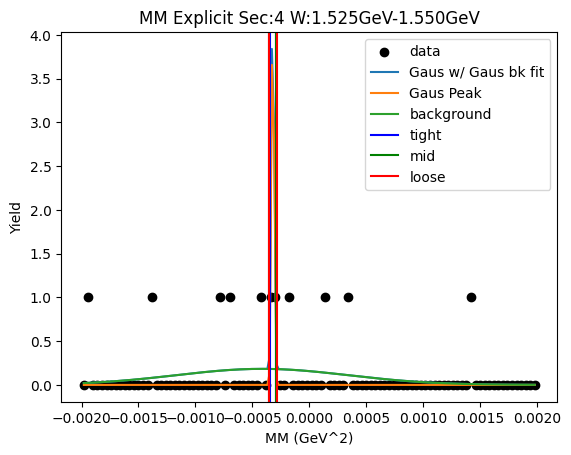

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 5.76910945e+00 -1.24831619e-04  1.32634339e-05]
2nd level W dependent
W1_ini_pars: [ 5.76910945e+00 -1.24831619e-04  1.32634339e-05  1.83600761e-01
 -4.14843064e-04  7.53854147e-04]
Gaus1 Peak: [ 8.43106134e+00 -1.24219805e-04  1.00000059e-05]
Gaus2 Peak: [ 6.07308074e-01 -2.81886853e-04  4.13065717e-04]
tight should be -0.00014921981998977622   -9.921979073504787e-05
[[-1.49219820e-04  0.00000000e+00  0.00000000e+00]
 [-9.92197907e-05  0.00000000e+00  0.00000000e+00]]
mid should be -0.00015421982291524905   -9.421978780957505e-05
[[-1.49219820e-04 -1.54219823e-04  0.00000000e+00]
 [-9.92197907e-05 -9.42197878e-05  0.00000000e+00]]
loose should be -0.0001592198258407219   -8.921978488410221e-05
[[-1.49219820e-04 -1.54219823e-04 -1.59219826e-04]
 [-9.92197907e-05 -9.42197878e-05 -8.92197849e-05]]
1.513055969321869e-08 1.5730560395332378e-08
Main Gaus Peak [ 8.43106134e+00 -1.24219805e-04  1.00000059e-05]
Gaus2 [ 6.07308074e-01 -2.81886853e

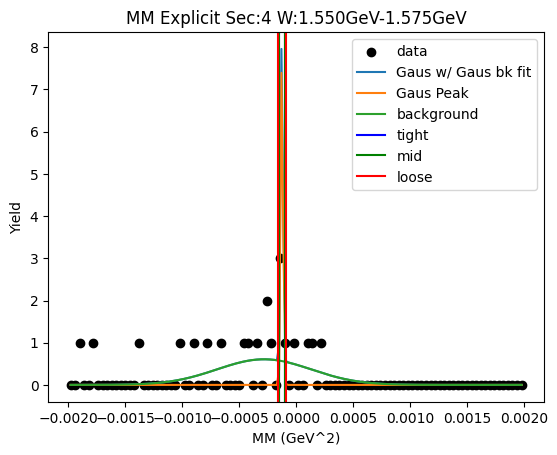

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 1.99999844e+00 -1.01999260e-03  1.00000000e-05]
2nd level W dependent
W1_ini_pars: [ 1.99999844e+00 -1.01999260e-03  1.00000000e-05  6.07308074e-01
 -2.81886853e-04  4.13065717e-04]
Gaus1 Peak: [ 7.39557841e-01 -1.97981666e-04  4.71090114e-04]
Gaus2 Peak: [ 1.83806240e+00 -1.02024648e-03  1.00000000e-05]
tight should be -0.001375706952549803   0.0009797436196498817
[[-0.00137571  0.          0.        ]
 [ 0.00097974  0.          0.        ]]
mid should be -0.0016112520097697714   0.0012152886768698502
[[-0.00137571 -0.00161125  0.        ]
 [ 0.00097974  0.00121529  0.        ]]
loose should be -0.0018467970669897396   0.0014508337340898188
[[-0.00137571 -0.00161125 -0.0018468 ]
 [ 0.00097974  0.00121529  0.00145083]]
1.0406028756944448e-06 1.0412028756944449e-06
Main Gaus Peak [ 7.39557841e-01 -1.97981666e-04  4.71090114e-04]
Gaus2 [ 1.83806240e+00 -1.02024648e-03  1.00000000e-05]


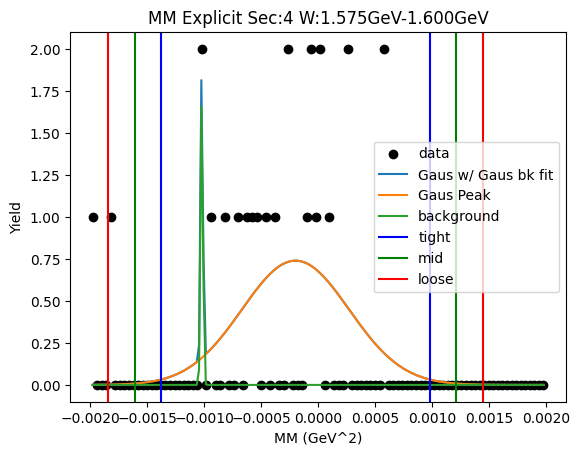

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 1.79888347e+00 -2.57536665e-04  4.16200136e-04]
2nd level W dependent
W1_ini_pars: [ 1.79888347e+00 -2.57536665e-04  4.16200136e-04  1.83806240e+00
 -1.02024648e-03  1.00000000e-05]
Gaus1 Peak: [ 1.84082707e+00 -2.49661300e-04  3.95663412e-04]
Gaus2 Peak: [ 6.33439355e+00 -1.35766237e-03  1.15262532e-05]
tight should be -0.0012388198305343075   0.0007394972314378599
[[-0.00123882  0.          0.        ]
 [ 0.0007395   0.          0.        ]]
mid should be -0.0014366515367315244   0.0009373289376350768
[[-0.00123882 -0.00143665  0.        ]
 [ 0.0007395   0.00093733  0.        ]]
loose should be -0.0016344832429287409   0.0011351606438322935
[[-0.00123882 -0.00143665 -0.00163448]
 [ 0.0007395   0.00093733  0.00113516]]
-4.073178432307147e-07 5.319793722149306e-07
Main Gaus Peak [ 1.84082707e+00 -2.49661300e-04  3.95663412e-04]
Gaus2 [ 6.33439355e+00 -1.35766237e-03  1.15262532e-05]


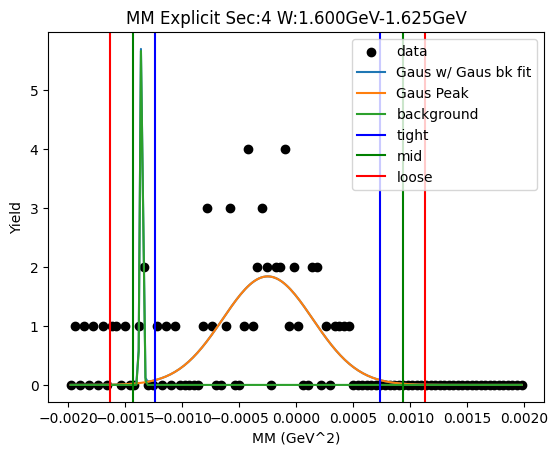

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 6.35765212e+00 -1.92091408e-04  1.92049357e-04]
2nd level W dependent
W1_ini_pars: [ 6.35765212e+00 -1.92091408e-04  1.92049357e-04  6.33439355e+00
 -1.35766237e-03  1.15262532e-05]
Gaus1 Peak: [ 6.35780759e+00 -1.92085196e-04  1.92039966e-04]
Gaus2 Peak: [ 4.11451618e+00 -1.34889938e-03  7.40972419e-06]
tight should be -0.0006721851115834758   0.00028801472027337893
[[-0.00067219  0.          0.        ]
 [ 0.00028801  0.          0.        ]]
mid should be -0.0007682050947691614   0.0003840347034590645
[[-0.00067219 -0.00076821  0.        ]
 [ 0.00028801  0.00038403  0.        ]]
loose should be -0.0008642250779548469   0.00048005468664474995
[[-0.00067219 -0.00076821 -0.00086423]
 [ 0.00028801  0.00038403  0.00048005]]
-7.374132366191364e-08 1.4753476844159013e-07
Main Gaus Peak [ 6.35780759e+00 -1.92085196e-04  1.92039966e-04]
Gaus2 [ 4.11451618e+00 -1.34889938e-03  7.40972419e-06]


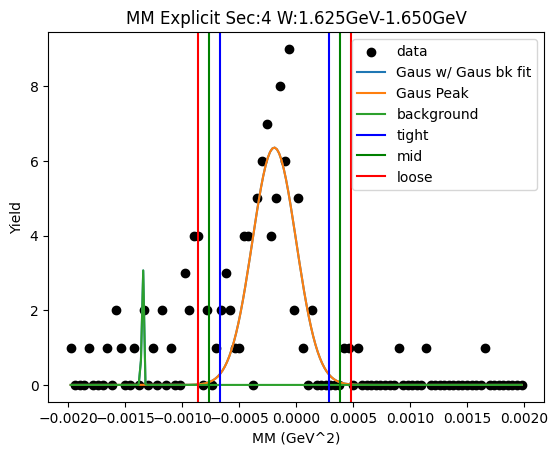

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 9.15516598e+00 -1.75101694e-04  2.50800965e-04]
2nd level W dependent
W1_ini_pars: [ 9.15516598e+00 -1.75101694e-04  2.50800965e-04  4.11451618e+00
 -1.34889938e-03  7.40972419e-06]
Gaus1 Peak: [ 9.15517619e+00 -1.75102982e-04  2.50800060e-04]
Gaus2 Peak: [ 4.92893273e+00 -1.40255046e-03  3.05238272e-05]
tight should be -0.0008021031324411011   0.0004518971692121836
[[-0.0008021  0.         0.       ]
 [ 0.0004519  0.         0.       ]]
mid should be -0.0009275031626064296   0.0005772971993775121
[[-0.0008021 -0.0009275  0.       ]
 [ 0.0004519  0.0005773  0.       ]]
loose should be -0.001052903192771758   0.0007026972295428405
[[-0.0008021 -0.0009275 -0.0010529]
 [ 0.0004519  0.0005773  0.0007027]]
-1.5804095661531002e-07 2.1936306495585696e-07
Main Gaus Peak [ 9.15517619e+00 -1.75102982e-04  2.50800060e-04]
Gaus2 [ 4.92893273e+00 -1.40255046e-03  3.05238272e-05]


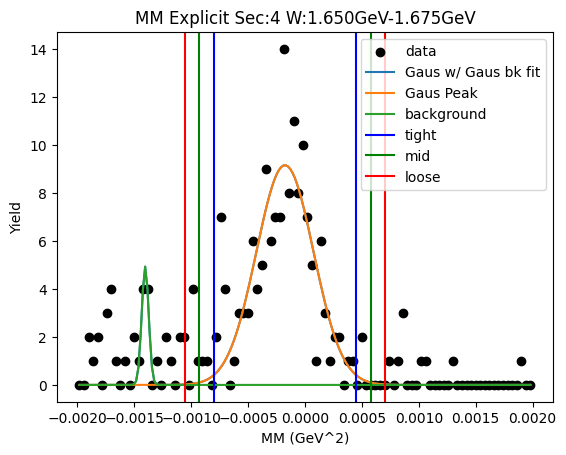

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 1.46678189e+01 -1.91603160e-04  2.64003386e-04]
2nd level W dependent
W1_ini_pars: [ 1.46678189e+01 -1.91603160e-04  2.64003386e-04  4.92893273e+00
 -1.40255046e-03  3.05238272e-05]
Gaus1 Peak: [ 1.57148492e+01 -1.14435151e-04  9.42659590e-05]
Gaus2 Peak: [ 6.00150645e+00 -4.92720996e-04  6.15594165e-04]
tight should be -0.0003501000482895939   0.00012122974681573562
[[-0.0003501   0.          0.        ]
 [ 0.00012123  0.          0.        ]]
mid should be -0.00039723302780012677   0.00016836272632626855
[[-0.0003501  -0.00039723  0.        ]
 [ 0.00012123  0.00016836  0.        ]]
loose should be -0.00044436600731065975   0.00021549570583680153
[[-0.0003501  -0.00039723 -0.00044437]
 [ 0.00012123  0.00016836  0.0002155 ]]
-1.3562809366300133e-08 3.975361681466751e-08
Main Gaus Peak [ 1.57148492e+01 -1.14435151e-04  9.42659590e-05]
Gaus2 [ 6.00150645e+00 -4.92720996e-04  6.15594165e-04]


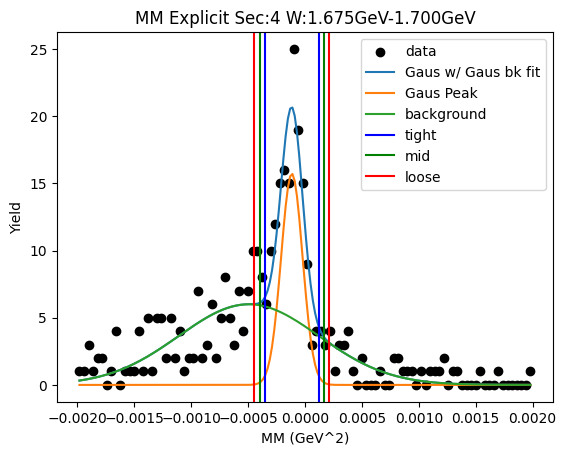

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 1.95338805e+01 -1.95834147e-04  2.93076448e-04]
2nd level W dependent
W1_ini_pars: [ 1.95338805e+01 -1.95834147e-04  2.93076448e-04  6.00150645e+00
 -4.92720996e-04  6.15594165e-04]
Gaus1 Peak: [ 2.01525919e+01 -6.33737750e-05  7.00977530e-05]
Gaus2 Peak: [ 1.18293244e+01 -3.61351396e-04  4.33055525e-04]
tight should be -0.00023861815749516002   0.00011187060754445029
[[-0.00023862  0.          0.        ]
 [ 0.00011187  0.          0.        ]]
mid should be -0.00027366703399912107   0.00014691948404841135
[[-0.00023862 -0.00027367  0.        ]
 [ 0.00011187  0.00014692  0.        ]]
loose should be -0.0003087159105030821   0.00018196836055237237
[[-0.00023862 -0.00027367 -0.00030872]
 [ 0.00011187  0.00014692  0.00018197]]
-1.0724849575652028e-08 1.8757320284905855e-08
Main Gaus Peak [ 2.01525919e+01 -6.33737750e-05  7.00977530e-05]
Gaus2 [ 1.18293244e+01 -3.61351396e-04  4.33055525e-04]


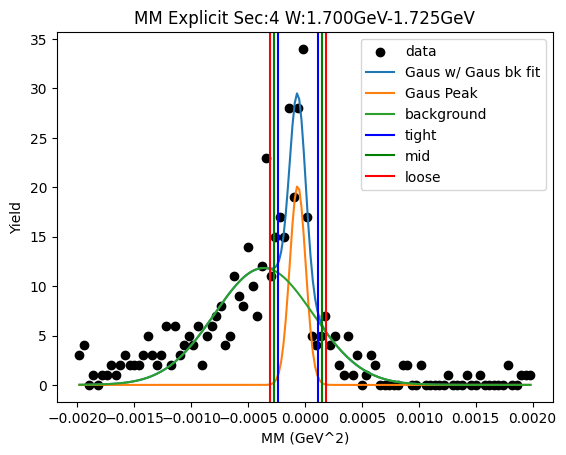

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 2.42961371e+01 -2.09809920e-04  2.98725094e-04]
2nd level W dependent
W1_ini_pars: [ 2.42961371e+01 -2.09809920e-04  2.98725094e-04  1.18293244e+01
 -3.61351396e-04  4.33055525e-04]
Gaus1 Peak: [ 2.12177042e+01 -1.26769062e-04  1.21601552e-04]
Gaus2 Peak: [ 1.13538098e+01 -4.16370765e-04  5.23379449e-04]
tight should be -0.0004307729426241214   0.00017723481933557168
[[-0.00043077  0.          0.        ]
 [ 0.00017723  0.          0.        ]]
mid should be -0.0004915737188200906   0.00023803559553154096
[[-0.00043077 -0.00049157  0.        ]
 [ 0.00017723  0.00023804  0.        ]]
loose should be -0.0005523744950160599   0.00029883637172751023
[[-0.00043077 -0.00049157 -0.00055237]
 [ 0.00017723  0.00023804  0.00029884]]
-2.829041764221821e-08 6.043120762255813e-08
Main Gaus Peak [ 2.12177042e+01 -1.26769062e-04  1.21601552e-04]
Gaus2 [ 1.13538098e+01 -4.16370765e-04  5.23379449e-04]


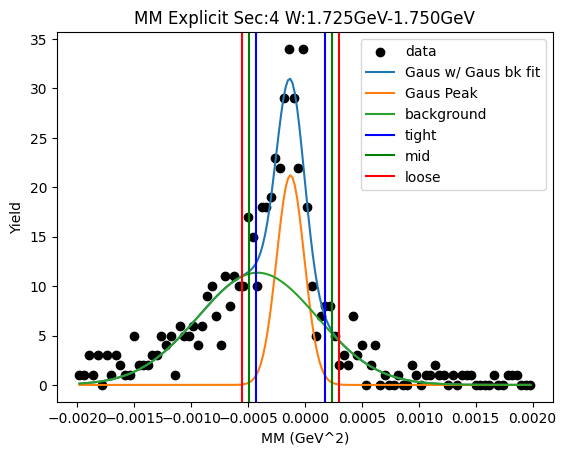

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 2.79783451e+01 -1.85318739e-04  3.09569194e-04]
2nd level W dependent
W1_ini_pars: [ 2.79783451e+01 -1.85318739e-04  3.09569194e-04  1.13538098e+01
 -4.16370765e-04  5.23379449e-04]
Gaus1 Peak: [ 2.60927376e+01 -1.02162800e-04  1.24683892e-04]
Gaus2 Peak: [ 1.23530180e+01 -4.34025329e-04  5.87869566e-04]
tight should be -0.00041387252872976594   0.0002095469290991893
[[-0.00041387  0.          0.        ]
 [ 0.00020955  0.          0.        ]]
mid should be -0.0004762144745126615   0.0002718888748820849
[[-0.00041387 -0.00047621  0.        ]
 [ 0.00020955  0.00027189  0.        ]]
loose should be -0.000538556420295557   0.0003342308206649804
[[-0.00041387 -0.00047621 -0.00053856]
 [ 0.00020955  0.00027189  0.00033423]]
-3.620098078187116e-08 5.7075456114068504e-08
Main Gaus Peak [ 2.60927376e+01 -1.02162800e-04  1.24683892e-04]
Gaus2 [ 1.23530180e+01 -4.34025329e-04  5.87869566e-04]


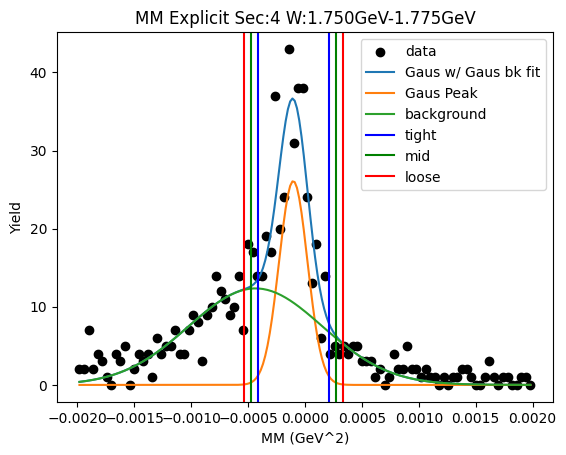

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 2.95351103e+01 -1.90868364e-04  2.98697126e-04]
2nd level W dependent
W1_ini_pars: [ 2.95351103e+01 -1.90868364e-04  2.98697126e-04  1.23530180e+01
 -4.34025329e-04  5.87869566e-04]
Gaus1 Peak: [ 2.82038537e+01 -1.04869695e-04  1.19461291e-04]
Gaus2 Peak: [ 1.26523434e+01 -4.53282668e-04  6.00095021e-04]
tight should be -0.00040352292277733714   0.00019378353239040221
[[-0.00040352  0.          0.        ]
 [ 0.00019378  0.          0.        ]]
mid should be -0.00046325356829411105   0.0002535141779071761
[[-0.00040352 -0.00046325  0.        ]
 [ 0.00019378  0.00025351  0.        ]]
loose should be -0.000522984213810885   0.00031324482342395
[[-0.00040352 -0.00046325 -0.00052298]
 [ 0.00019378  0.00025351  0.00031324]]
-3.18153471962353e-08 5.381065313617684e-08
Main Gaus Peak [ 2.82038537e+01 -1.04869695e-04  1.19461291e-04]
Gaus2 [ 1.26523434e+01 -4.53282668e-04  6.00095021e-04]


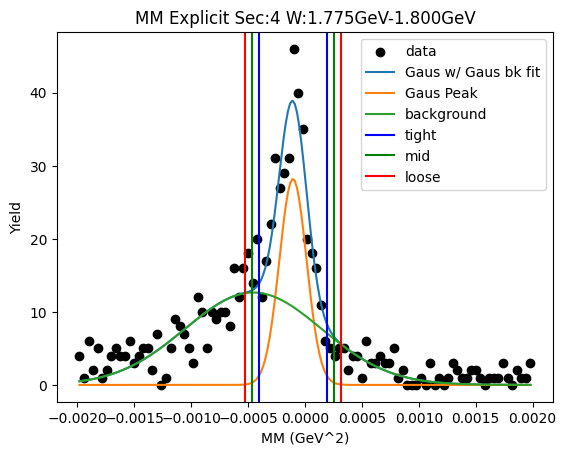

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 2.85047802e+01 -2.18307842e-04  3.15266368e-04]
2nd level W dependent
W1_ini_pars: [ 2.85047802e+01 -2.18307842e-04  3.15266368e-04  1.26523434e+01
 -4.53282668e-04  6.00095021e-04]
Gaus1 Peak: [ 2.47647807e+01 -1.66840626e-04  1.93744626e-04]
Gaus2 Peak: [ 8.45265783e+00 -5.52994292e-04  7.79230901e-04]
tight should be -0.000651202190624425   0.0003175209393956117
[[-0.0006512   0.          0.        ]
 [ 0.00031752  0.          0.        ]]
mid should be -0.0007480745036264287   0.0004143932523976154
[[-0.0006512  -0.00074807  0.        ]
 [ 0.00031752  0.00041439  0.        ]]
loose should be -0.0008449468166284324   0.0005112655653996191
[[-0.0006512  -0.00074807 -0.00084495]
 [ 0.00031752  0.00041439  0.00051127]]
-8.477514596089143e-08 1.4044673467170462e-07
Main Gaus Peak [ 2.47647807e+01 -1.66840626e-04  1.93744626e-04]
Gaus2 [ 8.45265783e+00 -5.52994292e-04  7.79230901e-04]


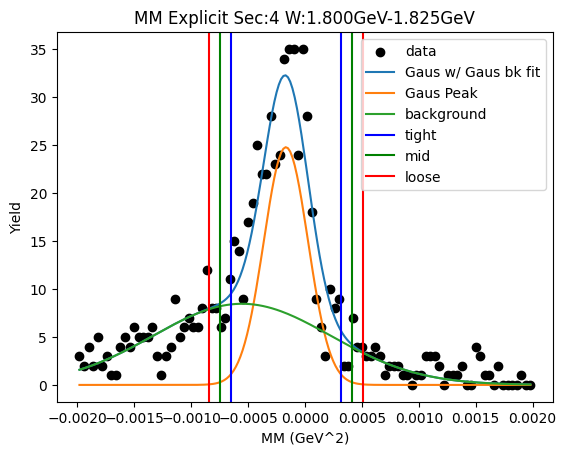

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 3.67953205e+01 -1.82076520e-04  2.54325331e-04]
2nd level W dependent
W1_ini_pars: [ 3.67953205e+01 -1.82076520e-04  2.54325331e-04  8.45265783e+00
 -5.52994292e-04  7.79230901e-04]
Gaus1 Peak: [ 3.44472601e+01 -1.34320372e-04  1.46083957e-04]
Gaus2 Peak: [ 1.06340645e+01 -6.12932288e-04  7.70756571e-04]
tight should be -0.0004995302645249045   0.0002308895214011975
[[-0.00049953  0.          0.        ]
 [ 0.00023089  0.          0.        ]]
mid should be -0.0005725722431175147   0.00030393149999380766
[[-0.00049953 -0.00057257  0.        ]
 [ 0.00023089  0.00030393  0.        ]]
loose should be -0.0006456142217101248   0.00037697347858641785
[[-0.00049953 -0.00057257 -0.00064561]
 [ 0.00023089  0.00030393  0.00037697]]
-4.597960542416554e-08 8.206352985719428e-08
Main Gaus Peak [ 3.44472601e+01 -1.34320372e-04  1.46083957e-04]
Gaus2 [ 1.06340645e+01 -6.12932288e-04  7.70756571e-04]


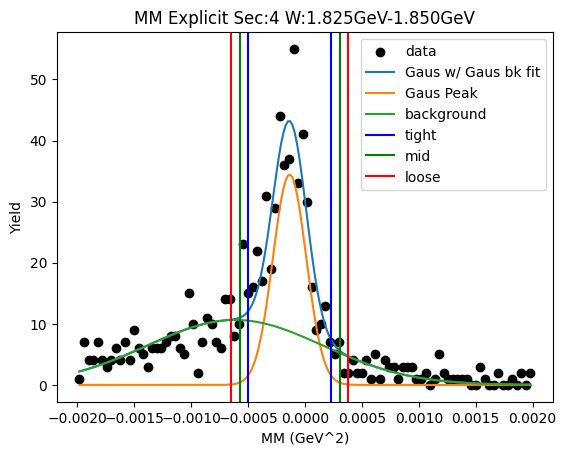

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 4.05363804e+01 -1.95411684e-04  2.76334702e-04]
2nd level W dependent
W1_ini_pars: [ 4.05363804e+01 -1.95411684e-04  2.76334702e-04  1.06340645e+01
 -6.12932288e-04  7.70756571e-04]
Gaus1 Peak: [ 3.70430815e+01 -1.42557983e-04  1.64660527e-04]
Gaus2 Peak: [ 1.20202209e+01 -6.12051086e-04  7.25681974e-04]
tight should be -0.0005542093003402887   0.00026909333527706217
[[-0.00055421  0.          0.        ]
 [ 0.00026909  0.          0.        ]]
mid should be -0.0006365395639020238   0.0003514235988387973
[[-0.00055421 -0.00063654  0.        ]
 [ 0.00026909  0.00035142  0.        ]]
loose should be -0.000718869827463759   0.0004337538624005324
[[-0.00055421 -0.00063654 -0.00071887]
 [ 0.00026909  0.00035142  0.00043375]]
-6.101648919425342e-08 1.0166204596122093e-07
Main Gaus Peak [ 3.70430815e+01 -1.42557983e-04  1.64660527e-04]
Gaus2 [ 1.20202209e+01 -6.12051086e-04  7.25681974e-04]


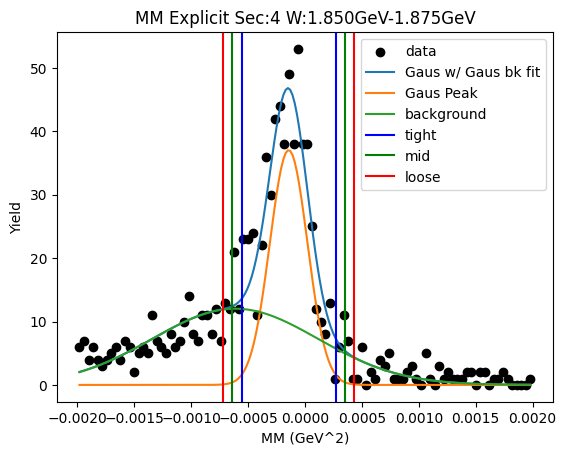

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 4.19034738e+01 -2.12706058e-04  3.10825656e-04]
2nd level W dependent
W1_ini_pars: [ 4.19034738e+01 -2.12706058e-04  3.10825656e-04  1.20202209e+01
 -6.12051086e-04  7.25681974e-04]
Gaus1 Peak: [ 3.66569972e+01 -1.63876504e-04  1.83127693e-04]
Gaus2 Peak: [ 1.29022499e+01 -5.30562467e-04  7.68025987e-04]
tight should be -0.0006216957355406233   0.0002939427275933228
[[-0.0006217   0.          0.        ]
 [ 0.00029394  0.          0.        ]]
mid should be -0.000713259581854018   0.00038550657390671743
[[-0.0006217  -0.00071326  0.        ]
 [ 0.00029394  0.00038551  0.        ]]
loose should be -0.0008048234281674126   0.00047707042022011203
[[-0.0006217  -0.00071326 -0.00080482]
 [ 0.00029394  0.00038551  0.00047707]]
-7.375174686580957e-08 1.274627639750612e-07
Main Gaus Peak [ 3.66569972e+01 -1.63876504e-04  1.83127693e-04]
Gaus2 [ 1.29022499e+01 -5.30562467e-04  7.68025987e-04]


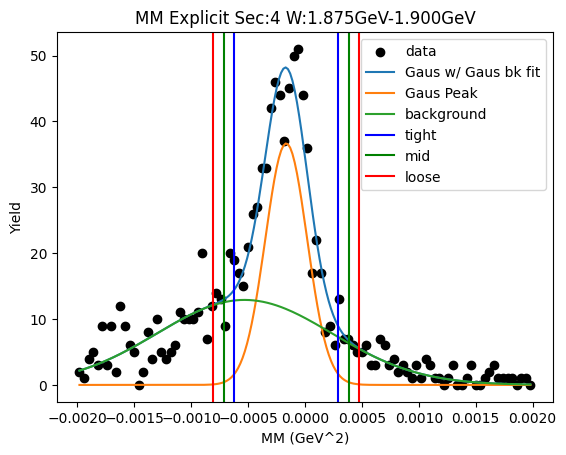

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 5.10088086e+01 -1.66991049e-04  2.47009907e-04]
2nd level W dependent
W1_ini_pars: [ 5.10088086e+01 -1.66991049e-04  2.47009907e-04  1.29022499e+01
 -5.30562467e-04  7.68025987e-04]
Gaus1 Peak: [ 4.60988617e+01 -1.32357010e-04  1.43255547e-04]
Gaus2 Peak: [ 1.53966178e+01 -4.94887830e-04  6.74462247e-04]
tight should be -0.0004904958789266386   0.00022578185827825832
[[-0.0004905   0.          0.        ]
 [ 0.00022578  0.          0.        ]]
mid should be -0.0005621236526471283   0.00029740963199874804
[[-0.0004905  -0.00056212  0.        ]
 [ 0.00022578  0.00029741  0.        ]]
loose should be -0.000633751426367618   0.00036903740571923773
[[-0.0004905  -0.00056212 -0.00063375]
 [ 0.00022578  0.00029741  0.00036904]]
-4.404807743588631e-08 7.908483379980186e-08
Main Gaus Peak [ 4.60988617e+01 -1.32357010e-04  1.43255547e-04]
Gaus2 [ 1.53966178e+01 -4.94887830e-04  6.74462247e-04]


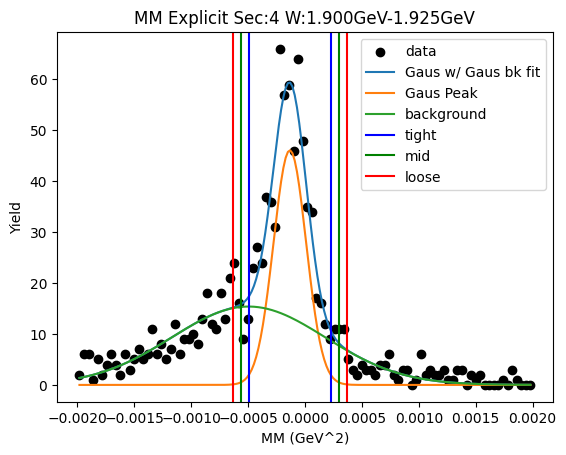

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 4.66390657e+01 -2.07612043e-04  3.17163801e-04]
2nd level W dependent
W1_ini_pars: [ 4.66390657e+01 -2.07612043e-04  3.17163801e-04  1.53966178e+01
 -4.94887830e-04  6.74462247e-04]
Gaus1 Peak: [ 4.09204463e+01 -1.47849445e-04  1.79544786e-04]
Gaus2 Peak: [ 1.53635626e+01 -5.30908550e-04  7.01933339e-04]
tight should be -0.0005967114109884619   0.0003010125210043138
[[-0.00059671  0.          0.        ]
 [ 0.00030101  0.          0.        ]]
mid should be -0.0006864838041877395   0.00039078491420359144
[[-0.00059671 -0.00068648  0.        ]
 [ 0.00030101  0.00039078  0.        ]]
loose should be -0.000776256197387017   0.00048055730740286895
[[-0.00059671 -0.00068648 -0.00077626]
 [ 0.00030101  0.00039078  0.00048056]]
-7.484953258424405e-08 1.1856844935317271e-07
Main Gaus Peak [ 4.09204463e+01 -1.47849445e-04  1.79544786e-04]
Gaus2 [ 1.53635626e+01 -5.30908550e-04  7.01933339e-04]


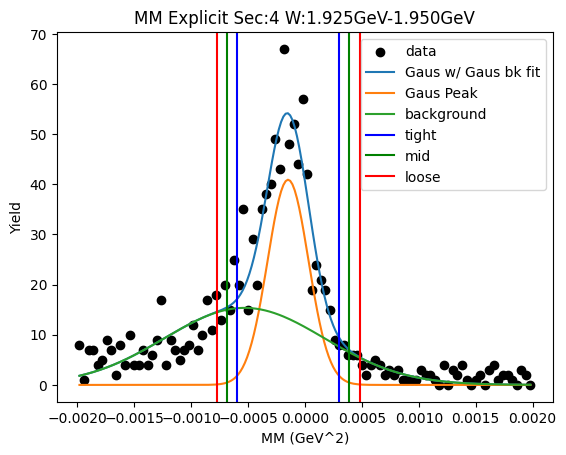

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 5.07850716e+01 -2.02065955e-04  3.17098734e-04]
2nd level W dependent
W1_ini_pars: [ 5.07850716e+01 -2.02065955e-04  3.17098734e-04  1.53635626e+01
 -5.30908550e-04  7.01933339e-04]
Gaus1 Peak: [ 4.05376188e+01 -1.01495288e-04  1.00904128e-04]
Gaus2 Peak: [ 2.91118002e+01 -3.39281450e-04  4.87940410e-04]
tight should be -0.0003537556077018516   0.00015076503231076861
[[-0.00035376  0.          0.        ]
 [ 0.00015077  0.          0.        ]]
mid should be -0.00040420767170311366   0.00020121709631203068
[[-0.00035376 -0.00040421  0.        ]
 [ 0.00015077  0.00020122  0.        ]]
loose should be -0.0004546597357043757   0.0002516691603132927
[[-0.00035376 -0.00040421 -0.00045466]
 [ 0.00015077  0.00020122  0.00025167]]
-2.0243635719448535e-08 4.084622256825002e-08
Main Gaus Peak [ 4.05376188e+01 -1.01495288e-04  1.00904128e-04]
Gaus2 [ 2.91118002e+01 -3.39281450e-04  4.87940410e-04]


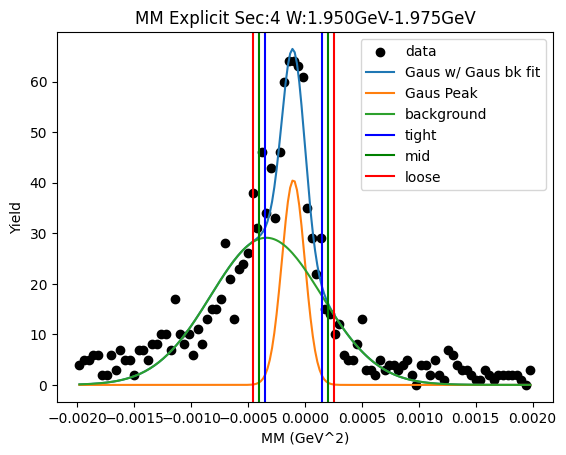

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 5.30410833e+01 -2.20829825e-04  3.13914385e-04]
2nd level W dependent
W1_ini_pars: [ 5.30410833e+01 -2.20829825e-04  3.13914385e-04  2.91118002e+01
 -3.39281450e-04  4.87940410e-04]
Gaus1 Peak: [ 4.70123877e+01 -1.54117489e-04  1.76996990e-04]
Gaus2 Peak: [ 1.82588801e+01 -5.98018264e-04  6.89292769e-04]
tight should be -0.0005966099651125753   0.0002883749862635956
[[-0.00059661  0.          0.        ]
 [ 0.00028837  0.          0.        ]]
mid should be -0.0006851084602501924   0.0003768734814012126
[[-0.00059661 -0.00068511  0.        ]
 [ 0.00028837  0.00037687  0.        ]]
loose should be -0.0007736069553878095   0.0004653719765388297
[[-0.00059661 -0.00068511 -0.00077361]
 [ 0.00028837  0.00037687  0.00046537]]
-7.023160315296625e-08 1.1773600424598175e-07
Main Gaus Peak [ 4.70123877e+01 -1.54117489e-04  1.76996990e-04]
Gaus2 [ 1.82588801e+01 -5.98018264e-04  6.89292769e-04]


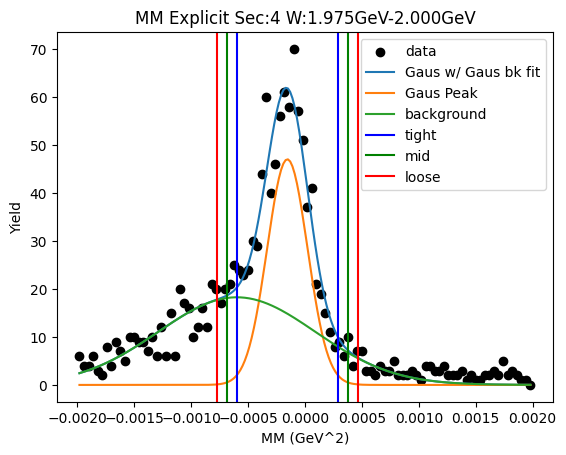

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 4.50508839e+01 -2.36724247e-04  3.79130779e-04]
2nd level W dependent
W1_ini_pars: [ 4.50508839e+01 -2.36724247e-04  3.79130779e-04  1.82588801e+01
 -5.98018264e-04  6.89292769e-04]
Gaus1 Peak: [ 4.15025517e+01 -1.11903986e-04  1.28703053e-04]
Gaus2 Peak: [ 2.34132002e+01 -4.71982780e-04  6.14229441e-04]
tight should be -0.0004336616175855065   0.00020985364597050972
[[-0.00043366  0.          0.        ]
 [ 0.00020985  0.          0.        ]]
mid should be -0.0004980131439411081   0.0002742051723261114
[[-0.00043366 -0.00049801  0.        ]
 [ 0.00020985  0.00027421  0.        ]]
loose should be -0.0005623646702967097   0.000338556698681713
[[-0.00043366 -0.00049801 -0.00056236]
 [ 0.00020985  0.00027421  0.00033856]]
-3.7170925291943486e-08 6.221592937115308e-08
Main Gaus Peak [ 4.15025517e+01 -1.11903986e-04  1.28703053e-04]
Gaus2 [ 2.34132002e+01 -4.71982780e-04  6.14229441e-04]


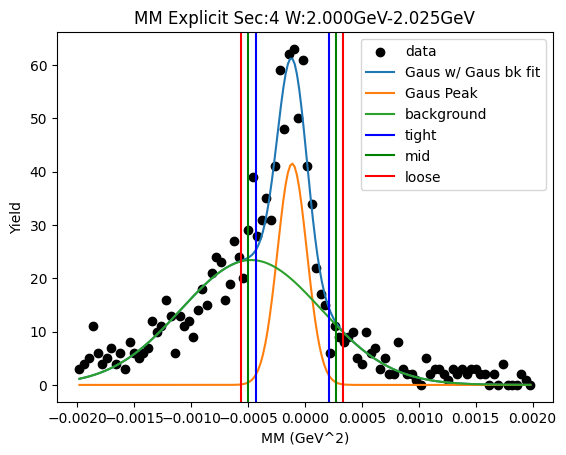

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 5.45852574e+01 -1.98753157e-04  3.07984602e-04]
2nd level W dependent
W1_ini_pars: [ 5.45852574e+01 -1.98753157e-04  3.07984602e-04  2.34132002e+01
 -4.71982780e-04  6.14229441e-04]
Gaus1 Peak: [ 4.80442791e+01 -1.08481080e-04  1.36498702e-04]
Gaus2 Peak: [ 2.37314743e+01 -4.56297520e-04  5.73352061e-04]
tight should be -0.00044972783373820535   0.0002327656741141003
[[-0.00044973  0.          0.        ]
 [ 0.00023277  0.          0.        ]]
mid should be -0.0005179771845234359   0.00030101502489933093
[[-0.00044973 -0.00051798  0.        ]
 [ 0.00023277  0.00030102  0.        ]]
loose should be -0.0005862265353086664   0.0003692643756845615
[[-0.00044973 -0.00051798 -0.00058623]
 [ 0.00023277  0.00030102  0.00036926]]
-4.412754191407652e-08 6.766383126845433e-08
Main Gaus Peak [ 4.80442791e+01 -1.08481080e-04  1.36498702e-04]
Gaus2 [ 2.37314743e+01 -4.56297520e-04  5.73352061e-04]


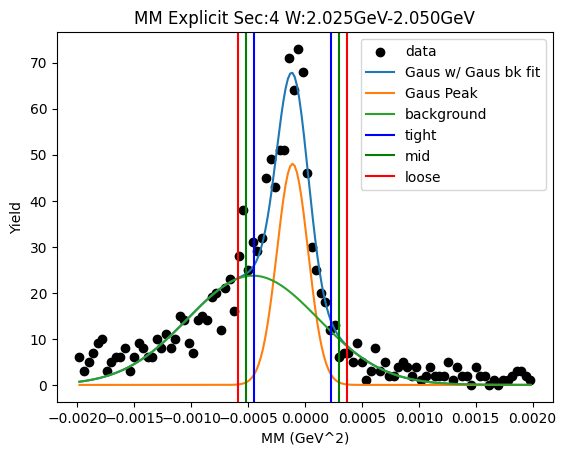

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 4.91967756e+01 -2.10665342e-04  3.17826318e-04]
2nd level W dependent
W1_ini_pars: [ 4.91967756e+01 -2.10665342e-04  3.17826318e-04  2.37314743e+01
 -4.56297520e-04  5.73352061e-04]
Gaus1 Peak: [ 4.55341907e+01 -1.42238665e-04  1.37020990e-04]
Gaus2 Peak: [ 1.89594121e+01 -4.92757567e-04  7.41824160e-04]
tight should be -0.0004847911410908068   0.0002003138113225856
[[-0.00048479  0.          0.        ]
 [ 0.00020031  0.          0.        ]]
mid should be -0.000553301636332146   0.0002688243065639248
[[-0.00048479 -0.0005533   0.        ]
 [ 0.00020031  0.00026882  0.        ]]
loose should be -0.0006218121315734852   0.00033733480180526406
[[-0.00048479 -0.0005533  -0.00062181]
 [ 0.00020031  0.00026882  0.00033733]]
-3.609241771054848e-08 7.655609328657711e-08
Main Gaus Peak [ 4.55341907e+01 -1.42238665e-04  1.37020990e-04]
Gaus2 [ 1.89594121e+01 -4.92757567e-04  7.41824160e-04]


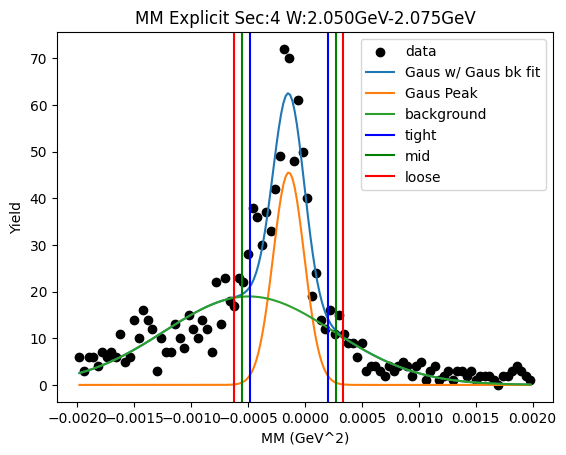

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 5.10743673e+01 -2.09699757e-04  3.11395880e-04]
2nd level W dependent
W1_ini_pars: [ 5.10743673e+01 -2.09699757e-04  3.11395880e-04  1.89594121e+01
 -4.92757567e-04  7.41824160e-04]
Gaus1 Peak: [ 4.67742797e+01 -1.25461685e-04  1.32592625e-04]
Gaus2 Peak: [ 2.20185053e+01 -4.77961751e-04  5.97897604e-04]
tight should be -0.0004569432487947705   0.00020601987792217495
[[-0.00045694  0.          0.        ]
 [ 0.00020602  0.          0.        ]]
mid should be -0.000523239561466465   0.00027231619059386945
[[-0.00045694 -0.00052324  0.        ]
 [ 0.00020602  0.00027232  0.        ]]
loose should be -0.0005895358741381596   0.000338612503265564
[[-0.00045694 -0.00052324 -0.00058954]
 [ 0.00020602  0.00027232  0.00033861]]
-3.70017783738405e-08 6.848304739887356e-08
Main Gaus Peak [ 4.67742797e+01 -1.25461685e-04  1.32592625e-04]
Gaus2 [ 2.20185053e+01 -4.77961751e-04  5.97897604e-04]


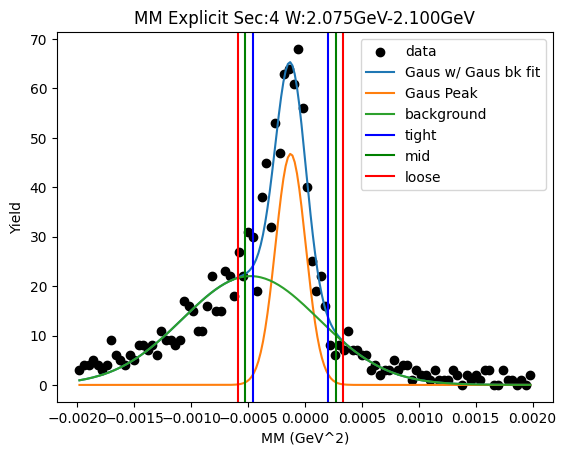

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 5.43493848e+01 -2.05928109e-04  2.94171760e-04]
2nd level W dependent
W1_ini_pars: [ 5.43493848e+01 -2.05928109e-04  2.94171760e-04  2.20185053e+01
 -4.77961751e-04  5.97897604e-04]
Gaus1 Peak: [ 4.93044849e+01 -1.46156653e-04  1.70174070e-04]
Gaus2 Peak: [ 1.64680326e+01 -5.81137330e-04  7.39804707e-04]
tight should be -0.0005715918291926334   0.00027927852312449386
[[-0.00057159  0.          0.        ]
 [ 0.00027928  0.          0.        ]]
mid should be -0.0006566788644243461   0.00036436555835620666
[[-0.00057159 -0.00065668  0.        ]
 [ 0.00027928  0.00036437  0.        ]]
loose should be -0.0007417658996560588   0.00044945259358791936
[[-0.00057159 -0.00065668 -0.00074177]
 [ 0.00027928  0.00036437  0.00044945]]
-6.551587554815123e-08 1.0823941000039412e-07
Main Gaus Peak [ 4.93044849e+01 -1.46156653e-04  1.70174070e-04]
Gaus2 [ 1.64680326e+01 -5.81137330e-04  7.39804707e-04]


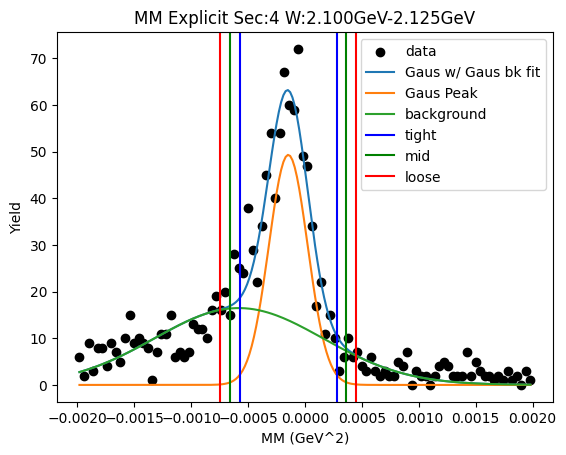

initial bw fit:  [ 1.18048710e+03 -2.24747685e-04  3.69190576e-04]
input parameters for r2 [ 1.18048710e+03 -2.24747685e-04  3.69190576e-04  5.00000000e+02
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 1.06843548e+03 -1.36191297e-04  1.65761583e-04  4.73532425e+02
 -5.44193128e-04  7.82427541e-04]
-6.388263764984082e-08 1.0097877631925066e-07
Main Gaus Peak [ 1.06843548e+03 -1.36191297e-04  1.65761583e-04]
Gaus2 [ 4.73532425e+02 -5.44193128e-04  7.82427541e-04]


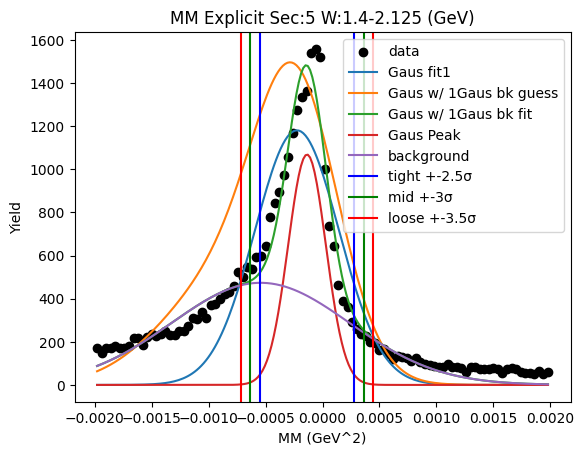

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 3.82845575e+00 -2.73687263e-04  3.78854074e-04]
2nd level W dependent
W1_ini_pars: [ 3.82845575e+00 -2.73687263e-04  3.78854074e-04  3.07211428e+00
 -1.00000000e-02  6.74285300e-02]
Gaus1 Peak: [ 3.52292465e+00 -1.73062720e-04  1.86842259e-04]
Gaus2 Peak: [ 1.43035313e+00 -7.38841678e-04  8.34225150e-04]
tight should be -0.0006401683660631928   0.00029404292664373885
[[-0.00064017  0.          0.        ]
 [ 0.00029404  0.          0.        ]]
mid should be -0.000733589495333886   0.00038746405591443195
[[-0.00064017 -0.00073359  0.        ]
 [ 0.00029404  0.00038746  0.        ]]
loose should be -0.0008270106246045792   0.00048088518518512517
[[-0.00064017 -0.00073359 -0.00082701]
 [ 0.00029404  0.00038746  0.00048089]]
-7.477938377721122e-08 1.3468079368386627e-07
Main Gaus Peak [ 3.52292465e+00 -1.73062720e-04  1.86842259e-04]
Gaus2 [ 1.43035313e+00 -7.38841678e-04  8.34225150e-04]


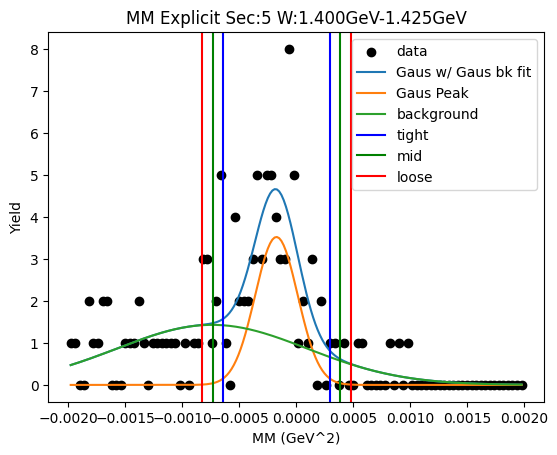

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 5.36658166e+00 -2.69397509e-04  4.90362804e-04]
2nd level W dependent
W1_ini_pars: [ 5.36658166e+00 -2.69397509e-04  4.90362804e-04  1.43035313e+00
 -7.38841678e-04  8.34225150e-04]
Gaus1 Peak: [ 2.68714644e+00 -7.13919409e-05  1.72902358e-04]
Gaus2 Peak: [ 3.94651654e+00 -3.86494025e-04  5.71629091e-04]
tight should be -0.0005036478347963491   0.00036086395291593095
[[-0.00050365  0.          0.        ]
 [ 0.00036086  0.          0.        ]]
mid should be -0.0005900990135675771   0.000447315131687159
[[-0.00050365 -0.0005901   0.        ]
 [ 0.00036086  0.00044732  0.        ]]
loose should be -0.0006765501923388051   0.0005337663104583869
[[-0.00050365 -0.0005901  -0.00067655]
 [ 0.00036086  0.00044732  0.00053377]]
-8.458886650000759e-08 9.478248496242819e-08
Main Gaus Peak [ 2.68714644e+00 -7.13919409e-05  1.72902358e-04]
Gaus2 [ 3.94651654e+00 -3.86494025e-04  5.71629091e-04]


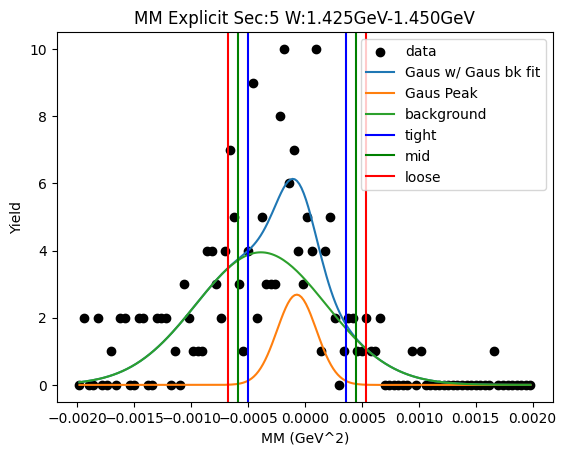

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 9.04269695e+00 -1.88959424e-04  3.71491235e-04]
2nd level W dependent
W1_ini_pars: [ 9.04269695e+00 -1.88959424e-04  3.71491235e-04  3.94651654e+00
 -3.86494025e-04  5.71629091e-04]
Gaus1 Peak: [ 7.85550831e+00 -1.14149457e-04  1.81641674e-04]
Gaus2 Peak: [ 3.61830442e+00 -5.14251535e-04  7.37512102e-04]
tight should be -0.0005682536420005313   0.0003399547286315449
[[-0.00056825  0.          0.        ]
 [ 0.00033995  0.          0.        ]]
mid should be -0.0006590744790637389   0.00043077556569475254
[[-0.00056825 -0.00065907  0.        ]
 [ 0.00033995  0.00043078  0.        ]]
loose should be -0.0007498953161269465   0.0005215964027579602
[[-0.00056825 -0.00065907 -0.0007499 ]
 [ 0.00033995  0.00043078  0.0005216 ]]
-8.59509948769755e-08 1.1201119179970549e-07
Main Gaus Peak [ 7.85550831e+00 -1.14149457e-04  1.81641674e-04]
Gaus2 [ 3.61830442e+00 -5.14251535e-04  7.37512102e-04]


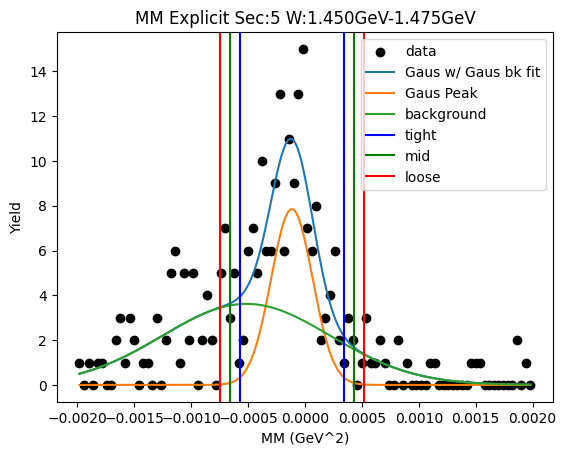

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 1.11025492e+01 -2.58607590e-04  4.21701956e-04]
2nd level W dependent
W1_ini_pars: [ 1.11025492e+01 -2.58607590e-04  4.21701956e-04  3.61830442e+00
 -5.14251535e-04  7.37512102e-04]
Gaus1 Peak: [ 9.99979657e+00 -1.32814626e-04  2.16988867e-04]
Gaus2 Peak: [ 4.78870299e+00 -6.92641849e-04  6.53032390e-04]
tight should be -0.0006752867932775126   0.00040965754194994695
[[-0.00067529  0.          0.        ]
 [ 0.00040966  0.          0.        ]]
mid should be -0.0007837812268002586   0.000518151975472693
[[-0.00067529 -0.00078378  0.        ]
 [ 0.00040966  0.00051815  0.        ]]
loose should be -0.0008922756603230046   0.000626646408995439
[[-0.00067529 -0.00078378 -0.00089228]
 [ 0.00040966  0.00051815  0.00062665]]
-1.2361278047484776e-07 1.5889223005526925e-07
Main Gaus Peak [ 9.99979657e+00 -1.32814626e-04  2.16988867e-04]
Gaus2 [ 4.78870299e+00 -6.92641849e-04  6.53032390e-04]


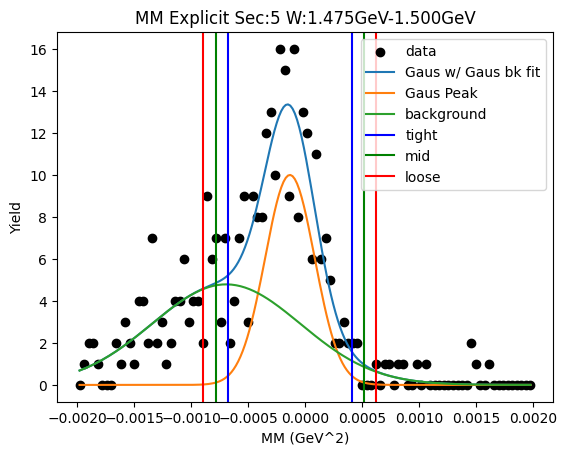

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 1.36382235e+01 -2.77183528e-04  4.29296941e-04]
2nd level W dependent
W1_ini_pars: [ 1.36382235e+01 -2.77183528e-04  4.29296941e-04  4.78870299e+00
 -6.92641849e-04  6.53032390e-04]
Gaus1 Peak: [ 1.14926016e+01 -1.44250944e-04  1.82141138e-04]
Gaus2 Peak: [ 6.63477995e+00 -5.80619368e-04  6.95624617e-04]
tight should be -0.0005996037888314614   0.0003111019013432114
[[-0.0005996  0.         0.       ]
 [ 0.0003111  0.         0.       ]]
mid should be -0.0006906743578489287   0.0004021724703606787
[[-0.0005996  -0.00069067  0.        ]
 [ 0.0003111   0.00040217  0.        ]]
loose should be -0.0007817449268663959   0.0004932430393781459
[[-0.0005996  -0.00069067 -0.00078174]
 [ 0.0003111   0.00040217  0.00049324]]
-7.871784772291254e-08 1.2033451726505397e-07
Main Gaus Peak [ 1.14926016e+01 -1.44250944e-04  1.82141138e-04]
Gaus2 [ 6.63477995e+00 -5.80619368e-04  6.95624617e-04]


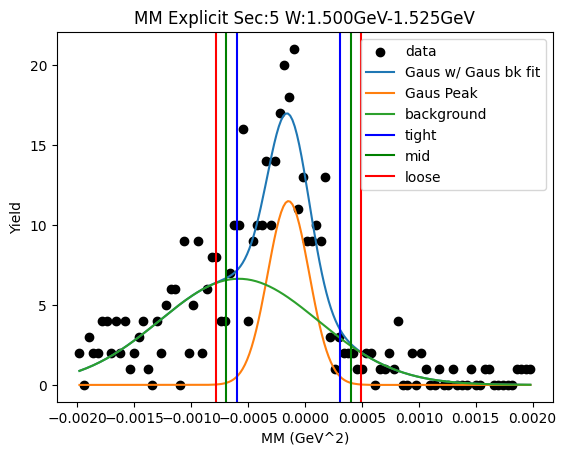

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 1.55191347e+01 -2.26061738e-04  4.09667149e-04]
2nd level W dependent
W1_ini_pars: [ 1.55191347e+01 -2.26061738e-04  4.09667149e-04  6.63477995e+00
 -5.80619368e-04  6.95624617e-04]
Gaus1 Peak: [ 1.41355099e+01 -1.23095727e-04  1.57876056e-04]
Gaus2 Peak: [ 7.25453288e+00 -5.15629386e-04  7.28561146e-04]
tight should be -0.0005177858665547101   0.00027159441227436406
[[-0.00051779  0.          0.        ]
 [ 0.00027159  0.          0.        ]]
mid should be -0.0005967238944376175   0.00035053244015727144
[[-0.00051779 -0.00059672  0.        ]
 [ 0.00027159  0.00035053  0.        ]]
loose should be -0.000675661922320525   0.00042947046804017887
[[-0.00051779 -0.00059672 -0.00067566]
 [ 0.00027159  0.00035053  0.00042947]]
-5.96219889123441e-08 8.992710499267996e-08
Main Gaus Peak [ 1.41355099e+01 -1.23095727e-04  1.57876056e-04]
Gaus2 [ 7.25453288e+00 -5.15629386e-04  7.28561146e-04]


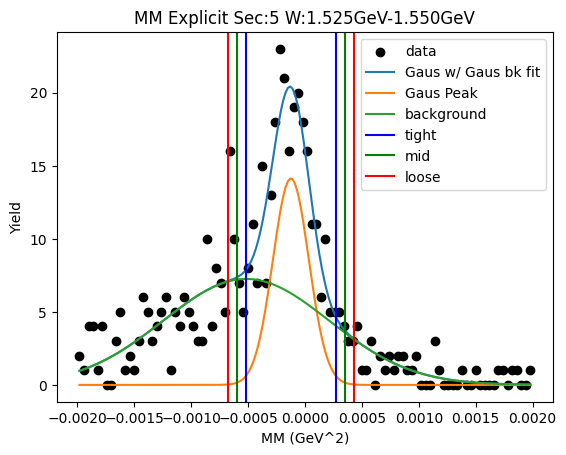

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 1.87722778e+01 -2.56405412e-04  3.79002991e-04]
2nd level W dependent
W1_ini_pars: [ 1.87722778e+01 -2.56405412e-04  3.79002991e-04  7.25453288e+00
 -5.15629386e-04  7.28561146e-04]
Gaus1 Peak: [ 1.44702170e+01 -9.03934504e-05  1.01830268e-04]
Gaus2 Peak: [ 1.29292781e+01 -3.86644934e-04  4.66950788e-04]
tight should be -0.0003449691195746852   0.00016418221885736997
[[-0.00034497  0.          0.        ]
 [ 0.00016418  0.          0.        ]]
mid should be -0.0003958842534178907   0.00021509735270057548
[[-0.00034497 -0.00039588  0.        ]
 [ 0.00016418  0.0002151   0.        ]]
loose should be -0.00044679938726109624   0.000266012486543781
[[-0.00034497 -0.00039588 -0.0004468 ]
 [ 0.00016418  0.0002151   0.00026601]]
-2.2937234383515287e-08 3.927918611900148e-08
Main Gaus Peak [ 1.44702170e+01 -9.03934504e-05  1.01830268e-04]
Gaus2 [ 1.29292781e+01 -3.86644934e-04  4.66950788e-04]


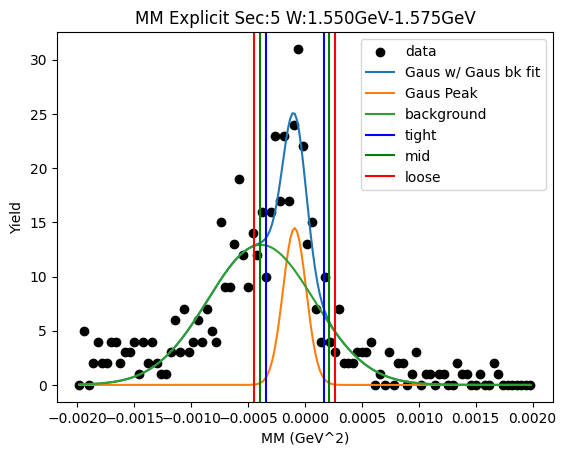

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 1.66686636e+01 -2.57537908e-04  3.90821693e-04]
2nd level W dependent
W1_ini_pars: [ 1.66686636e+01 -2.57537908e-04  3.90821693e-04  1.29292781e+01
 -3.86644934e-04  4.66950788e-04]
Gaus1 Peak: [ 1.47243222e+01 -1.94460941e-04  2.52546712e-04]
Gaus2 Peak: [ 4.68548861e+00 -7.77002823e-04  9.61219256e-04]
tight should be -0.0008258277205125608   0.00043690583875836703
[[-0.00082583  0.          0.        ]
 [ 0.00043691  0.          0.        ]]
mid should be -0.0009521010764396534   0.0005631791946854597
[[-0.00082583 -0.0009521   0.        ]
 [ 0.00043691  0.00056318  0.        ]]
loose should be -0.0010783744323667461   0.0006894525506125525
[[-0.00082583 -0.0009521  -0.00107837]
 [ 0.00043691  0.00056318  0.00068945]]
-1.535244674782773e-07 2.2915458253188882e-07
Main Gaus Peak [ 1.47243222e+01 -1.94460941e-04  2.52546712e-04]
Gaus2 [ 4.68548861e+00 -7.77002823e-04  9.61219256e-04]


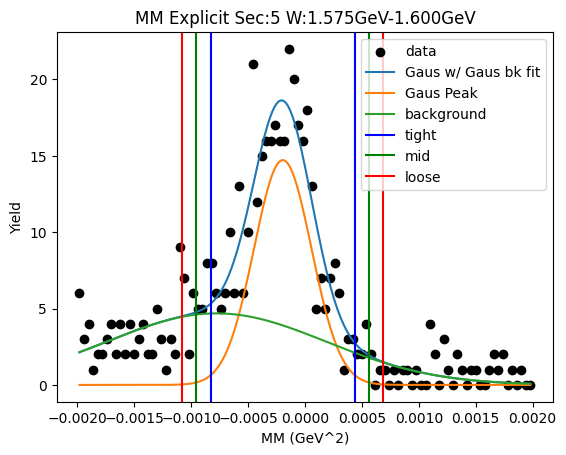

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 1.73870145e+01 -2.35235188e-04  4.35293442e-04]
2nd level W dependent
W1_ini_pars: [ 1.73870145e+01 -2.35235188e-04  4.35293442e-04  4.68548861e+00
 -7.77002823e-04  9.61219256e-04]
Gaus1 Peak: [ 1.35755355e+01 -1.70866640e-04  2.62408415e-04]
Gaus2 Peak: [ 6.17016117e+00 -4.63131092e-04  8.30773673e-04]
tight should be -0.000826887677154263   0.00048515439779269083
[[-0.00082689  0.          0.        ]
 [ 0.00048515  0.          0.        ]]
mid should be -0.0009580918846489585   0.0006163586052873863
[[-0.00082689 -0.00095809  0.        ]
 [ 0.00048515  0.00061636  0.        ]]
loose should be -0.0010892960921436538   0.0007475628127820817
[[-0.00082689 -0.00095809 -0.0010893 ]
 [ 0.00048515  0.00061636  0.00074756]]
-1.7737912021592943e-07 2.3576993732753659e-07
Main Gaus Peak [ 1.35755355e+01 -1.70866640e-04  2.62408415e-04]
Gaus2 [ 6.17016117e+00 -4.63131092e-04  8.30773673e-04]


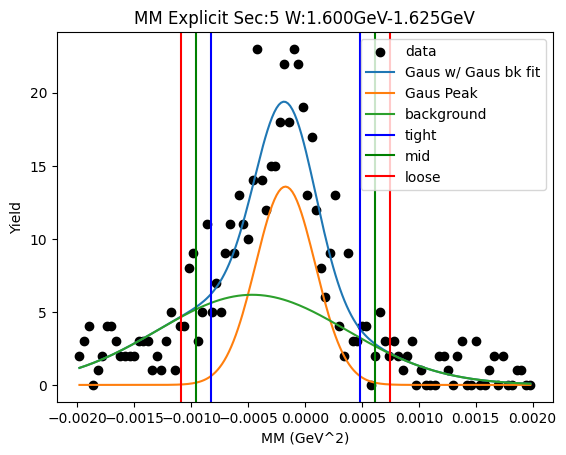

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 2.18807283e+01 -2.67703850e-04  3.51418911e-04]
2nd level W dependent
W1_ini_pars: [ 2.18807283e+01 -2.67703850e-04  3.51418911e-04  6.17016117e+00
 -4.63131092e-04  8.30773673e-04]
Gaus1 Peak: [ 1.87077391e+01 -1.94066392e-04  2.01787659e-04]
Gaus2 Peak: [ 7.51910201e+00 -6.06127626e-04  7.37131518e-04]
tight should be -0.0006985355388376193   0.00031040275391466734
[[-0.00069854  0.          0.        ]
 [ 0.0003104   0.          0.        ]]
mid should be -0.0007994293681128479   0.0004112965831898959
[[-0.00069854 -0.00079943  0.        ]
 [ 0.0003104   0.0004113   0.        ]]
loose should be -0.0009003231973880766   0.0005121904124651246
[[-0.00069854 -0.00079943 -0.00090032]
 [ 0.0003104   0.0004113   0.00051219]]
-8.44930127468162e-08 1.5981654211283947e-07
Main Gaus Peak [ 1.87077391e+01 -1.94066392e-04  2.01787659e-04]
Gaus2 [ 7.51910201e+00 -6.06127626e-04  7.37131518e-04]


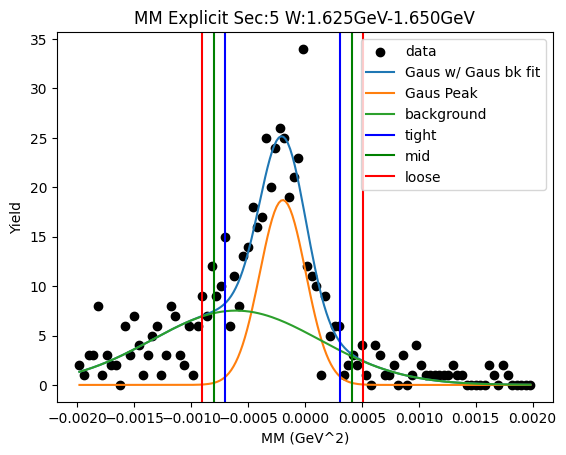

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 2.66841266e+01 -1.87367729e-04  3.06979506e-04]
2nd level W dependent
W1_ini_pars: [ 2.66841266e+01 -1.87367729e-04  3.06979506e-04  7.51910201e+00
 -6.06127626e-04  7.37131518e-04]
Gaus1 Peak: [ 2.43055214e+01 -1.34236493e-04  1.66997397e-04]
Gaus2 Peak: [ 8.67309887e+00 -5.61107528e-04  7.62012860e-04]
tight should be -0.0005517299842923951   0.0002832569991842971
[[-0.00055173  0.          0.        ]
 [ 0.00028326  0.          0.        ]]
mid should be -0.0006352286826400643   0.0003667556975319663
[[-0.00055173 -0.00063523  0.        ]
 [ 0.00028326  0.00036676  0.        ]]
loose should be -0.0007187273809877336   0.0004502543958796356
[[-0.00055173 -0.00063523 -0.00071873]
 [ 0.00028326  0.00036676  0.00045025]]
-6.564495557584746e-08 1.0168382744227395e-07
Main Gaus Peak [ 2.43055214e+01 -1.34236493e-04  1.66997397e-04]
Gaus2 [ 8.67309887e+00 -5.61107528e-04  7.62012860e-04]


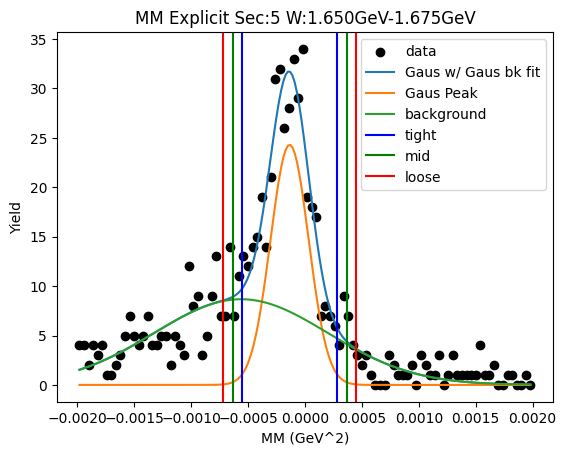

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 2.42763069e+01 -2.79163745e-04  4.47809416e-04]
2nd level W dependent
W1_ini_pars: [ 2.42763069e+01 -2.79163745e-04  4.47809416e-04  8.67309887e+00
 -5.61107528e-04  7.62012860e-04]
Gaus1 Peak: [ 2.83504934e+01 -6.97050655e-05  5.57352758e-05]
Gaus2 Peak: [ 1.79274065e+01 -4.13117187e-04  5.71503907e-04]
tight should be -0.00020904325500158518   6.963312404562944e-05
[[-2.09043255e-04  0.00000000e+00  0.00000000e+00]
 [ 6.96331240e-05  0.00000000e+00  0.00000000e+00]]
mid should be -0.00023691089290630665   9.750076195035092e-05
[[-2.09043255e-04 -2.36910893e-04  0.00000000e+00]
 [ 6.96331240e-05  9.75007620e-05  0.00000000e+00]]
loose should be -0.00026477853081102807   0.00012536839985507236
[[-2.09043255e-04 -2.36910893e-04 -2.64778531e-04]
 [ 6.96331240e-05  9.75007620e-05  1.25368400e-04]]
-4.46046675537484e-09 1.4178059061953204e-08
Main Gaus Peak [ 2.83504934e+01 -6.97050655e-05  5.57352758e-05]
Gaus2 [ 1.79274065e+01 -4.13117187e

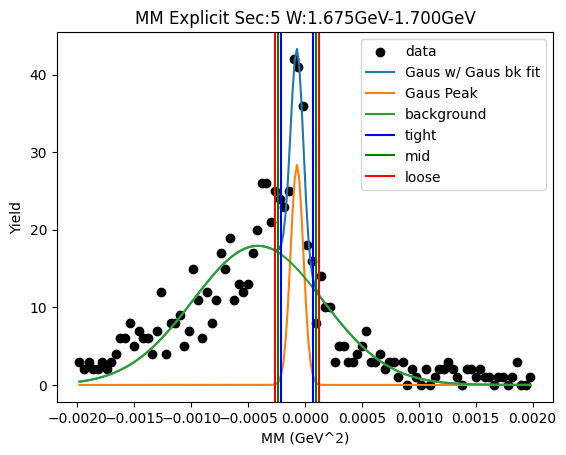

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 3.52183585e+01 -2.08787728e-04  3.29798137e-04]
2nd level W dependent
W1_ini_pars: [ 3.52183585e+01 -2.08787728e-04  3.29798137e-04  1.79274065e+01
 -4.13117187e-04  5.71503907e-04]
Gaus1 Peak: [ 3.19311664e+01 -1.56919085e-04  1.83369899e-04]
Gaus2 Peak: [ 1.10954924e+01 -6.18889311e-04  8.48044825e-04]
tight should be -0.0006153438320098359   0.0003015056612710121
[[-0.00061534  0.          0.        ]
 [ 0.00030151  0.          0.        ]]
mid should be -0.0007070287813379206   0.00039319061059909686
[[-0.00061534 -0.00070703  0.        ]
 [ 0.00030151  0.00039319  0.        ]]
loose should be -0.0007987137306660055   0.0004848755599271817
[[-0.00061534 -0.00070703 -0.00079871]
 [ 0.00030151  0.00039319  0.00048488]]
-7.624995984634894e-08 1.254971585526945e-07
Main Gaus Peak [ 3.19311664e+01 -1.56919085e-04  1.83369899e-04]
Gaus2 [ 1.10954924e+01 -6.18889311e-04  8.48044825e-04]


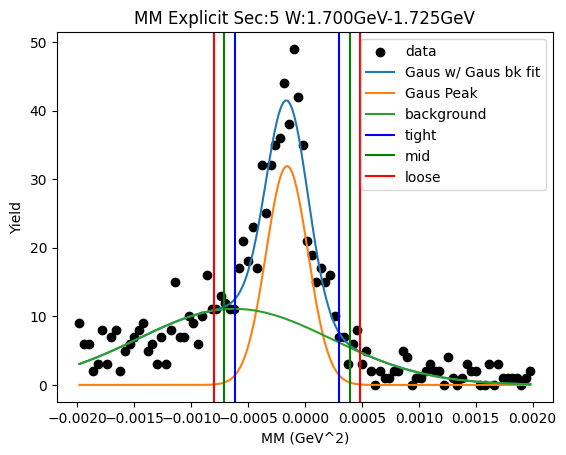

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 3.50914849e+01 -2.01629144e-04  3.52133477e-04]
2nd level W dependent
W1_ini_pars: [ 3.50914849e+01 -2.01629144e-04  3.52133477e-04  1.10954924e+01
 -6.18889311e-04  8.48044825e-04]
Gaus1 Peak: [ 3.65058610e+01 -1.09953212e-04  1.29564375e-04]
Gaus2 Peak: [ 1.49470621e+01 -5.77184808e-04  7.71660357e-04]
tight should be -0.00043386414914111824   0.0002139577258425693
[[-0.00043386  0.          0.        ]
 [ 0.00021396  0.          0.        ]]
mid should be -0.000498646336639487   0.000278739913340938
[[-0.00043386 -0.00049865  0.        ]
 [ 0.00021396  0.00027874  0.        ]]
loose should be -0.0005634285241378558   0.00034352210083930676
[[-0.00043386 -0.00049865 -0.00056343]
 [ 0.00021396  0.00027874  0.00034352]]
-3.82710730528955e-08 6.24504905568758e-08
Main Gaus Peak [ 3.65058610e+01 -1.09953212e-04  1.29564375e-04]
Gaus2 [ 1.49470621e+01 -5.77184808e-04  7.71660357e-04]


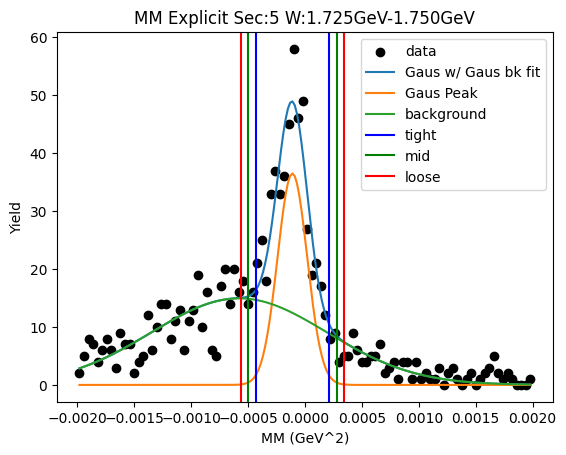

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 3.34541628e+01 -2.20516915e-04  4.08376777e-04]
2nd level W dependent
W1_ini_pars: [ 3.34541628e+01 -2.20516915e-04  4.08376777e-04  1.49470621e+01
 -5.77184808e-04  7.71660357e-04]
Gaus1 Peak: [ 2.81514226e+01 -1.29719475e-04  2.20716182e-04]
Gaus2 Peak: [ 1.25963857e+01 -5.72366430e-04  8.03800987e-04]
tight should be -0.000681509931287575   0.00042207098118320476
[[-0.00068151  0.          0.        ]
 [ 0.00042207  0.          0.        ]]
mid should be -0.0007918680225346529   0.0005324290724302826
[[-0.00068151 -0.00079187  0.        ]
 [ 0.00042207  0.00053243  0.        ]]
loose should be -0.0009022261137817309   0.0006427871636773606
[[-0.00068151 -0.00079187 -0.00090223]
 [ 0.00042207  0.00053243  0.00064279]]
-1.2931975743656614e-07 1.6297404185219511e-07
Main Gaus Peak [ 2.81514226e+01 -1.29719475e-04  2.20716182e-04]
Gaus2 [ 1.25963857e+01 -5.72366430e-04  8.03800987e-04]


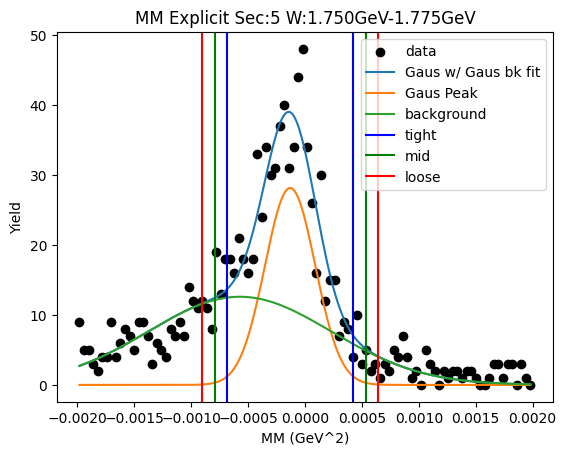

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 3.02414321e+01 -2.16249862e-04  4.14223621e-04]
2nd level W dependent
W1_ini_pars: [ 3.02414321e+01 -2.16249862e-04  4.14223621e-04  1.25963857e+01
 -5.72366430e-04  8.03800987e-04]
Gaus1 Peak: [ 2.56957614e+01 -1.51229255e-04  2.27588570e-04]
Gaus2 Peak: [ 1.03026694e+01 -5.18177365e-04  9.39159700e-04]
tight should be -0.0007202006814525473   0.0004177421709150106
[[-0.0007202   0.          0.        ]
 [ 0.00041774  0.          0.        ]]
mid should be -0.0008339949666893032   0.0005315364561517664
[[-0.0007202  -0.00083399  0.        ]
 [ 0.00041774  0.00053154  0.        ]]
loose should be -0.0009477892519260589   0.0006453307413885221
[[-0.0007202  -0.00083399 -0.00094779]
 [ 0.00041774  0.00053154  0.00064533]]
-1.3251938458138334e-07 1.7825995987967595e-07
Main Gaus Peak [ 2.56957614e+01 -1.51229255e-04  2.27588570e-04]
Gaus2 [ 1.03026694e+01 -5.18177365e-04  9.39159700e-04]


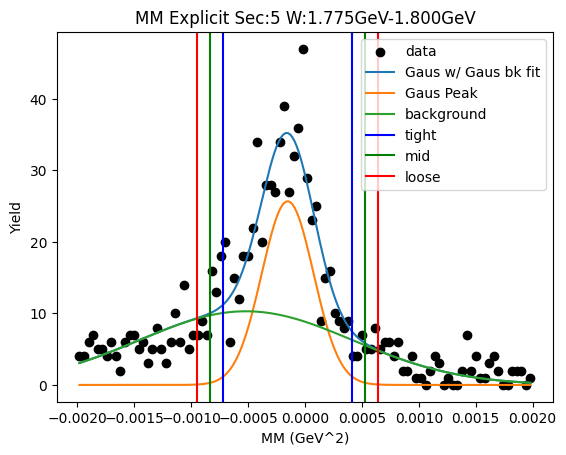

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 3.04450611e+01 -2.07108401e-04  3.97812655e-04]
2nd level W dependent
W1_ini_pars: [ 3.04450611e+01 -2.07108401e-04  3.97812655e-04  1.03026694e+01
 -5.18177365e-04  9.39159700e-04]
Gaus1 Peak: [ 2.70641146e+01 -1.24610441e-04  1.69375880e-04]
Gaus2 Peak: [ 1.29105184e+01 -4.87128193e-04  7.86488247e-04]
tight should be -0.0005480501409193535   0.0002988292599169915
[[-0.00054805  0.          0.        ]
 [ 0.00029883  0.          0.        ]]
mid should be -0.000632738081002988   0.00038351720000062597
[[-0.00054805 -0.00063274  0.        ]
 [ 0.00029883  0.00038352  0.        ]]
loose should be -0.0007174260210866225   0.00046820514008426046
[[-0.00054805 -0.00063274 -0.00071743]
 [ 0.00029883  0.00038352  0.00046821]]
-7.053680446541284e-08 1.0159232822920958e-07
Main Gaus Peak [ 2.70641146e+01 -1.24610441e-04  1.69375880e-04]
Gaus2 [ 1.29105184e+01 -4.87128193e-04  7.86488247e-04]


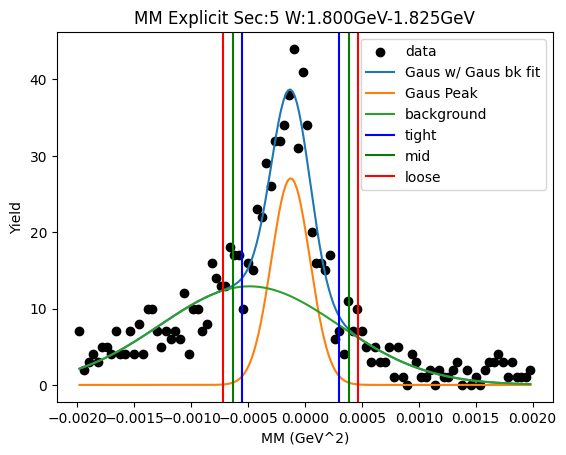

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 3.10119651e+01 -2.25967342e-04  3.69331895e-04]
2nd level W dependent
W1_ini_pars: [ 3.10119651e+01 -2.25967342e-04  3.69331895e-04  1.29105184e+01
 -4.87128193e-04  7.86488247e-04]
Gaus1 Peak: [ 2.77799793e+01 -1.61397552e-04  1.88726869e-04]
Gaus2 Peak: [ 1.06576374e+01 -5.53199153e-04  8.81287684e-04]
tight should be -0.0006332147240120875   0.00031041962007555734
[[-0.00063321  0.          0.        ]
 [ 0.00031042  0.          0.        ]]
mid should be -0.0007275781584208521   0.0004047830544843218
[[-0.00063321 -0.00072758  0.        ]
 [ 0.00031042  0.00040478  0.        ]]
loose should be -0.0008219415928296165   0.0004991464888930863
[[-0.00063321 -0.00072758 -0.00082194]
 [ 0.00031042  0.00040478  0.00049915]]
-8.080432325965755e-08 1.329026628223552e-07
Main Gaus Peak [ 2.77799793e+01 -1.61397552e-04  1.88726869e-04]
Gaus2 [ 1.06576374e+01 -5.53199153e-04  8.81287684e-04]


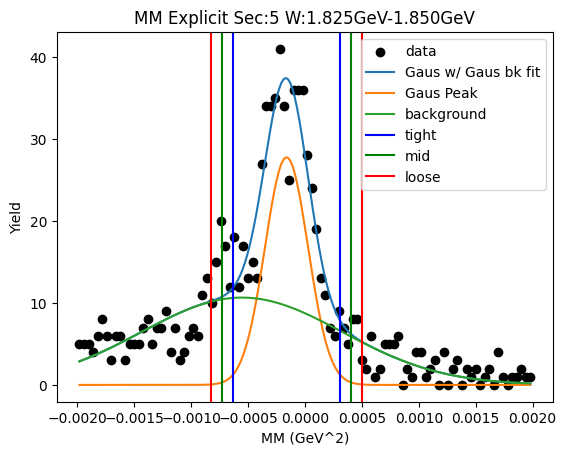

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 2.99061848e+01 -2.22029508e-04  4.00530374e-04]
2nd level W dependent
W1_ini_pars: [ 2.99061848e+01 -2.22029508e-04  4.00530374e-04  1.06576374e+01
 -5.53199153e-04  8.81287684e-04]
Gaus1 Peak: [ 2.60033428e+01 -1.42135927e-04  1.95524368e-04]
Gaus2 Peak: [ 1.15340142e+01 -5.28792391e-04  8.50090860e-04]
tight should be -0.0006309468481202167   0.00034667499368440944
[[-0.00063095  0.          0.        ]
 [ 0.00034667  0.          0.        ]]
mid should be -0.0007287090323006793   0.00044443717786487203
[[-0.00063095 -0.00072871  0.        ]
 [ 0.00034667  0.00044444  0.        ]]
loose should be -0.0008264712164811419   0.0005421993620453346
[[-0.00063095 -0.00072871 -0.00082647]
 [ 0.00034667  0.00044444  0.0005422 ]]
-9.448671406272312e-08 1.3489195767490952e-07
Main Gaus Peak [ 2.60033428e+01 -1.42135927e-04  1.95524368e-04]
Gaus2 [ 1.15340142e+01 -5.28792391e-04  8.50090860e-04]


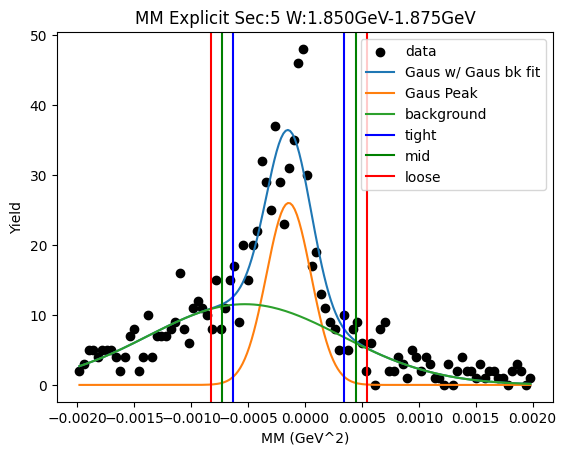

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 3.31401241e+01 -2.07155577e-04  3.35317404e-04]
2nd level W dependent
W1_ini_pars: [ 3.31401241e+01 -2.07155577e-04  3.35317404e-04  1.15340142e+01
 -5.28792391e-04  8.50090860e-04]
Gaus1 Peak: [ 2.91019687e+01 -1.36876559e-04  1.92181055e-04]
Gaus2 Peak: [ 1.07548590e+01 -5.84628398e-04  8.01405205e-04]
tight should be -0.000617329195851276   0.0003435760775054726
[[-0.00061733  0.          0.        ]
 [ 0.00034358  0.          0.        ]]
mid should be -0.0007134197231869507   0.0004396666048411474
[[-0.00061733 -0.00071342  0.        ]
 [ 0.00034358  0.00043967  0.        ]]
loose should be -0.0008095102505226257   0.0005357571321768222
[[-0.00061733 -0.00071342 -0.00080951]
 [ 0.00034358  0.00043967  0.00053576]]
-9.206548087276405e-08 1.2953586577478976e-07
Main Gaus Peak [ 2.91019687e+01 -1.36876559e-04  1.92181055e-04]
Gaus2 [ 1.07548590e+01 -5.84628398e-04  8.01405205e-04]


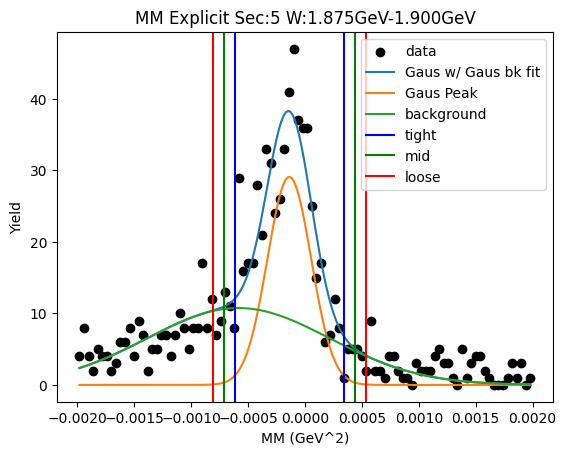

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 3.04139529e+01 -2.21631516e-04  3.84574886e-04]
2nd level W dependent
W1_ini_pars: [ 3.04139529e+01 -2.21631516e-04  3.84574886e-04  1.07548590e+01
 -5.84628398e-04  8.01405205e-04]
Gaus1 Peak: [ 2.70744345e+01 -1.53028440e-04  2.00179586e-04]
Gaus2 Peak: [ 1.08559048e+01 -6.11137628e-04  8.58251737e-04]
tight should be -0.0006534774051361379   0.00034742052600942957
[[-0.00065348  0.          0.        ]
 [ 0.00034742  0.          0.        ]]
mid should be -0.0007535671982506947   0.0004475103191239864
[[-0.00065348 -0.00075357  0.        ]
 [ 0.00034742  0.00044751  0.        ]]
loose should be -0.0008536569913652516   0.0005476001122385432
[[-0.00065348 -0.00075357 -0.00085366]
 [ 0.00034742  0.00044751  0.0005476 ]]
-9.679789691338215e-08 1.4363330354377245e-07
Main Gaus Peak [ 2.70744345e+01 -1.53028440e-04  2.00179586e-04]
Gaus2 [ 1.08559048e+01 -6.11137628e-04  8.58251737e-04]


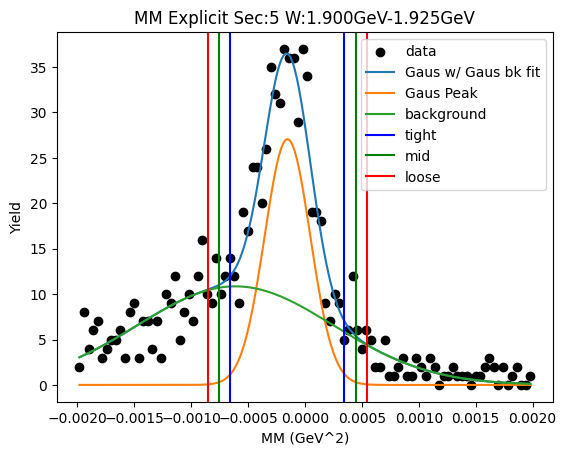

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 3.12936588e+01 -1.84424912e-04  3.55020844e-04]
2nd level W dependent
W1_ini_pars: [ 3.12936588e+01 -1.84424912e-04  3.55020844e-04  1.08559048e+01
 -6.11137628e-04  8.58251737e-04]
Gaus1 Peak: [ 2.90327225e+01 -8.88049954e-05  1.41494158e-04]
Gaus2 Peak: [ 1.34006604e+01 -4.88821625e-04  7.44837513e-04]
tight should be -0.00044254039041129303   0.0002649303996079709
[[-0.00044254  0.          0.        ]
 [ 0.00026493  0.          0.        ]]
mid should be -0.0005132874694132194   0.00033567747860989737
[[-0.00044254 -0.00051329  0.        ]
 [ 0.00026493  0.00033568  0.        ]]
loose should be -0.0005840345484151457   0.0004064245576118237
[[-0.00044254 -0.00051329 -0.00058403]
 [ 0.00026493  0.00033568  0.00040642]]
-5.217546303936875e-08 6.794811745594682e-08
Main Gaus Peak [ 2.90327225e+01 -8.88049954e-05  1.41494158e-04]
Gaus2 [ 1.34006604e+01 -4.88821625e-04  7.44837513e-04]


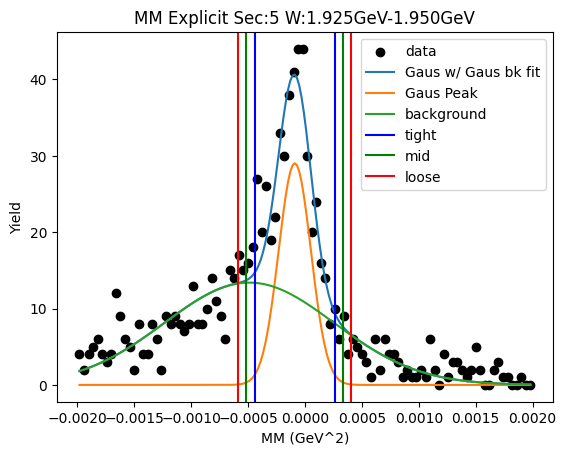

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 3.52380984e+01 -2.02304866e-04  3.05083524e-04]
2nd level W dependent
W1_ini_pars: [ 3.52380984e+01 -2.02304866e-04  3.05083524e-04  1.34006604e+01
 -4.88821625e-04  7.44837513e-04]
Gaus1 Peak: [ 3.15342924e+01 -1.57568967e-04  1.72768507e-04]
Gaus2 Peak: [ 1.08150539e+01 -5.31245460e-04  8.24198527e-04]
tight should be -0.0005894902335836488   0.00027435229945820975
[[-0.00058949  0.          0.        ]
 [ 0.00027435  0.          0.        ]]
mid should be -0.0006758744868878347   0.00036073655276239565
[[-0.00058949 -0.00067587  0.        ]
 [ 0.00027435  0.00036074  0.        ]]
loose should be -0.0007622587401920206   0.00044712080606658144
[[-0.00058949 -0.00067587 -0.00076226]
 [ 0.00027435  0.00036074  0.00044712]]
-6.471889124584855e-08 1.1437485000827334e-07
Main Gaus Peak [ 3.15342924e+01 -1.57568967e-04  1.72768507e-04]
Gaus2 [ 1.08150539e+01 -5.31245460e-04  8.24198527e-04]


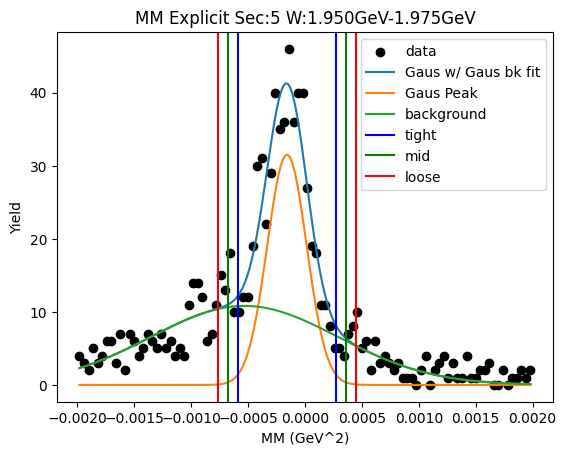

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 2.78247337e+01 -2.33885972e-04  3.84195691e-04]
2nd level W dependent
W1_ini_pars: [ 2.78247337e+01 -2.33885972e-04  3.84195691e-04  1.08150539e+01
 -5.31245460e-04  8.24198527e-04]
Gaus1 Peak: [ 2.45539205e+01 -1.51812885e-04  1.83411773e-04]
Gaus2 Peak: [ 1.09864558e+01 -5.55889953e-04  7.87402394e-04]
tight should be -0.0006103423186663448   0.0003067165480781513
[[-0.00061034  0.          0.        ]
 [ 0.00030672  0.          0.        ]]
mid should be -0.0007020482053407943   0.0003984224347526009
[[-0.00061034 -0.00070205  0.        ]
 [ 0.00030672  0.00039842  0.        ]]
loose should be -0.000793754092015244   0.0004901283214270504
[[-0.00061034 -0.00070205 -0.00079375]
 [ 0.00030672  0.00039842  0.00049013]]
-7.787248366764536e-08 1.2396678795028251e-07
Main Gaus Peak [ 2.45539205e+01 -1.51812885e-04  1.83411773e-04]
Gaus2 [ 1.09864558e+01 -5.55889953e-04  7.87402394e-04]


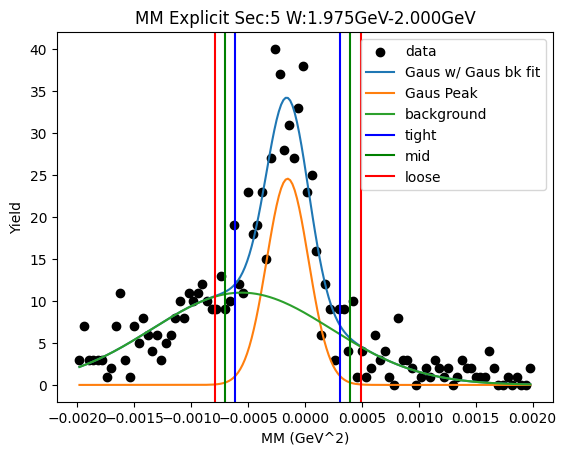

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 2.76948151e+01 -2.18102788e-04  3.79567607e-04]
2nd level W dependent
W1_ini_pars: [ 2.76948151e+01 -2.18102788e-04  3.79567607e-04  1.09864558e+01
 -5.55889953e-04  7.87402394e-04]
Gaus1 Peak: [ 2.51296415e+01 -1.04312082e-04  1.34491909e-04]
Gaus2 Peak: [ 1.38542254e+01 -4.56428632e-04  6.46823956e-04]
tight should be -0.00044054185420315127   0.00023191768946445913
[[-0.00044054  0.          0.        ]
 [ 0.00023192  0.          0.        ]]
mid should be -0.0005077878085699124   0.0002991636438312202
[[-0.00044054 -0.00050779  0.        ]
 [ 0.00023192  0.00029916  0.        ]]
loose should be -0.0005750337629366734   0.0003664095981979812
[[-0.00044054 -0.00050779 -0.00057503]
 [ 0.00023192  0.00029916  0.00036641]]
-4.338321001612887e-08 6.514523107258736e-08
Main Gaus Peak [ 2.51296415e+01 -1.04312082e-04  1.34491909e-04]
Gaus2 [ 1.38542254e+01 -4.56428632e-04  6.46823956e-04]


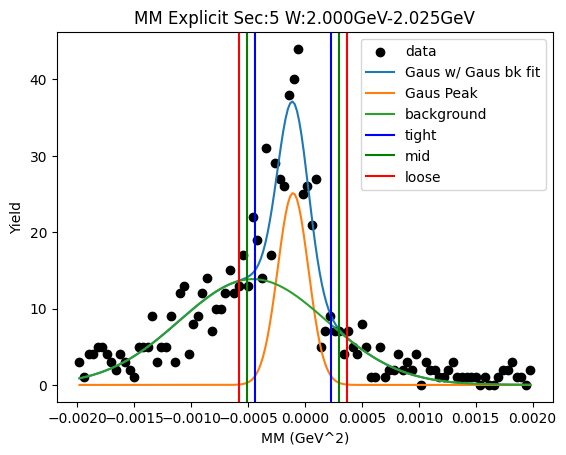

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 2.61246973e+01 -2.39230935e-04  3.81740732e-04]
2nd level W dependent
W1_ini_pars: [ 2.61246973e+01 -2.39230935e-04  3.81740732e-04  1.38542254e+01
 -4.56428632e-04  6.46823956e-04]
Gaus1 Peak: [ 2.26748668e+01 -1.65403193e-04  1.83718744e-04]
Gaus2 Peak: [ 9.78502112e+00 -4.98431769e-04  8.64915883e-04]
tight should be -0.0006247000519040897   0.00029389366621869294
[[-0.0006247   0.          0.        ]
 [ 0.00029389  0.          0.        ]]
mid should be -0.000716559423716368   0.00038575303803097124
[[-0.0006247  -0.00071656  0.        ]
 [ 0.00029389  0.00038575  0.        ]]
loose should be -0.0008084187955286462   0.0004776124098432495
[[-0.0006247  -0.00071656 -0.00080842]
 [ 0.00029389  0.00038575  0.00047761]]
-7.389951407439774e-08 1.2861594647951544e-07
Main Gaus Peak [ 2.26748668e+01 -1.65403193e-04  1.83718744e-04]
Gaus2 [ 9.78502112e+00 -4.98431769e-04  8.64915883e-04]


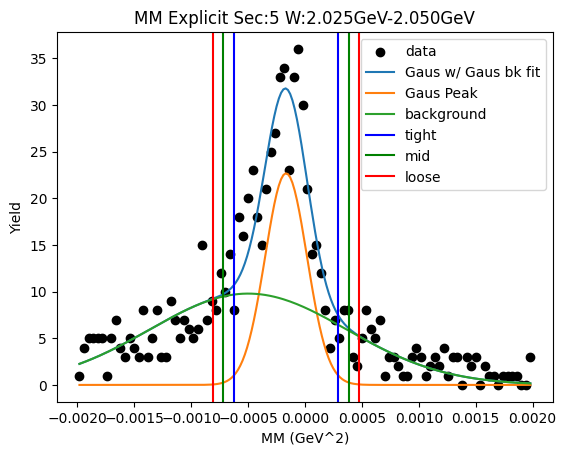

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 2.43722838e+01 -2.09424190e-04  3.92287684e-04]
2nd level W dependent
W1_ini_pars: [ 2.43722838e+01 -2.09424190e-04  3.92287684e-04  9.78502112e+00
 -4.98431769e-04  8.64915883e-04]
Gaus1 Peak: [ 2.48274948e+01 -1.19423181e-04  1.34886106e-04]
Gaus2 Peak: [ 1.08931899e+01 -4.85784429e-04  7.79409854e-04]
tight should be -0.0004566384469209802   0.00021779208495000104
[[-0.00045664  0.          0.        ]
 [ 0.00021779  0.          0.        ]]
mid should be -0.0005240815001080783   0.0002852351381370992
[[-0.00045664 -0.00052408  0.        ]
 [ 0.00021779  0.00028524  0.        ]]
loose should be -0.0005915245532951766   0.00035267819132419736
[[-0.00045664 -0.00052408 -0.00059152]
 [ 0.00021779  0.00028524  0.00035268]]
-4.0320888921679974e-08 6.884468123506596e-08
Main Gaus Peak [ 2.48274948e+01 -1.19423181e-04  1.34886106e-04]
Gaus2 [ 1.08931899e+01 -4.85784429e-04  7.79409854e-04]


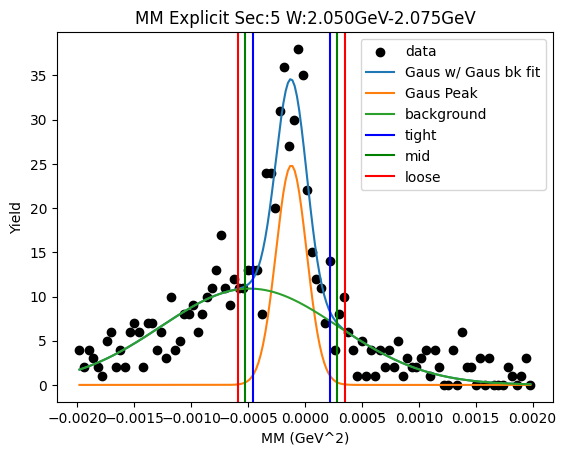

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 2.95902567e+01 -2.12795939e-04  3.09870900e-04]
2nd level W dependent
W1_ini_pars: [ 2.95902567e+01 -2.12795939e-04  3.09870900e-04  1.08931899e+01
 -4.85784429e-04  7.79409854e-04]
Gaus1 Peak: [ 2.66888127e+01 -1.61918616e-04  1.67206723e-04]
Gaus2 Peak: [ 9.89055482e+00 -5.68908850e-04  7.84381079e-04]
tight should be -0.0005799354228664591   0.00025609819050926034
[[-0.00057994  0.          0.        ]
 [ 0.0002561   0.          0.        ]]
mid should be -0.000663538784204031   0.0003397015518468322
[[-0.00057994 -0.00066354  0.        ]
 [ 0.0002561   0.0003397   0.        ]]
loose should be -0.000747142145541603   0.0004233049131844042
[[-0.00057994 -0.00066354 -0.00074714]
 [ 0.0002561   0.0003397   0.0004233 ]]
-5.765662605809484e-08 1.1009190258848002e-07
Main Gaus Peak [ 2.66888127e+01 -1.61918616e-04  1.67206723e-04]
Gaus2 [ 9.89055482e+00 -5.68908850e-04  7.84381079e-04]


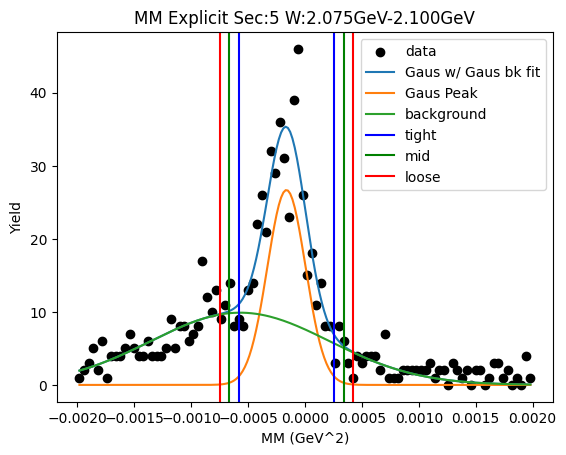

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 2.67954558e+01 -2.24105847e-04  3.53649929e-04]
2nd level W dependent
W1_ini_pars: [ 2.67954558e+01 -2.24105847e-04  3.53649929e-04  9.89055482e+00
 -5.68908850e-04  7.84381079e-04]
Gaus1 Peak: [ 2.35139262e+01 -1.75239884e-04  2.18803996e-04]
Gaus2 Peak: [ 7.65384111e+00 -6.43368844e-04  9.77720965e-04]
tight should be -0.0007222498750615397   0.0003717701064980245
[[-0.00072225  0.          0.        ]
 [ 0.00037177  0.          0.        ]]
mid should be -0.0008316518732174961   0.0004811721046539809
[[-0.00072225 -0.00083165  0.        ]
 [ 0.00037177  0.00048117  0.        ]]
loose should be -0.0009410538713734525   0.0005905741028099373
[[-0.00072225 -0.00083165 -0.00094105]
 [ 0.00037177  0.00048117  0.00059057]]
-1.1291654936310689e-07 1.7433458344927448e-07
Main Gaus Peak [ 2.35139262e+01 -1.75239884e-04  2.18803996e-04]
Gaus2 [ 7.65384111e+00 -6.43368844e-04  9.77720965e-04]


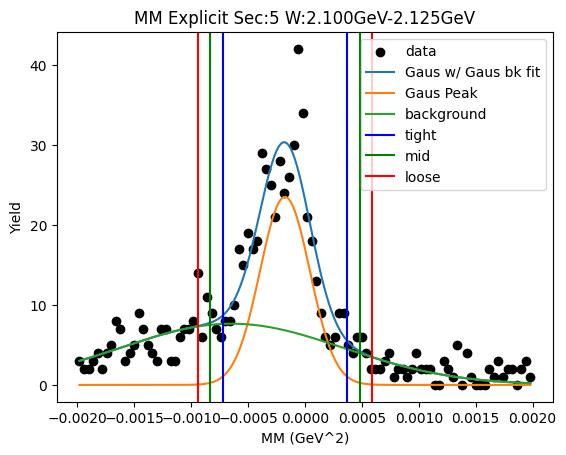

initial bw fit:  [ 1.74153934e+03 -2.05190678e-04  3.26112798e-04]
input parameters for r2 [ 1.74153934e+03 -2.05190678e-04  3.26112798e-04  5.00000000e+02
 -8.08201518e-04  5.76255640e-04]
r2 parameters [ 1.55104251e+03 -1.24164550e-04  1.49822712e-04  6.92626851e+02
 -4.83696572e-04  6.87611474e-04]
-5.192369952252806e-08 8.27573702932656e-08
Main Gaus Peak [ 1.55104251e+03 -1.24164550e-04  1.49822712e-04]
Gaus2 [ 6.92626851e+02 -4.83696572e-04  6.87611474e-04]


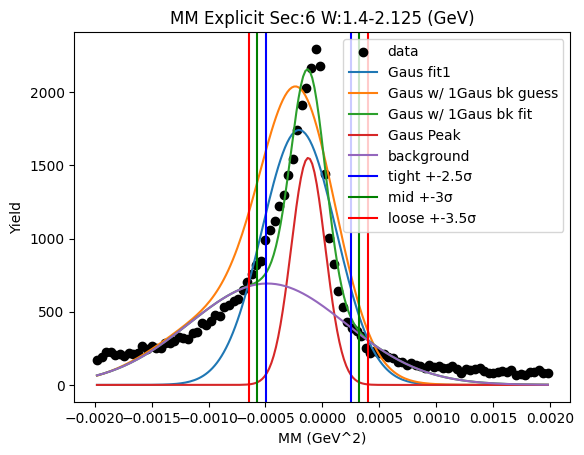

W bin: 0 1.400GeV-1.425GeV
initial Gaus fit:  [ 8.93378407e+00 -1.46900218e-04  2.15762421e-04]
2nd level W dependent
W1_ini_pars: [ 8.93378407e+00 -1.46900218e-04  2.15762421e-04  3.07211428e+00
 -1.00000000e-02  6.74285300e-02]
Gaus1 Peak: [ 1.22458209e+01 -2.67379848e-05  2.31531061e-05]
Gaus2 Peak: [ 6.91252724e+00 -2.10928311e-04  2.53322061e-04]
tight should be -8.462075006358569e-05   3.114478047932275e-05
[[-8.46207501e-05  0.00000000e+00  0.00000000e+00]
 [ 3.11447805e-05  0.00000000e+00  0.00000000e+00]]
mid should be -9.619730311787654e-05   4.272133353361359e-05
[[-8.46207501e-05 -9.61973031e-05  0.00000000e+00]
 [ 3.11447805e-05  4.27213335e-05  0.00000000e+00]]
loose should be -0.0001077738561721674   5.429788658790444e-05
[[-8.46207501e-05 -9.61973031e-05 -1.07773856e-04]
 [ 3.11447805e-05  4.27213335e-05  5.42978866e-05]]
-8.932791366814743e-10 2.323118798169982e-09
Main Gaus Peak [ 1.22458209e+01 -2.67379848e-05  2.31531061e-05]
Gaus2 [ 6.91252724e+00 -2.10928311e-04  

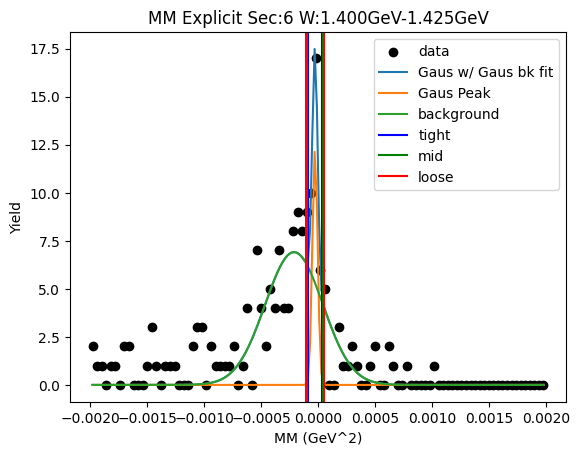

W bin: 1 1.425GeV-1.450GeV
initial Gaus fit:  [ 1.10097528e+01 -1.92526248e-04  3.02804588e-04]
2nd level W dependent
W1_ini_pars: [ 1.10097528e+01 -1.92526248e-04  3.02804588e-04  6.91252724e+00
 -2.10928311e-04  2.53322061e-04]
Gaus1 Peak: [ 1.02546687e+01 -1.10278971e-04  1.54283897e-04]
Gaus2 Peak: [ 4.39776103e+00 -5.51182128e-04  5.44258704e-04]
tight should be -0.0004959887130209516   0.00027543077043450516
[[-0.00049599  0.          0.        ]
 [ 0.00027543  0.          0.        ]]
mid should be -0.0005731306613664973   0.0003525727187800508
[[-0.00049599 -0.00057313  0.        ]
 [ 0.00027543  0.00035257  0.        ]]
loose should be -0.0006502726097120429   0.0004297146671255964
[[-0.00049599 -0.00057313 -0.00065027]
 [ 0.00027543  0.00035257  0.00042971]]
-5.848508726303414e-07 1.1924543486714121e-06
Main Gaus Peak [ 1.02546687e+01 -1.10278971e-04  1.54283897e-04]
Gaus2 [ 4.39776103e+00 -5.51182128e-04  5.44258704e-04]


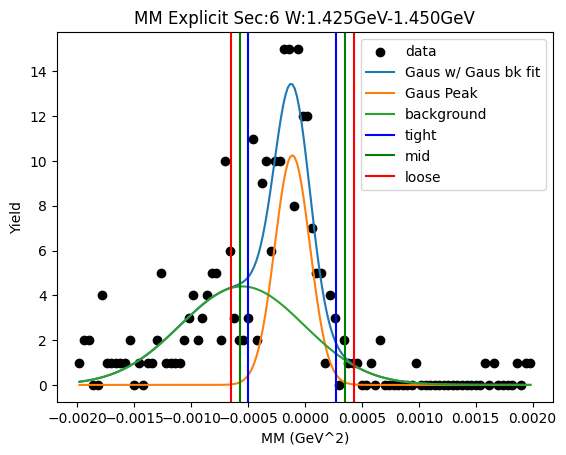

W bin: 2 1.450GeV-1.475GeV
initial Gaus fit:  [ 1.49754895e+01 -2.32094882e-04  3.15122505e-04]
2nd level W dependent
W1_ini_pars: [ 1.49754895e+01 -2.32094882e-04  3.15122505e-04  4.39776103e+00
 -5.51182128e-04  5.44258704e-04]
Gaus1 Peak: [ 1.33326767e+01 -1.65606750e-04  2.20007141e-04]
Gaus2 Peak: [ 4.21142455e+00 -6.88686280e-04  6.22801094e-04]
tight should be -0.0007156246024446848   0.00038441110296326495
[[-0.00071562  0.          0.        ]
 [ 0.00038441  0.          0.        ]]
mid should be -0.0008256281729854799   0.00049441467350406
[[-0.00071562 -0.00082563  0.        ]
 [ 0.00038441  0.00049441  0.        ]]
loose should be -0.0009356317435262749   0.000604418244044855
[[-0.00071562 -0.00082563 -0.00093563]
 [ 0.00038441  0.00049441  0.00060442]]
-1.177838308210018e-07 1.7263502194036606e-07
Main Gaus Peak [ 1.33326767e+01 -1.65606750e-04  2.20007141e-04]
Gaus2 [ 4.21142455e+00 -6.88686280e-04  6.22801094e-04]


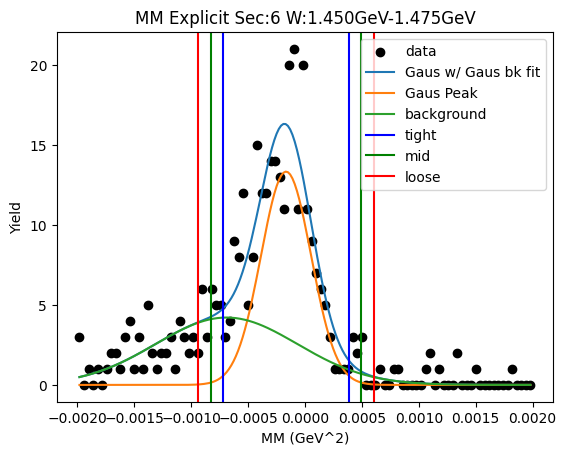

W bin: 3 1.475GeV-1.500GeV
initial Gaus fit:  [ 1.69503256e+01 -2.32851798e-04  2.81401720e-04]
2nd level W dependent
W1_ini_pars: [ 1.69503256e+01 -2.32851798e-04  2.81401720e-04  4.21142455e+00
 -6.88686280e-04  6.22801094e-04]
Gaus1 Peak: [ 1.58505479e+01 -1.97253322e-04  2.26711645e-04]
Gaus2 Peak: [ 3.29210215e+00 -1.05028314e-03  8.56943298e-04]
tight should be -0.0007640324342030521   0.00036952578926821654
[[-0.00076403  0.          0.        ]
 [ 0.00036953  0.          0.        ]]
mid should be -0.0008773882565501789   0.00048288161161534333
[[-0.00076403 -0.00087739  0.        ]
 [ 0.00036953  0.00048288  0.        ]]
loose should be -0.0009907440788973058   0.0005962374339624701
[[-0.00076403 -0.00087739 -0.00099074]
 [ 0.00036953  0.00048288  0.00059624]]
-1.1528563629548549e-07 1.931033827443557e-07
Main Gaus Peak [ 1.58505479e+01 -1.97253322e-04  2.26711645e-04]
Gaus2 [ 3.29210215e+00 -1.05028314e-03  8.56943298e-04]


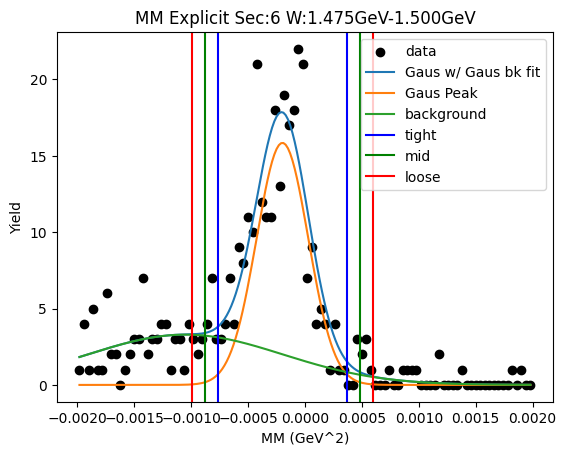

W bin: 4 1.500GeV-1.525GeV
initial Gaus fit:  [ 2.45947112e+01 -1.99483137e-04  2.84205553e-04]
2nd level W dependent
W1_ini_pars: [ 2.45947112e+01 -1.99483137e-04  2.84205553e-04  3.29210215e+00
 -1.05028314e-03  8.56943298e-04]
Gaus1 Peak: [ 2.12278145e+01 -1.41009646e-04  1.68665840e-04]
Gaus2 Peak: [ 8.25471649e+00 -5.02267193e-04  5.83920701e-04]
tight should be -0.0005626742465926473   0.000280654955222792
[[-0.00056267  0.          0.        ]
 [ 0.00028065  0.          0.        ]]
mid should be -0.0006470071667741913   0.000364987875404336
[[-0.00056267 -0.00064701  0.        ]
 [ 0.00028065  0.00036499  0.        ]]
loose should be -0.0007313400869557352   0.0004493207955858799
[[-0.00056267 -0.00064701 -0.00073134]
 [ 0.00028065  0.00036499  0.00044932]]
-6.546077693997108e-08 1.0522821729234878e-07
Main Gaus Peak [ 2.12278145e+01 -1.41009646e-04  1.68665840e-04]
Gaus2 [ 8.25471649e+00 -5.02267193e-04  5.83920701e-04]


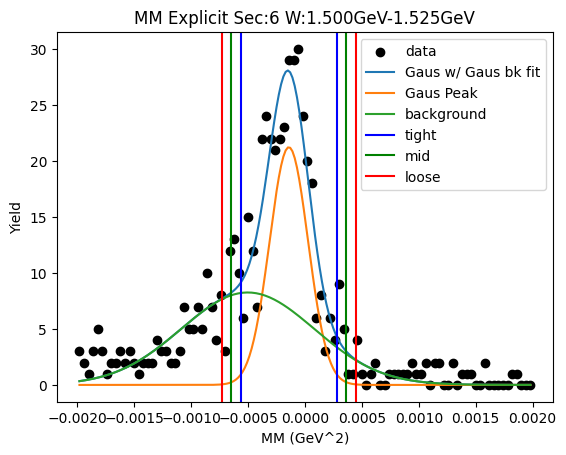

W bin: 5 1.525GeV-1.550GeV
initial Gaus fit:  [ 2.31296361e+01 -2.19626468e-04  3.15838952e-04]
2nd level W dependent
W1_ini_pars: [ 2.31296361e+01 -2.19626468e-04  3.15838952e-04  8.25471649e+00
 -5.02267193e-04  5.83920701e-04]
Gaus1 Peak: [ 2.18913927e+01 -1.43047541e-04  1.41822257e-04]
Gaus2 Peak: [ 9.16943143e+00 -5.60293263e-04  6.52676567e-04]
tight should be -0.0004976031843611747   0.00021150810311615167
[[-0.0004976   0.          0.        ]
 [ 0.00021151  0.          0.        ]]
mid should be -0.0005685143131089073   0.00028241923186388433
[[-0.0004976  -0.00056851  0.        ]
 [ 0.00021151  0.00028242  0.        ]]
loose should be -0.0006394254418566399   0.00035333036061161696
[[-0.0004976  -0.00056851 -0.00063943]
 [ 0.00021151  0.00028242  0.00035333]]
-3.987805928518108e-08 8.080325704147925e-08
Main Gaus Peak [ 2.18913927e+01 -1.43047541e-04  1.41822257e-04]
Gaus2 [ 9.16943143e+00 -5.60293263e-04  6.52676567e-04]


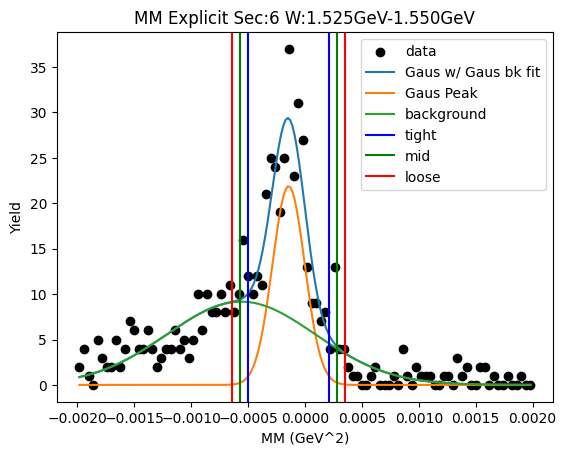

W bin: 6 1.550GeV-1.575GeV
initial Gaus fit:  [ 2.47317360e+01 -2.26681209e-04  3.21461036e-04]
2nd level W dependent
W1_ini_pars: [ 2.47317360e+01 -2.26681209e-04  3.21461036e-04  9.16943143e+00
 -5.60293263e-04  6.52676567e-04]
Gaus1 Peak: [ 2.21178629e+01 -1.24733312e-04  1.19696465e-04]
Gaus2 Peak: [ 1.23685535e+01 -4.42977541e-04  5.29757401e-04]
tight should be -0.0004239744750704456   0.00017450785062081647
[[-0.00042397  0.          0.        ]
 [ 0.00017451  0.          0.        ]]
mid should be -0.0004838227076395718   0.0002343560831899427
[[-0.00042397 -0.00048382  0.        ]
 [ 0.00017451  0.00023436  0.        ]]
loose should be -0.000543670940208698   0.0002942043157590689
[[-0.00042397 -0.00048382 -0.00054367]
 [ 0.00017451  0.00023436  0.0002942 ]]
-2.7423332121205558e-08 5.85401304783517e-08
Main Gaus Peak [ 2.21178629e+01 -1.24733312e-04  1.19696465e-04]
Gaus2 [ 1.23685535e+01 -4.42977541e-04  5.29757401e-04]


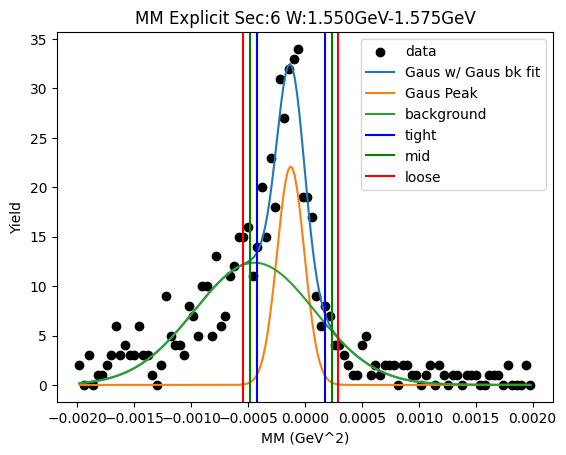

W bin: 7 1.575GeV-1.600GeV
initial Gaus fit:  [ 2.23858126e+01 -2.16735281e-04  3.58702759e-04]
2nd level W dependent
W1_ini_pars: [ 2.23858126e+01 -2.16735281e-04  3.58702759e-04  1.23685535e+01
 -4.42977541e-04  5.29757401e-04]
Gaus1 Peak: [ 1.87971783e+01 -1.33056667e-04  1.84090856e-04]
Gaus2 Peak: [ 8.72365019e+00 -4.92515185e-04  7.16953604e-04]
tight should be -0.0005932838070155979   0.0003271704726309076
[[-0.00059328  0.          0.        ]
 [ 0.00032717  0.          0.        ]]
mid should be -0.0006853292349802485   0.00041921590059555816
[[-0.00059328 -0.00068533  0.        ]
 [ 0.00032717  0.00041922  0.        ]]
loose should be -0.000777374662944899   0.0005112613285602088
[[-0.00059328 -0.00068533 -0.00077737]
 [ 0.00032717  0.00041922  0.00051126]]
-8.396425302601359e-08 1.1937240639468258e-07
Main Gaus Peak [ 1.87971783e+01 -1.33056667e-04  1.84090856e-04]
Gaus2 [ 8.72365019e+00 -4.92515185e-04  7.16953604e-04]


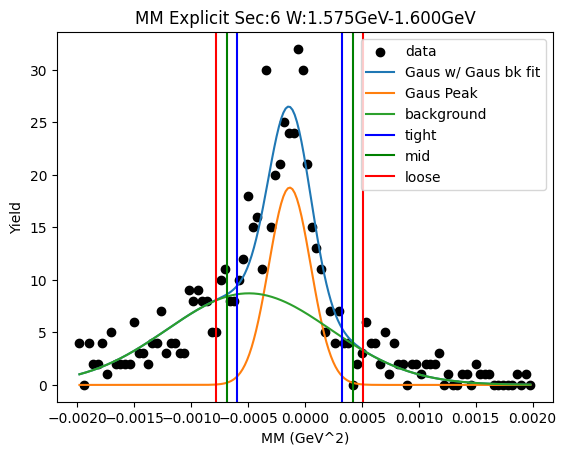

W bin: 8 1.600GeV-1.625GeV
initial Gaus fit:  [ 2.40813115e+01 -1.87501065e-04  3.28817796e-04]
2nd level W dependent
W1_ini_pars: [ 2.40813115e+01 -1.87501065e-04  3.28817796e-04  8.72365019e+00
 -4.92515185e-04  7.16953604e-04]
Gaus1 Peak: [ 2.20929150e+01 -1.08824045e-04  1.68724611e-04]
Gaus2 Peak: [ 8.81374365e+00 -5.96184824e-04  7.35268001e-04]
tight should be -0.0005306355722994364   0.00031298748167106575
[[-0.00053064  0.          0.        ]
 [ 0.00031299  0.          0.        ]]
mid should be -0.0006149978776964866   0.000397349787068116
[[-0.00053064 -0.000615    0.        ]
 [ 0.00031299  0.00039735  0.        ]]
loose should be -0.0006993601830935368   0.00048171209246516614
[[-0.00053064 -0.000615   -0.00069936]
 [ 0.00031299  0.00039735  0.00048171]]
-7.356131002431815e-08 9.724665570140587e-08
Main Gaus Peak [ 2.20929150e+01 -1.08824045e-04  1.68724611e-04]
Gaus2 [ 8.81374365e+00 -5.96184824e-04  7.35268001e-04]


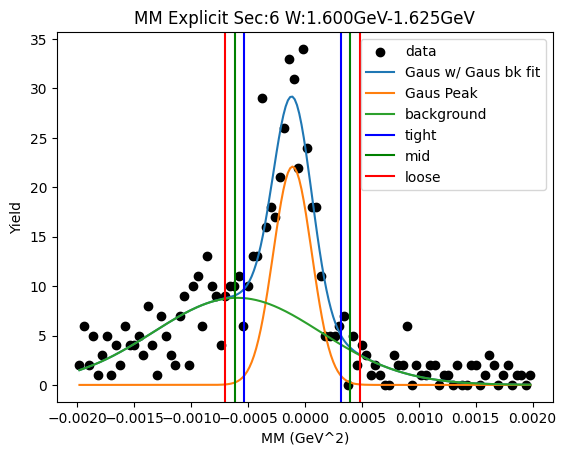

W bin: 9 1.625GeV-1.650GeV
initial Gaus fit:  [ 2.57042953e+01 -2.43795950e-04  3.88695839e-04]
2nd level W dependent
W1_ini_pars: [ 2.57042953e+01 -2.43795950e-04  3.88695839e-04  8.81374365e+00
 -5.96184824e-04  7.35268001e-04]
Gaus1 Peak: [ 2.58002720e+01 -1.22213268e-04  1.02929226e-04]
Gaus2 Peak: [ 1.45711614e+01 -4.35801545e-04  5.92022003e-04]
tight should be -0.0003795363322749841   0.00013510979651658596
[[-0.00037954  0.          0.        ]
 [ 0.00013511  0.          0.        ]]
mid should be -0.0004310009451541411   0.00018657440939574293
[[-0.00037954 -0.000431    0.        ]
 [ 0.00013511  0.00018657  0.        ]]
loose should be -0.00048246555803329813   0.00023803902227489994
[[-0.00037954 -0.000431   -0.00048247]
 [ 0.00013511  0.00018657  0.00023804]]
-1.6847193699905042e-08 4.671935939133079e-08
Main Gaus Peak [ 2.58002720e+01 -1.22213268e-04  1.02929226e-04]
Gaus2 [ 1.45711614e+01 -4.35801545e-04  5.92022003e-04]


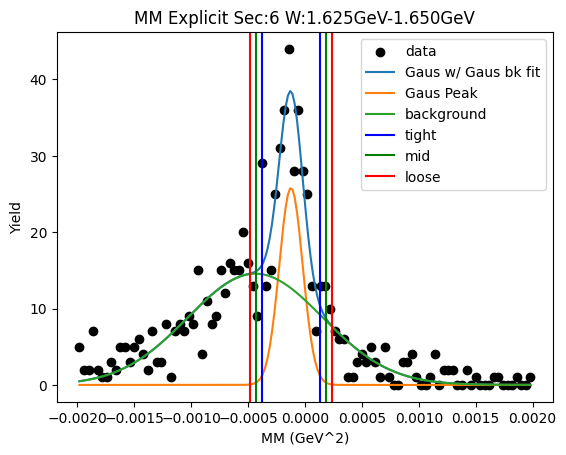

W bin: 10 1.650GeV-1.675GeV
initial Gaus fit:  [ 3.08389269e+01 -2.30000552e-04  3.52471300e-04]
2nd level W dependent
W1_ini_pars: [ 3.08389269e+01 -2.30000552e-04  3.52471300e-04  1.45711614e+01
 -4.35801545e-04  5.92022003e-04]
Gaus1 Peak: [ 2.81854190e+01 -1.32243467e-04  1.65606047e-04]
Gaus2 Peak: [ 1.26533530e+01 -5.76378585e-04  6.73049617e-04]
tight should be -0.0005462585837646422   0.00028177164946660874
[[-0.00054626  0.          0.        ]
 [ 0.00028177  0.          0.        ]]
mid should be -0.0006290616070877672   0.00036457467278973375
[[-0.00054626 -0.00062906  0.        ]
 [ 0.00028177  0.00036457  0.        ]]
loose should be -0.0007118646304108923   0.00044737769611285887
[[-0.00054626 -0.00062906 -0.00071186]
 [ 0.00028177  0.00036457  0.00044738]]
-6.478775345380689e-08 9.976442266099303e-08
Main Gaus Peak [ 2.81854190e+01 -1.32243467e-04  1.65606047e-04]
Gaus2 [ 1.26533530e+01 -5.76378585e-04  6.73049617e-04]


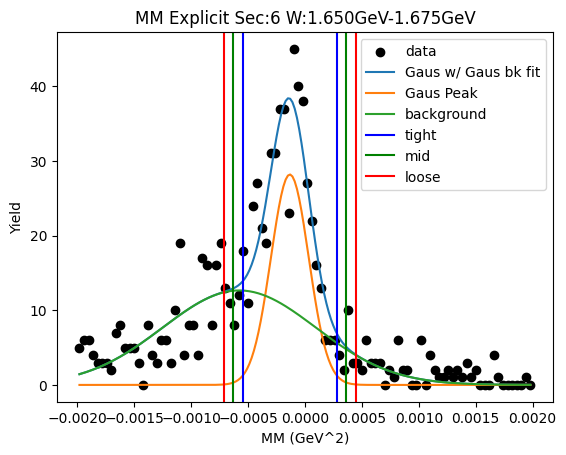

W bin: 11 1.675GeV-1.700GeV
initial Gaus fit:  [ 4.55816806e+01 -1.87599892e-04  3.04324849e-04]
2nd level W dependent
W1_ini_pars: [ 4.55816806e+01 -1.87599892e-04  3.04324849e-04  1.26533530e+01
 -5.76378585e-04  6.73049617e-04]
Gaus1 Peak: [ 3.87262196e+01 -7.83187863e-05  8.88809170e-05]
Gaus2 Peak: [ 2.67467210e+01 -3.23754111e-04  4.58748997e-04]
tight should be -0.00030052107878214107   0.0001438835060972179
[[-0.00030052  0.          0.        ]
 [ 0.00014388  0.          0.        ]]
mid should be -0.00034496153727007697   0.00018832396458515378
[[-0.00030052 -0.00034496  0.        ]
 [ 0.00014388  0.00018832  0.        ]]
loose should be -0.0003894019957580129   0.0002327644230730897
[[-0.00030052 -0.00034496 -0.0003894 ]
 [ 0.00014388  0.00018832  0.00023276]]
-1.7565619913259294e-08 2.983328450157159e-08
Main Gaus Peak [ 3.87262196e+01 -7.83187863e-05  8.88809170e-05]
Gaus2 [ 2.67467210e+01 -3.23754111e-04  4.58748997e-04]


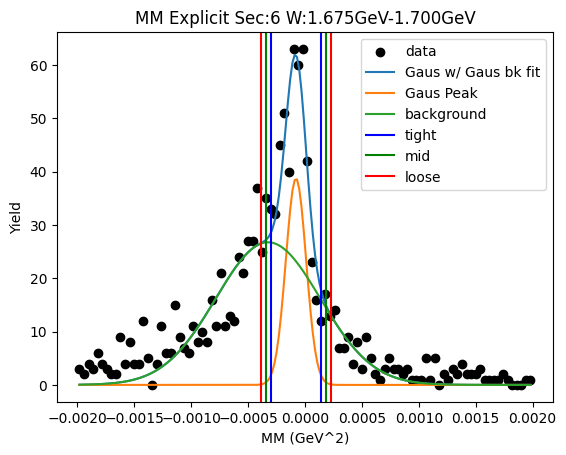

W bin: 12 1.700GeV-1.725GeV
initial Gaus fit:  [ 5.19024769e+01 -2.29504645e-04  3.25079293e-04]
2nd level W dependent
W1_ini_pars: [ 5.19024769e+01 -2.29504645e-04  3.25079293e-04  2.67467210e+01
 -3.23754111e-04  4.58748997e-04]
Gaus1 Peak: [ 3.86449631e+01 -1.07937392e-04  1.27110945e-04]
Gaus2 Peak: [ 2.95000603e+01 -3.96218023e-04  4.65116580e-04]
tight should be -0.0004257147545692904   0.00020983997132642082
[[-0.00042571  0.          0.        ]
 [ 0.00020984  0.          0.        ]]
mid should be -0.0004892702271588616   0.0002733954439159919
[[-0.00042571 -0.00048927  0.        ]
 [ 0.00020984  0.0002734   0.        ]]
loose should be -0.0005528256997484327   0.0003369509165055631
[[-0.00042571 -0.00048927 -0.00055283]
 [ 0.00020984  0.0002734   0.00033695]]
-3.682109664296573e-08 6.01220576630437e-08
Main Gaus Peak [ 3.86449631e+01 -1.07937392e-04  1.27110945e-04]
Gaus2 [ 2.95000603e+01 -3.96218023e-04  4.65116580e-04]


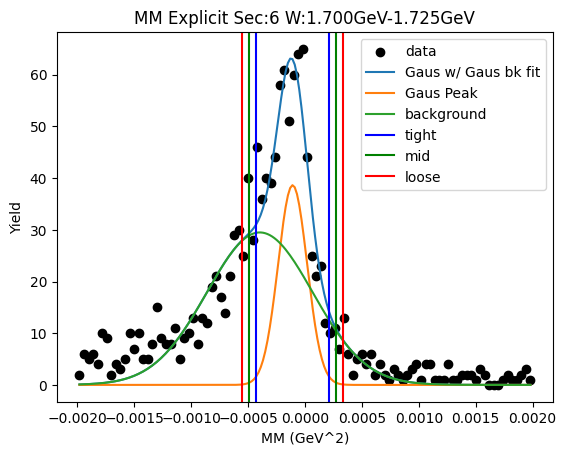

W bin: 13 1.725GeV-1.750GeV
initial Gaus fit:  [ 5.58845976e+01 -2.31678003e-04  3.36564989e-04]
2nd level W dependent
W1_ini_pars: [ 5.58845976e+01 -2.31678003e-04  3.36564989e-04  2.95000603e+01
 -3.96218023e-04  4.65116580e-04]
Gaus1 Peak: [ 4.76411841e+01 -1.53007692e-04  1.81352593e-04]
Gaus2 Peak: [ 2.10196674e+01 -5.43231633e-04  6.61722693e-04]
tight should be -0.0006063891751363007   0.00030037379023154594
[[-0.00060639  0.          0.        ]
 [ 0.00030037  0.          0.        ]]
mid should be -0.0006970654716730854   0.0003910500867683307
[[-0.00060639 -0.00069707  0.        ]
 [ 0.00030037  0.00039105  0.        ]]
loose should be -0.0007877417682098701   0.0004817263833051153
[[-0.00060639 -0.00069707 -0.00078774]
 [ 0.00030037  0.00039105  0.00048173]]
-7.525493509392158e-08 1.220776429931242e-07
Main Gaus Peak [ 4.76411841e+01 -1.53007692e-04  1.81352593e-04]
Gaus2 [ 2.10196674e+01 -5.43231633e-04  6.61722693e-04]


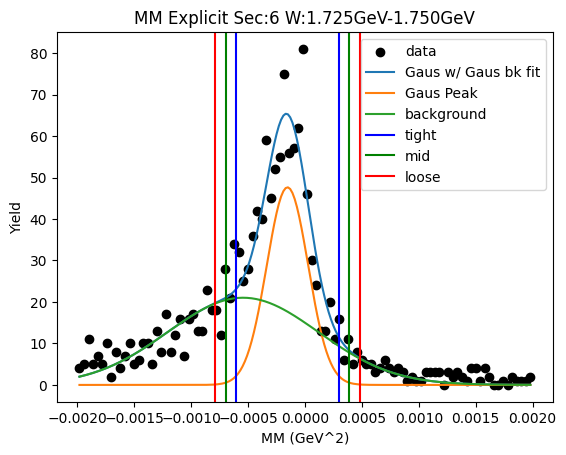

W bin: 14 1.750GeV-1.775GeV
initial Gaus fit:  [ 5.36768714e+01 -2.17838670e-04  3.39601774e-04]
2nd level W dependent
W1_ini_pars: [ 5.36768714e+01 -2.17838670e-04  3.39601774e-04  2.10196674e+01
 -5.43231633e-04  6.61722693e-04]
Gaus1 Peak: [ 4.29794982e+01 -1.14426232e-04  1.60084735e-04]
Gaus2 Peak: [ 2.51699525e+01 -4.51477263e-04  5.48371298e-04]
tight should be -0.0005146380682325338   0.00028578560519725347
[[-0.00051464  0.          0.        ]
 [ 0.00028579  0.          0.        ]]
mid should be -0.0005946804355755124   0.00036582797254023215
[[-0.00051464 -0.00059468  0.        ]
 [ 0.00028579  0.00036583  0.        ]]
loose should be -0.0006747228029184911   0.00044587033988321083
[[-0.00051464 -0.00059468 -0.00067472]
 [ 0.00028579  0.00036583  0.00044587]]
-6.378800437909156e-08 8.997472929774871e-08
Main Gaus Peak [ 4.29794982e+01 -1.14426232e-04  1.60084735e-04]
Gaus2 [ 2.51699525e+01 -4.51477263e-04  5.48371298e-04]


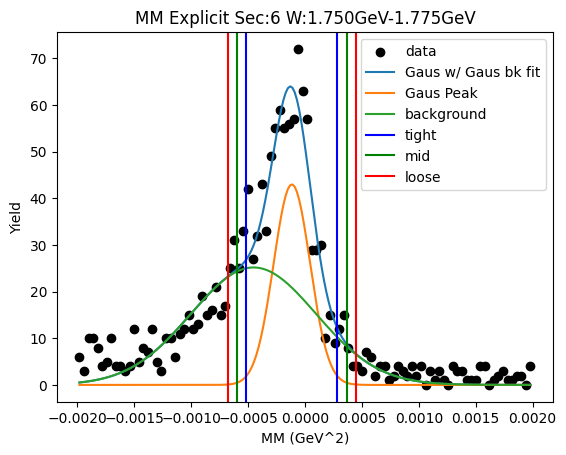

W bin: 15 1.775GeV-1.800GeV
initial Gaus fit:  [ 5.25850400e+01 -2.08137515e-04  3.25054435e-04]
2nd level W dependent
W1_ini_pars: [ 5.25850400e+01 -2.08137515e-04  3.25054435e-04  2.51699525e+01
 -4.51477263e-04  5.48371298e-04]
Gaus1 Peak: [ 4.58119022e+01 -1.55773716e-04  1.91982082e-04]
Gaus2 Peak: [ 1.61544207e+01 -5.24085455e-04  7.84554001e-04]
tight should be -0.0006357289208278538   0.0003241814891963076
[[-0.00063573  0.          0.        ]
 [ 0.00032418  0.          0.        ]]
mid should be -0.00073171996183027   0.0004201725301987238
[[-0.00063573 -0.00073172  0.        ]
 [ 0.00032418  0.00042017  0.        ]]
loose should be -0.0008277110028326861   0.0005161635712011399
[[-0.00063573 -0.00073172 -0.00082771]
 [ 0.00032418  0.00042017  0.00051616]]
-8.630590889367723e-08 1.3483680997178367e-07
Main Gaus Peak [ 4.58119022e+01 -1.55773716e-04  1.91982082e-04]
Gaus2 [ 1.61544207e+01 -5.24085455e-04  7.84554001e-04]


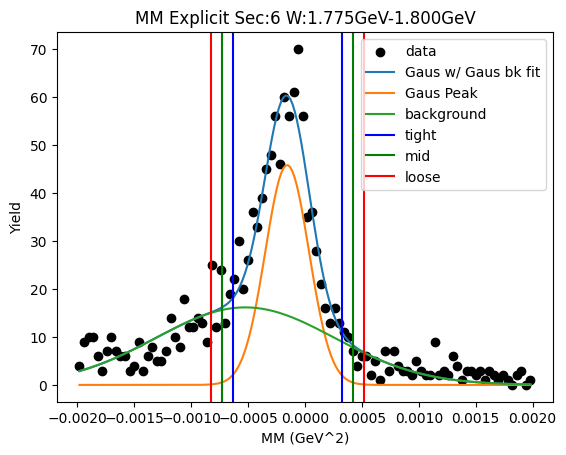

W bin: 16 1.800GeV-1.825GeV
initial Gaus fit:  [ 5.43051980e+01 -1.78914000e-04  3.18324106e-04]
2nd level W dependent
W1_ini_pars: [ 5.43051980e+01 -1.78914000e-04  3.18324106e-04  1.61544207e+01
 -5.24085455e-04  7.84554001e-04]
Gaus1 Peak: [ 4.79477838e+01 -1.30891986e-04  1.84968491e-04]
Gaus2 Peak: [ 1.63730852e+01 -5.16526842e-04  8.43550819e-04]
tight should be -0.0005933132135616004   0.00033152924139366613
[[-0.00059331  0.          0.        ]
 [ 0.00033153  0.          0.        ]]
mid should be -0.000685797459057127   0.0004240134868891927
[[-0.00059331 -0.0006858   0.        ]
 [ 0.00033153  0.00042401  0.        ]]
loose should be -0.0007782817045526537   0.0005164977323847194
[[-0.00059331 -0.0006858  -0.00077828]
 [ 0.00033153  0.00042401  0.0005165 ]]
-8.550731595751663e-08 1.1977273999952752e-07
Main Gaus Peak [ 4.79477838e+01 -1.30891986e-04  1.84968491e-04]
Gaus2 [ 1.63730852e+01 -5.16526842e-04  8.43550819e-04]


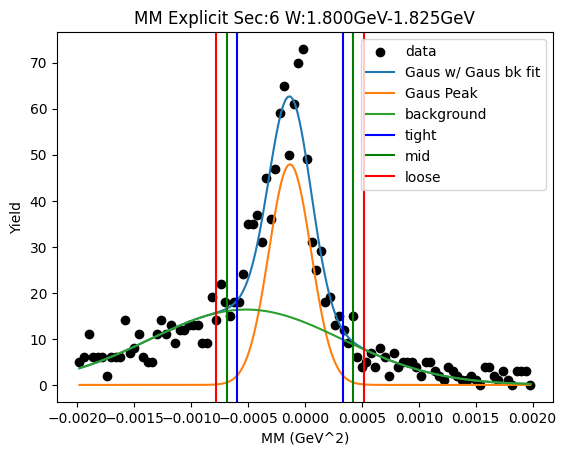

W bin: 17 1.825GeV-1.850GeV
initial Gaus fit:  [ 5.48764429e+01 -2.07104036e-04  3.02176050e-04]
2nd level W dependent
W1_ini_pars: [ 5.48764429e+01 -2.07104036e-04  3.02176050e-04  1.63730852e+01
 -5.16526842e-04  8.43550819e-04]
Gaus1 Peak: [ 4.81537065e+01 -1.30912004e-04  1.44358087e-04]
Gaus2 Peak: [ 2.17182802e+01 -4.64844380e-04  6.15929383e-04]
tight should be -0.0004918072217004437   0.0002299832145477415
[[-0.00049181  0.          0.        ]
 [ 0.00022998  0.          0.        ]]
mid should be -0.0005639862653252622   0.00030216225817256007
[[-0.00049181 -0.00056399  0.        ]
 [ 0.00022998  0.00030216  0.        ]]
loose should be -0.0006361653089500807   0.0003743413017973786
[[-0.00049181 -0.00056399 -0.00063617]
 [ 0.00022998  0.00030216  0.00037434]]
-4.5379819382746904e-08 7.965572474349602e-08
Main Gaus Peak [ 4.81537065e+01 -1.30912004e-04  1.44358087e-04]
Gaus2 [ 2.17182802e+01 -4.64844380e-04  6.15929383e-04]


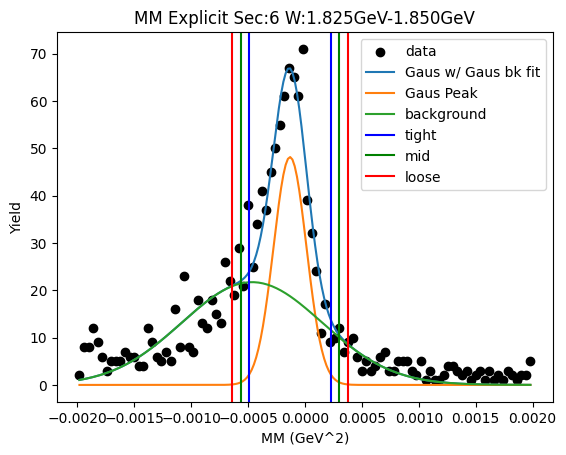

W bin: 18 1.850GeV-1.875GeV
initial Gaus fit:  [ 5.33483378e+01 -1.91498746e-04  3.24296023e-04]
2nd level W dependent
W1_ini_pars: [ 5.33483378e+01 -1.91498746e-04  3.24296023e-04  2.17182802e+01
 -4.64844380e-04  6.15929383e-04]
Gaus1 Peak: [ 4.68299534e+01 -1.34393204e-04  1.93765888e-04]
Gaus2 Peak: [ 1.57515833e+01 -5.29038838e-04  8.25551727e-04]
tight should be -0.000618807924629313   0.00035002151597360906
[[-0.00061881  0.          0.        ]
 [ 0.00035002  0.          0.        ]]
mid should be -0.0007156908686896052   0.0004469044600339013
[[-0.00061881 -0.00071569  0.        ]
 [ 0.00035002  0.0004469   0.        ]]
loose should be -0.0008125738127498974   0.0005437874040941934
[[-0.00061881 -0.00071569 -0.00081257]
 [ 0.00035002  0.0004469   0.00054379]]
-9.457412482796873e-08 1.306971915669843e-07
Main Gaus Peak [ 4.68299534e+01 -1.34393204e-04  1.93765888e-04]
Gaus2 [ 1.57515833e+01 -5.29038838e-04  8.25551727e-04]


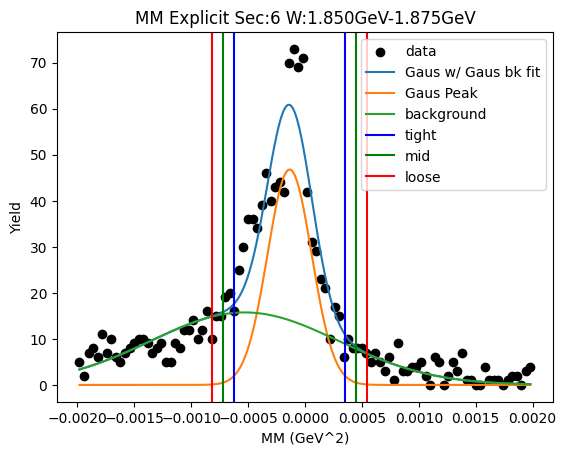

W bin: 19 1.875GeV-1.900GeV
initial Gaus fit:  [ 5.78785122e+01 -1.98188099e-04  3.20505514e-04]
2nd level W dependent
W1_ini_pars: [ 5.78785122e+01 -1.98188099e-04  3.20505514e-04  1.57515833e+01
 -5.29038838e-04  8.25551727e-04]
Gaus1 Peak: [ 5.28524078e+01 -1.17432465e-04  1.16728952e-04]
Gaus2 Peak: [ 2.62783987e+01 -3.88875641e-04  6.29193357e-04]
tight should be -0.0004092548458765767   0.00017438991548617016
[[-0.00040925  0.          0.        ]
 [ 0.00017439  0.          0.        ]]
mid should be -0.0004676193220128514   0.00023275439162244487
[[-0.00040925 -0.00046762  0.        ]
 [ 0.00017439  0.00023275  0.        ]]
loose should be -0.000525983798149126   0.0002911188677587195
[[-0.00040925 -0.00046762 -0.00052598]
 [ 0.00017439  0.00023275  0.00029112]]
-2.70865610141187e-08 5.466732877776396e-08
Main Gaus Peak [ 5.28524078e+01 -1.17432465e-04  1.16728952e-04]
Gaus2 [ 2.62783987e+01 -3.88875641e-04  6.29193357e-04]


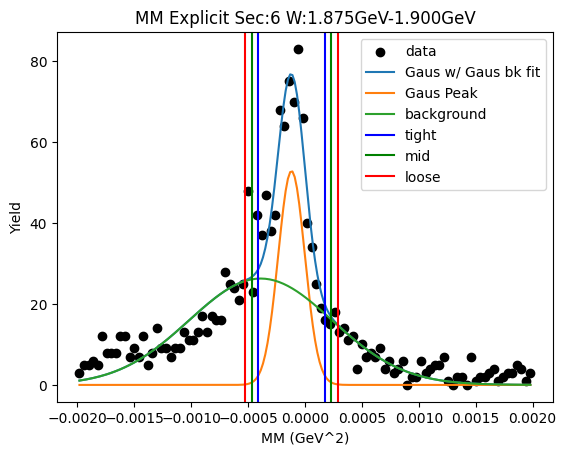

W bin: 20 1.900GeV-1.925GeV
initial Gaus fit:  [ 5.61803686e+01 -2.04993564e-04  3.16784896e-04]
2nd level W dependent
W1_ini_pars: [ 5.61803686e+01 -2.04993564e-04  3.16784896e-04  2.62783987e+01
 -3.88875641e-04  6.29193357e-04]
Gaus1 Peak: [ 5.21161484e+01 -1.36942006e-04  1.36612235e-04]
Gaus2 Peak: [ 2.23203058e+01 -4.72525491e-04  6.91094870e-04]
tight should be -0.0004784725937740773   0.00020458858175887614
[[-0.00047847  0.          0.        ]
 [ 0.00020459  0.          0.        ]]
mid should be -0.0005467787113273726   0.0002728946993121714
[[-0.00047847 -0.00054678  0.        ]
 [ 0.00020459  0.00027289  0.        ]]
loose should be -0.0006150848288806679   0.0003412008168654668
[[-0.00047847 -0.00054678 -0.00061508]
 [ 0.00020459  0.00027289  0.0003412 ]]
-3.7235595333069505e-08 7.474182135184092e-08
Main Gaus Peak [ 5.21161484e+01 -1.36942006e-04  1.36612235e-04]
Gaus2 [ 2.23203058e+01 -4.72525491e-04  6.91094870e-04]


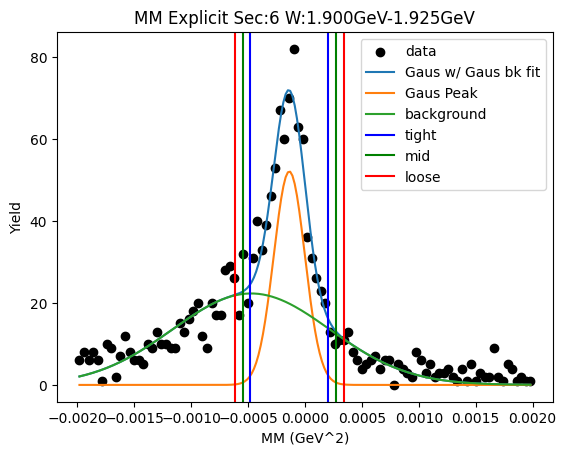

W bin: 21 1.925GeV-1.950GeV
initial Gaus fit:  [ 5.29643437e+01 -2.20359155e-04  3.30558660e-04]
2nd level W dependent
W1_ini_pars: [ 5.29643437e+01 -2.20359155e-04  3.30558660e-04  2.23203058e+01
 -4.72525491e-04  6.91094870e-04]
Gaus1 Peak: [ 4.70858264e+01 -9.75248178e-05  1.18384319e-04]
Gaus2 Peak: [ 2.67156901e+01 -4.55614150e-04  5.76244326e-04]
tight should be -0.00039348561622166967   0.0001984359805372724
[[-0.00039349  0.          0.        ]
 [ 0.00019844  0.          0.        ]]
mid should be -0.00045267777589756393   0.0002576281402131666
[[-0.00039349 -0.00045268  0.        ]
 [ 0.00019844  0.00025763  0.        ]]
loose should be -0.0005118699355734581   0.00031682029988906084
[[-0.00039349 -0.00045268 -0.00051187]
 [ 0.00019844  0.00025763  0.00031682]]
-3.253345111000465e-08 5.1555631300312706e-08
Main Gaus Peak [ 4.70858264e+01 -9.75248178e-05  1.18384319e-04]
Gaus2 [ 2.67156901e+01 -4.55614150e-04  5.76244326e-04]


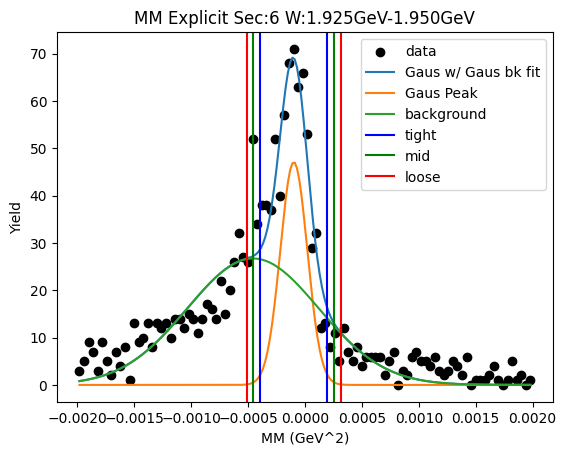

W bin: 22 1.950GeV-1.975GeV
initial Gaus fit:  [ 5.80335539e+01 -1.99376005e-04  2.97192051e-04]
2nd level W dependent
W1_ini_pars: [ 5.80335539e+01 -1.99376005e-04  2.97192051e-04  2.67156901e+01
 -4.55614150e-04  5.76244326e-04]
Gaus1 Peak: [ 5.34240742e+01 -1.35625930e-04  1.38677091e-04]
Gaus2 Peak: [ 2.19530300e+01 -4.85072207e-04  6.62864779e-04]
tight should be -0.00048231865675076225   0.00021106679627305773
[[-0.00048232  0.          0.        ]
 [ 0.00021107  0.          0.        ]]
mid should be -0.0005516572020531443   0.00028040534157543976
[[-0.00048232 -0.00055166  0.        ]
 [ 0.00021107  0.00028041  0.        ]]
loose should be -0.0006209957473555263   0.0003497438868778218
[[-0.00048232 -0.00055166 -0.000621  ]
 [ 0.00021107  0.00028041  0.00034974]]
-3.929961342265176e-08 7.60883993289598e-08
Main Gaus Peak [ 5.34240742e+01 -1.35625930e-04  1.38677091e-04]
Gaus2 [ 2.19530300e+01 -4.85072207e-04  6.62864779e-04]


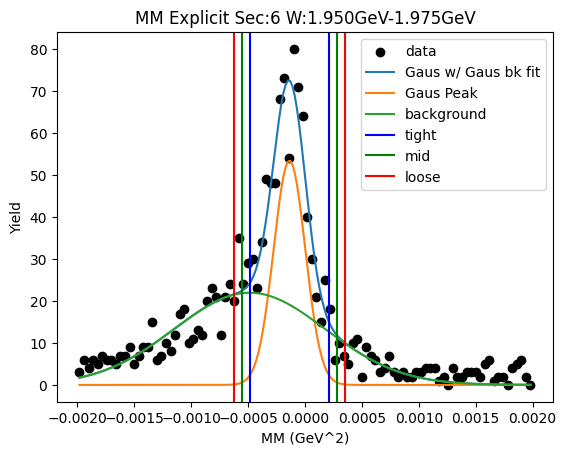

W bin: 23 1.975GeV-2.000GeV
initial Gaus fit:  [ 5.88451324e+01 -1.72013278e-04  2.83831704e-04]
2nd level W dependent
W1_ini_pars: [ 5.88451324e+01 -1.72013278e-04  2.83831704e-04  2.19530300e+01
 -4.85072207e-04  6.62864779e-04]
Gaus1 Peak: [ 5.20220982e+01 -1.15960256e-04  1.67807841e-04]
Gaus2 Peak: [ 1.82987261e+01 -5.17036863e-04  6.99134679e-04]
tight should be -0.0005354798587010947   0.0003035593471328822
[[-0.00053548  0.          0.        ]
 [ 0.00030356  0.          0.        ]]
mid should be -0.0006193837792844924   0.0003874632677162799
[[-0.00053548 -0.00061938  0.        ]
 [ 0.00030356  0.00038746  0.        ]]
loose should be -0.0007032876998678901   0.0004713671882996776
[[-0.00053548 -0.00061938 -0.00070329]
 [ 0.00030356  0.00038746  0.00047137]]
-7.103163374966594e-08 9.792519559269663e-08
Main Gaus Peak [ 5.20220982e+01 -1.15960256e-04  1.67807841e-04]
Gaus2 [ 1.82987261e+01 -5.17036863e-04  6.99134679e-04]


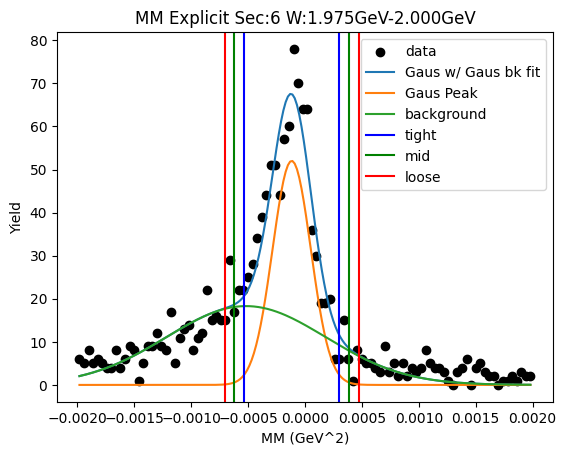

W bin: 24 2.000GeV-2.025GeV
initial Gaus fit:  [ 5.57226263e+01 -1.83589782e-04  2.85023063e-04]
2nd level W dependent
W1_ini_pars: [ 5.57226263e+01 -1.83589782e-04  2.85023063e-04  1.82987261e+01
 -5.17036863e-04  6.99134679e-04]
Gaus1 Peak: [ 4.96492397e+01 -1.47291492e-04  1.97401108e-04]
Gaus2 Peak: [ 1.32434343e+01 -6.19448485e-04  8.60182930e-04]
tight should be -0.0006407942624705413   0.0003462112790685041
[[-0.00064079  0.          0.        ]
 [ 0.00034621  0.          0.        ]]
mid should be -0.0007394948166244458   0.0004449118332224087
[[-0.00064079 -0.00073949  0.        ]
 [ 0.00034621  0.00044491  0.        ]]
loose should be -0.0008381953707783503   0.0005436123873763132
[[-0.00064079 -0.00073949 -0.0008382 ]
 [ 0.00034621  0.00044491  0.00054361]]
-9.520680915594288e-08 1.3859637621096535e-07
Main Gaus Peak [ 4.96492397e+01 -1.47291492e-04  1.97401108e-04]
Gaus2 [ 1.32434343e+01 -6.19448485e-04  8.60182930e-04]


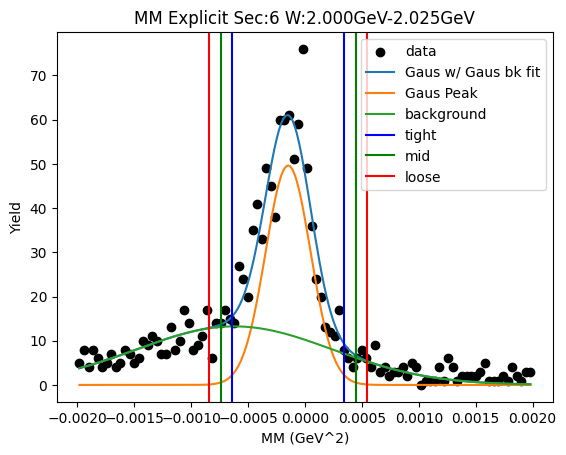

W bin: 25 2.025GeV-2.050GeV
initial Gaus fit:  [ 5.16944999e+01 -1.94167318e-04  3.23063221e-04]
2nd level W dependent
W1_ini_pars: [ 5.16944999e+01 -1.94167318e-04  3.23063221e-04  1.32434343e+01
 -6.19448485e-04  8.60182930e-04]
Gaus1 Peak: [ 4.64968642e+01 -1.22012471e-04  1.48481100e-04]
Gaus2 Peak: [ 2.05846821e+01 -4.71455898e-04  6.61339486e-04]
tight should be -0.0004932152210682701   0.00024919027961244555
[[-0.00049322  0.          0.        ]
 [ 0.00024919  0.          0.        ]]
mid should be -0.0005674557711363417   0.00032343082968051715
[[-0.00049322 -0.00056746  0.        ]
 [ 0.00024919  0.00032343  0.        ]]
loose should be -0.0006416963212044133   0.00039767137974858874
[[-0.00049322 -0.00056746 -0.0006417 ]
 [ 0.00024919  0.00032343  0.00039767]]
-5.1252868279788456e-08 8.102695430604775e-08
Main Gaus Peak [ 4.64968642e+01 -1.22012471e-04  1.48481100e-04]
Gaus2 [ 2.05846821e+01 -4.71455898e-04  6.61339486e-04]


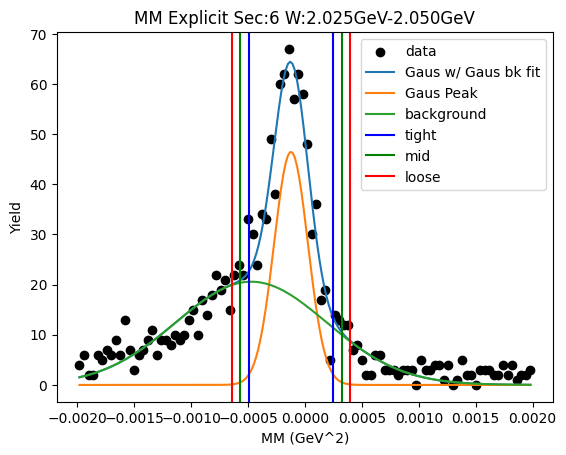

W bin: 26 2.050GeV-2.075GeV
initial Gaus fit:  [ 5.52272950e+01 -1.95183253e-04  2.97086369e-04]
2nd level W dependent
W1_ini_pars: [ 5.52272950e+01 -1.95183253e-04  2.97086369e-04  2.05846821e+01
 -4.71455898e-04  6.61339486e-04]
Gaus1 Peak: [ 4.94475533e+01 -9.26075955e-05  1.04086933e-04]
Gaus2 Peak: [ 2.72402493e+01 -3.89108322e-04  5.40110477e-04]
tight should be -0.00035282492794360705   0.00016760973691840319
[[-0.00035282  0.          0.        ]
 [ 0.00016761  0.          0.        ]]
mid should be -0.0004048683944298081   0.00021965320340460424
[[-0.00035282 -0.00040487  0.        ]
 [ 0.00016761  0.00021965  0.        ]]
loose should be -0.00045691186091600917   0.0002716966698908053
[[-0.00035282 -0.00040487 -0.00045691]
 [ 0.00016761  0.00021965  0.0002717 ]]
-2.3926102100178267e-08 4.107843559342965e-08
Main Gaus Peak [ 4.94475533e+01 -9.26075955e-05  1.04086933e-04]
Gaus2 [ 2.72402493e+01 -3.89108322e-04  5.40110477e-04]


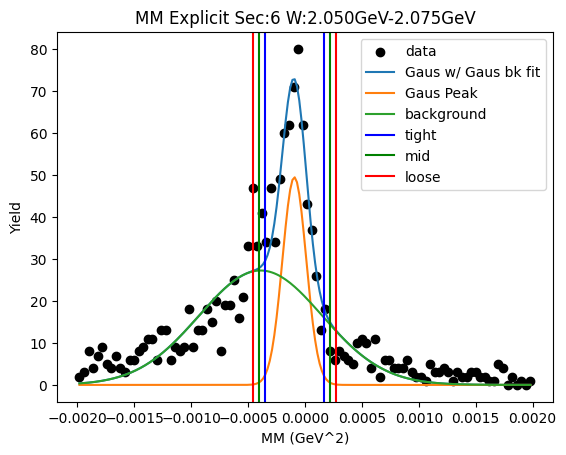

W bin: 27 2.075GeV-2.100GeV
initial Gaus fit:  [ 3.98843038e+01 -2.27338209e-04  3.79867251e-04]
2nd level W dependent
W1_ini_pars: [ 3.98843038e+01 -2.27338209e-04  3.79867251e-04  2.72402493e+01
 -3.89108322e-04  5.40110477e-04]
Gaus1 Peak: [ 3.57775622e+01 -1.60583100e-04  2.03327069e-04]
Gaus2 Peak: [ 1.29800102e+01 -6.16436633e-04  9.77485058e-04]
tight should be -0.0006689007716347526   0.0003477345715389716
[[-0.0006689   0.          0.        ]
 [ 0.00034773  0.          0.        ]]
mid should be -0.000770564305952125   0.00044939810585634403
[[-0.0006689  -0.00077056  0.        ]
 [ 0.00034773  0.0004494   0.        ]]
loose should be -0.0008722278402694974   0.0005510616401737164
[[-0.0006689  -0.00077056 -0.00087223]
 [ 0.00034773  0.0004494   0.00055106]]
-9.823875849780393e-08 1.4981262253978553e-07
Main Gaus Peak [ 3.57775622e+01 -1.60583100e-04  2.03327069e-04]
Gaus2 [ 1.29800102e+01 -6.16436633e-04  9.77485058e-04]


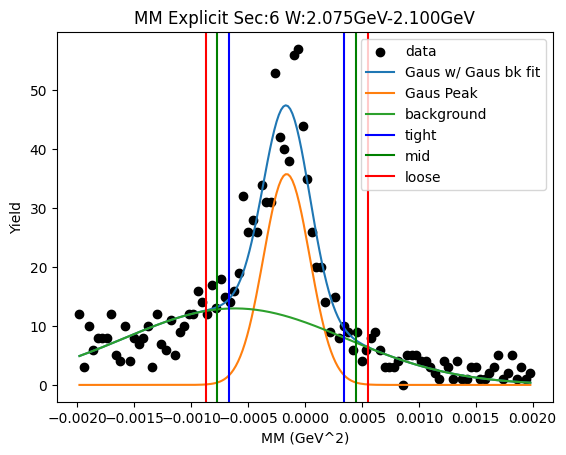

W bin: 28 2.100GeV-2.125GeV
initial Gaus fit:  [ 4.57487220e+01 -2.04941985e-04  3.15535653e-04]
2nd level W dependent
W1_ini_pars: [ 4.57487220e+01 -2.04941985e-04  3.15535653e-04  1.29800102e+01
 -6.16436633e-04  9.77485058e-04]
Gaus1 Peak: [ 4.00876783e+01 -1.37876270e-04  1.84242144e-04]
Gaus2 Peak: [ 1.43912429e+01 -5.48059863e-04  7.61280945e-04]
tight should be -0.0005984816290625643   0.0003227290890894028
[[-0.00059848  0.          0.        ]
 [ 0.00032273  0.          0.        ]]
mid should be -0.000690602700877761   0.0004148501609045995
[[-0.00059848 -0.0006906   0.        ]
 [ 0.00032273  0.00041485  0.        ]]
loose should be -0.0007827237726929577   0.0005069712327197963
[[-0.00059848 -0.0006906  -0.00078272]
 [ 0.00032273  0.00041485  0.00050697]]
-8.282563664315506e-08 1.2084536829398008e-07
Main Gaus Peak [ 4.00876783e+01 -1.37876270e-04  1.84242144e-04]
Gaus2 [ 1.43912429e+01 -5.48059863e-04  7.61280945e-04]


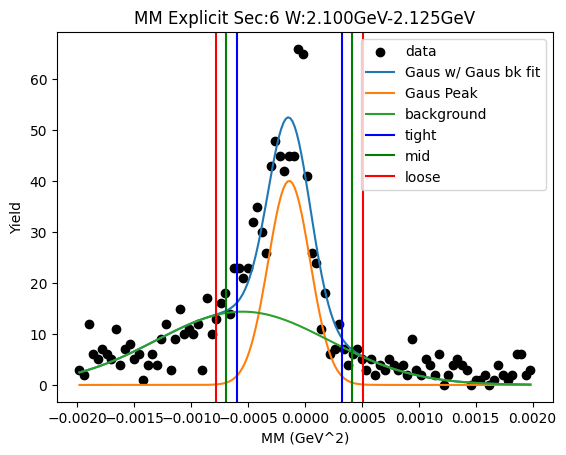

In [7]:
bkgd=True
Wlow_bin = -1
Wbin_bkgd = 0

tight = 2.5
mid = 3
loose = 3.5



#a_ini=180
#m_ini=0.000034
#g_ini=12
#bw_ini = [a_ini,m_ini,g_ini]

gaus1_ini = [9000, -0.00022, 0.0002]
gaus2_ini = [500, -8.08201518e-04,  5.76255640e-04]
gaus3_ini = [706, 0.4, 0.2417]
 
#bw_ini_w = [30, 0.000034, 12]

gaus1_ini_w = [28, -0.0002, 0.0004]
gaus2_ini_w = [3.07211428, -0.01, 0.06742853]
gaus3_ini_w = [2.78458923, 0.4, 0.10165907]

gaus_bounds = [[0.0,-0.01,1e-05],[np.inf,0.01,np.inf]]
full_bounds2= [[0.0,-0.01,1e-05,0.0,-np.inf,0.0],[np.inf,0.01,np.inf,np.inf,np.inf,np.inf]]
full_bounds = [[0.0,-0.01,1e-05,0.0,-np.inf,0.0,0.0,-np.inf,0.0],[np.inf,0.01,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]
   

#bw_pars = np.zeros((6,_W_bins_+1,3))
gaus1_pars = np.zeros((6,_W_bins_+1,3))
gaus2_pars = np.zeros((6,_W_bins_+1,3))
gaus3_pars = np.zeros((6,_W_bins_+1,3))

gaus1_err = np.zeros((6,_W_bins_+1,3))
gaus2_err = np.zeros((6,_W_bins_+1,3))
gaus3_err = np.zeros((6,_W_bins_+1,3))


ini_pars= np.zeros(9)
ini_pars2= np.zeros(6)
for i in range(3):
    #ini_pars[i] = bw_ini[i]
    ini_pars2[i] = gaus1_ini[i]
    ini_pars2[i+3] = gaus2_ini[i]
    ini_pars[i] = gaus1_ini[i]
    ini_pars[i+3] = gaus2_ini[i]
    ini_pars[i+6] = gaus3_ini[i]

    #sec W low, high, tight, mid, loose
cut_bounds = np.zeros((6,_W_bins_+1,2,3))
cut_bounds_err = np.zeros((6,_W_bins_+1,2,3))

#bw_ini_w1 = np.zeros(3)
gaus1_ini_w1 = np.zeros(3)
    
for sec in range(6):
    x_r=Center_Xbins(hist_name[sec][1])
    y_r=Values_1d(hist_name[sec][1])
    plt.scatter(x_r,y_r,color='k',label='data')
    plt.title("MM {} Sec:{} W:{}-{} (GeV)".format(Particle,sec+1,_W_min_,_W_max_))
    plt.xlabel("MM (GeV^2)")
    plt.ylabel("Yield")
    tmp_x1 = np.linspace(x_r[0],x_r[len(x_r)-1],200)
    try:
        #plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_ini),label="BW ini pars")
        pars_r1, pars_cov_r1 = op.curve_fit(Gaus,x_r,y_r,p0=gaus1_ini,maxfev=5000,bounds=gaus_bounds)
        plt.plot(tmp_x1,Gaus(tmp_x1,*pars_r1),label="Gaus fit1")
        print("initial bw fit: ",pars_r1)
        try:
            #r1_ini_pars = np.zeros(9)
            r1_ini_pars = np.zeros(6)
            
            for i in range(3):
                r1_ini_pars[i] = pars_r1[i]
                r1_ini_pars[i+3] = gaus2_ini[i]
                #r1_ini_pars[i+6] = gaus3_ini[i]
            #pars_r2, pars_cov_r2 = op.curve_fit(Gaus3,x_r,y_r,p0=r1_ini_pars,maxfev=5000,bounds=full_bounds)
            print("input parameters for r2",r1_ini_pars)
            pars_r2, pars_cov_r2 = op.curve_fit(Gaus2,x_r,y_r,p0=r1_ini_pars,maxfev=5000,bounds=full_bounds2)
            #plt.plot(tmp_x1,Gaus3(tmp_x1,*pars_r2),label="Gaus w/ 2Gaus bk fit")
            plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_ini_pars),label="Gaus w/ 1Gaus bk guess")
            plt.plot(tmp_x1,Gaus2(tmp_x1,*pars_r2),label="Gaus w/ 1Gaus bk fit")
            print("r2 parameters",pars_r2)
            #r1_bkgd_pars = np.zeros(6)
            r1_bkgd_pars = np.zeros(3)
            
            for i in range(3):
                #bw_pars[sec][_W_bins_][i] = pars_r2[i]
                if np.abs(pars_r2[1]) < np.abs(pars_r2[4]):
                    gaus1_pars[sec][_W_bins_][i] = pars_r2[i]
                    gaus1_err[sec][_W_bins_][i] = pars_cov_r2[i][i]
                    r1_bkgd_pars[i] = pars_r2[i+3]
                    #r1_bkgd_pars[i+3] = pars_r2[i+6]
                    gaus2_pars[sec][_W_bins_][i] = pars_r2[i+3]
                    gaus2_err[sec][_W_bins_][i] = pars_cov_r2[i+3][i+3]
                else:
                    gaus1_pars[sec][_W_bins_][i] = pars_r2[i+3]
                    gaus1_err[sec][_W_bins_][i] = pars_cov_r2[i+3][i+3]
                    r1_bkgd_pars[i] = pars_r2[i]
                    #r1_bkgd_pars[i+3] = pars_r2[i+6]
                    gaus2_pars[sec][_W_bins_][i] = pars_r2[i]
                    gaus2_err[sec][_W_bins_][i] = pars_cov_r2[i][i]
                #gaus3_pars[sec][_W_bins_][i] = pars_r2[i+6]
                #gaus3_err[sec][_W_bins_][i] = pars_cov_r2[i+6][i+6]
            for i in range(3):
                #cut_bounds[sec][_W_bins_][0][0] = sign(pars_r2[1]-tight*pars_r2[2])*(pars_r2[1]-tight*pars_r2[2])*(pars_r2[1]-tight*pars_r2[2])
                #cut_bounds[sec][_W_bins_][0][1] = sign(pars_r2[1]-mid*pars_r2[2])*(pars_r2[1]-mid*pars_r2[2])*(pars_r2[1]-mid*pars_r2[2])
                #cut_bounds[sec][_W_bins_][0][2] = sign(pars_r2[1]-loose*pars_r2[2])*(pars_r2[1]-loose*pars_r2[2])*(pars_r2[1]-loose*pars_r2[2])
                #cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2])*(pars_r2[1]+tight*pars_r2[2])
                #cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2])*(pars_r2[1]+mid*pars_r2[2])
                #cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2])*(pars_r2[1]+loose*pars_r2[2])
                cut_bounds[sec][_W_bins_][0][i] = (gaus1_pars[sec][_W_bins_][1]-cut_width[i]*gaus1_pars[sec][_W_bins_][2])
                cut_bounds[sec][_W_bins_][1][i] = (gaus1_pars[sec][_W_bins_][1]+cut_width[i]*gaus1_pars[sec][_W_bins_][2])
                
#                 cut_bounds[sec][_W_bins_][0][0] = (pars_r2[1]-tight*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][0][1] = (pars_r2[1]-mid*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][0][2] = (pars_r2[1]-loose*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2])
#                 cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2])
                #
                #print(pars_cov_r2[1][1],pars_cov_r2[2][2])
                #cut_bounds_err[sec][_W_bins_][0][0] = add_quad([pars_cov_r2[1][1],-tight*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][0][1] = add_quad([pars_cov_r2[1][1],-mid*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][0][2] = add_quad([pars_cov_r2[1][1],-loose*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][1][0] = add_quad([pars_cov_r2[1][1],tight*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][1][1] = add_quad([pars_cov_r2[1][1],mid*pars_cov_r2[2][2]])
                #cut_bounds_err[sec][_W_bins_][1][2] = add_quad([pars_cov_r2[1][1],loose*pars_cov_r2[2][2]])
            plt.plot(tmp_x1,Gaus(tmp_x1,*gaus1_pars[sec][_W_bins_]),label="Gaus Peak")
            #plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_bkgd_pars),label="background")
            plt.plot(tmp_x1,Gaus(tmp_x1,*r1_bkgd_pars),label="background")
            plt.axvline(x=cut_bounds[sec][_W_bins_][0][0],label="tight +-{}\u03C3".format(tight),color='b')
            plt.axvline(x=cut_bounds[sec][_W_bins_][1][0],color='b')
            plt.axvline(x=cut_bounds[sec][_W_bins_][0][1],label="mid +-{}\u03C3".format(mid),color='g')
            plt.axvline(x=cut_bounds[sec][_W_bins_][1][1],color='g')
            plt.axvline(x=cut_bounds[sec][_W_bins_][0][2],label="loose +-{}\u03C3".format(loose),color='r')
            plt.axvline(x=cut_bounds[sec][_W_bins_][1][2],color='r')
            print(pars_r2[1]*pars_r2[1]-3*pars_r2[2]*pars_r2[2],pars_r2[1]*pars_r2[1]+3*pars_r2[2]*pars_r2[2])
            print("Main Gaus Peak",gaus1_pars[sec][_W_bins_])
            print("Gaus2",gaus2_pars[sec][_W_bins_])
            #print("Gaus3",gaus3_pars[sec][_W_bins_])
        except RuntimeError:
            print("Runtime Error1.1\n\tJust skip it for now")
        except ValueError:
            print("Value Error1.1\n\tJust skip it for now")
    except RuntimeError:
        print("Runtime Error1.0\n\tJust skip it for now")
    except ValueError:
        print("Value Error1.0\n\tJust skip it for now")
    plt.legend()
    plt.show()
    for Wbin in range(_W_bins_):
        
        if Wbin > Wlow_bin:
            print("W bin:",Wbin,W_Bin_PlotName[Wbin])
            x_w=Center_Xbins(hist_name[sec][0][Wbin])
            y_w=Values_1d(hist_name[sec][0][Wbin])
            if Count_Non_Zero(y_w) > 10:
                plt.scatter(x_w,y_w,color='k',label='data')
                plt.title("MM {} Sec:{} W:{}".format(Particle,sec+1,W_Bin_PlotName[Wbin]))
                plt.xlabel("MM (GeV^2)")
                plt.ylabel("Yield")
                if Wbin > 0 and gaus1_pars[sec][Wbin-1][i]!=0:
                    for i in range(3):
                        #bw_ini_w1[i] = bw_pars[sec][Wbin-1][i]
                        gaus1_ini_w1[i] = gaus1_pars[sec][Wbin-1][i]
                else:
                    for i in range(3):
                        #bw_ini_w1[i] = bw_ini_w[i]
                        gaus1_ini_w1[i] = gaus1_ini_w[i]
                gaus1_ini_w1[0] = np.max(y_w)
                gaus1_ini_w1[1] = x_w[np.argmax(y_w)]
                #gaus1_ini_w1[2]
                cont_x = np.linspace(np.min(x_w),np.max(x_w),200)
                #plt.plot(cont_x,Gaus(cont_x,*gaus1_ini_w1),label="first guess")
                try:
                    #if Wbin > 0 and bw_pars[sec][Wbin-1][i]!=0:

                    pars_w1, pars_cov_w1 = op.curve_fit(Gaus,x_w,y_w,p0=gaus1_ini_w1,maxfev=5000,bounds=gaus_bounds)
                    #plt.plot(tmp_x1,Gaus(tmp_x1,*pars_w1),label="gaus fit1")
                    #plt.plot(tmp_x1,Gaus(tmp_x1,*gaus1_ini_w1),label="gaus ini_w1")
                    print("initial Gaus fit: ",pars_w1)
                    if Wbin >= Wbin_bkgd:
                        try:
                            print("2nd level W dependent")
                            #w1_ini_pars = np.zeros(9)
                            w1_ini_pars = np.zeros(6)

                            for i in range(3):
                                w1_ini_pars[i] = pars_w1[i]
                                if Wbin > 0:
                                    if gaus2_pars[sec][Wbin-1][i] != 0.0:
                                        w1_ini_pars[i+3] = gaus2_pars[sec][Wbin-1][i]
                                        #w1_ini_pars[i+6] = gaus3_pars[sec][Wbin-1][i]
                                    else:
                                        w1_ini_pars[i+3] = gaus2_ini_w[i]
                                        #w1_ini_pars[i+6] = gaus3_ini_w[i]
                                else:
                                    w1_ini_pars[i+3] = gaus2_ini_w[i]
                                    #w1_ini_pars[i+6] = gaus3_ini_w[i]
                            print("W1_ini_pars:",w1_ini_pars)
                            #pars_w2, pars_cov_w2 = op.curve_fit(Gaus3,x_w,y_w,p0=w1_ini_pars,maxfev=5000,bounds=full_bounds)
                            pars_w2, pars_cov_w2 = op.curve_fit(Gaus2,x_w,y_w,p0=w1_ini_pars,maxfev=5000,bounds=full_bounds2)
                            #plt.plot(tmp_x1,Gaus3(tmp_x1,*pars_w2),label="Gaus w/ 2Gaus bk fit")
                            plt.plot(tmp_x1,Gaus2(tmp_x1,*pars_w2),label="Gaus w/ Gaus bk fit")
                            #w1_bkgd_pars = np.zeros(6)
                            w1_bkgd_pars = np.zeros(3)
                            for i in range(3):
                                #bw_pars[sec][Wbin][i] = pars_w2[i]
                                if np.abs(pars_w2[1]) < np.abs(pars_w2[4]): 
                                    gaus1_pars[sec][Wbin][i] = pars_w2[i]
                                    w1_bkgd_pars[i] = pars_w2[i+3]
                                    #w1_bkgd_pars[i+3] = pars_w2[i+6]
                                    gaus2_pars[sec][Wbin][i] = pars_w2[i+3]
                                else:
                                    gaus1_pars[sec][Wbin][i] = pars_w2[i+3]
                                    w1_bkgd_pars[i] = pars_w2[i]
                                    #w1_bkgd_pars[i+3] = pars_w2[i+6]
                                    gaus2_pars[sec][Wbin][i] = pars_w2[i]
                                #gaus3_pars[sec][Wbin][i] = pars_w2[i+6]
                            print("Gaus1 Peak:",gaus1_pars[sec][Wbin])
                            print("Gaus2 Peak:",gaus2_pars[sec][Wbin])
                            for i in range(3):
                                print(cut_names[i],"should be",gaus1_pars[sec][Wbin][1]-cut_width[i]*gaus1_pars[sec][Wbin][2]," ",gaus1_pars[sec][Wbin][1]+cut_width[i]*gaus1_pars[sec][Wbin][2])
                                cut_bounds[sec][Wbin][0][i] = (gaus1_pars[sec][Wbin][1]-cut_width[i]*gaus1_pars[sec][Wbin][2])
                                cut_bounds[sec][Wbin][1][i] = (gaus1_pars[sec][Wbin][1]+cut_width[i]*gaus1_pars[sec][Wbin][2])
                                print(cut_bounds[sec][Wbin])
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w2[1]-loose*pars_w2[2])
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w2[1]+tight*pars_w2[2])
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w2[1]+mid*pars_w2[2])
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w2[1]+loose*pars_w2[2])
                                #
                                #cut_bounds_err[sec][Wbin][0][0] = add_quad([pars_cov_w2[1][1],-tight*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][0][1] = add_quad([pars_cov_w2[1][1],-mid*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][0][2] = add_quad([pars_cov_w2[1][1],-loose*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][1][0] = add_quad([pars_cov_w2[1][1],tight*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][1][1] = add_quad([pars_cov_w2[1][1],mid*pars_cov_w2[2][2]])
                                #cut_bounds_err[sec][Wbin][1][2] = add_quad([pars_cov_w2[1][1],loose*pars_cov_w2[2][2]])
                            plt.plot(tmp_x1,Gaus(tmp_x1,*gaus1_pars[sec][Wbin]),label="Gaus Peak")
                            #plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_bkgd_pars),label="background")
                            plt.plot(tmp_x1,Gaus(tmp_x1,*gaus2_pars[sec][Wbin]),label="background")

                            print(pars_w2[1]*pars_w2[1]-3*pars_w2[2]*pars_w2[2],pars_w2[1]*pars_w2[1]+3*pars_w2[2]*pars_w2[2])
                            print("Main Gaus Peak",gaus1_pars[sec][Wbin])
                            print("Gaus2",gaus2_pars[sec][Wbin])
                            #print("Gaus3",gaus3_pars[sec][Wbin])
                        except RuntimeError:
                            print("Runtime Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                #bw_pars[sec][Wbin][i] = pars_w1[i]
                                gaus1_pars[sec][Wbin][i] = pars_w1[i]
                                cut_bounds[sec][Wbin][0][i] = (pars_w1[1]-cut_width[i]*pars_w1[2])
                                cut_bounds[sec][Wbin][1][i] = (pars_w1[1]+cut_width[i]*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2])
                                #
                                #cut_bounds_err[sec][Wbin][0][0] = add_quad([pars_cov_w1[1][1],-tight*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][0][1] = add_quad([pars_cov_w1[1][1],-mid*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][0][2] = add_quad([pars_cov_w1[1][1],-loose*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][0] = add_quad([pars_cov_w1[1][1],tight*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][1] = add_quad([pars_cov_w1[1][1],mid*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][2] = add_quad([pars_cov_w1[1][1],loose*pars_cov_w1[2][2]])
                        except ValueError:
                            print("Value Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                #bw_pars[sec][Wbin][i] = pars_w1[i]
                                gaus1_pars[sec][Wbin][i] = pars_w1[i]
                                cut_bounds[sec][Wbin][0][i] = (pars_w1[1]-cut_width[i]*pars_w1[2])
                                cut_bounds[sec][Wbin][1][i] = (pars_w1[1]+cut_width[i]*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2])
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2])
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2])
                                #
                                #cut_bounds_err[sec][Wbin][0][0] = add_quad([pars_cov_w1[1][1],-tight*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][0][1] = add_quad([pars_cov_w1[1][1],-mid*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][0][2] = add_quad([pars_cov_w1[1][1],-loose*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][0] = add_quad([pars_cov_w1[1][1],tight*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][1] = add_quad([pars_cov_w1[1][1],mid*pars_cov_w1[2][2]])
                                #cut_bounds_err[sec][Wbin][1][2] = add_quad([pars_cov_w1[1][1],loose*pars_cov_w1[2][2]])
                    else:
                        plt.plot(tmp_x1,Gaus(tmp_x1,*pars_w1),label="gaus fit")
                        for i in range(3):
                            #bw_pars[sec][Wbin][i] = pars_w1[i]
                            gaus1_pars[sec][Wbin][i] = pars_w1[i]
                            #cut_bounds[sec][Wbin][0][0] = sign(pars_w1[1]-tight*pars_w1[2])*(pars_w1[1]-tight*pars_w1[2])*(pars_w1[1]-tight*pars_w1[2])
                            #cut_bounds[sec][Wbin][0][1] = sign(pars_w1[1]-mid*pars_w1[2])*(pars_w1[1]-mid*pars_w1[2])*(pars_w1[1]-mid*pars_w1[2])
                            #cut_bounds[sec][Wbin][0][2] = sign(pars_w1[1]-loose*pars_w1[2])*(pars_w1[1]-loose*pars_w1[2])*(pars_w1[1]-loose*pars_w1[2])
                            #cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2])*(pars_w1[1]+tight*pars_w1[2])
                            #cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2])*(pars_w1[1]+mid*pars_w1[2])
                            #cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2])*(pars_w1[1]+loose*pars_w1[2])
                            cut_bounds[sec][Wbin][0][i] = (pars_w1[1]-cut_width[i]*pars_w1[2])
                            cut_bounds[sec][Wbin][1][i] = (pars_w1[1]+cut_width[i]*pars_w1[2])
    #                         cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2])
    #                         cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2])
    #                         cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2])
    #                         cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2])
    #                         cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2])
    #                         cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2])
    #                         #
                            #cut_bounds_err[sec][Wbin][0][0] = add_quad([pars_cov_w1[1][1],-tight*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][0][1] = add_quad([pars_cov_w1[1][1],-mid*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][0][2] = add_quad([pars_cov_w1[1][1],-loose*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][1][0] = add_quad([pars_cov_w1[1][1],tight*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][1][1] = add_quad([pars_cov_w1[1][1],mid*pars_cov_w1[2][2]])
                            #cut_bounds_err[sec][Wbin][1][2] = add_quad([pars_cov_w1[1][1],loose*pars_cov_w1[2][2]])
                    for cut in range(3):
                        for side in range(2):
                            if side==0:
                                plt.axvline(x=cut_bounds[sec][Wbin][side][cut],label="{}".format(cut_names[cut]),color=color_order[cut])
                            else:
                                plt.axvline(x=cut_bounds[sec][Wbin][side][cut],color=color_order[cut])

    #                 plt.axvline(x=cut_bounds[sec][Wbin][0][0],label="tight +-{}\u03C3".format(tight),color='b')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][1][0],color='b')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][0][1],label="mid +-{}\u03C3".format(mid),color='g')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][1][1],color='g')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][0][2],label="loose +-{}\u03C3".format(loose),color='r')
    #                 plt.axvline(x=cut_bounds[sec][Wbin][1][2],color='r')
                except RuntimeError:
                    print("Runtime Error 2.0\n\tJust skip it for now")
                except ValueError:
                    print("Value Error 2.0\n\tJust skip it for now")
                plt.legend()
                plt.show()
            
            

[ 3.01326456e-05 -5.84117974e-04]
[-8.20257235e-05  4.68695972e-04]
[ 4.13484540e-05 -6.89399317e-04]
[-9.32415684e-05  5.73977381e-04]
[ 5.25643158e-05 -7.94680756e-04]
[-0.00010446  0.00067926]


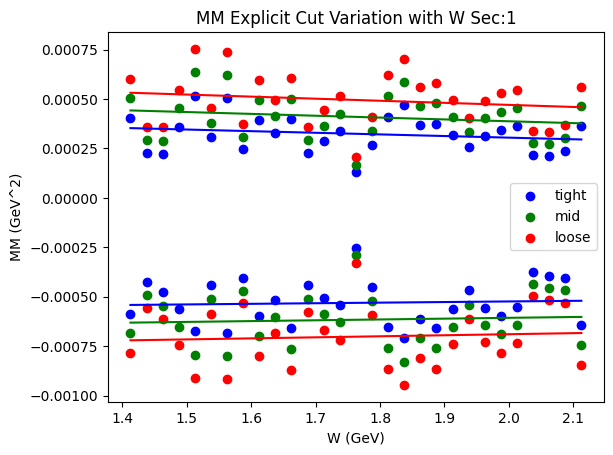

[-1.93855490e-04 -5.76102834e-05]
[ 1.20863950e-04 -1.05774324e-05]
[-2.25327437e-04 -6.23135629e-05]
[ 1.52335893e-04 -5.87414629e-06]
[-2.56799384e-04 -6.70168429e-05]
[ 1.83807843e-04 -1.17087185e-06]


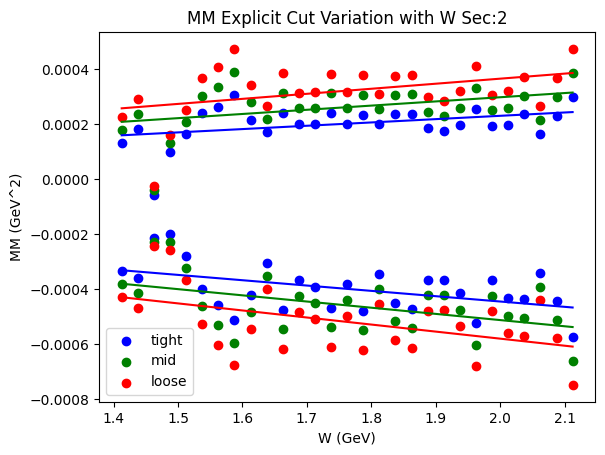

[-3.85644490e-05 -3.07715976e-04]
[3.10251438e-05 1.19193842e-04]
[-4.55233997e-05 -3.50406973e-04]
[3.79840986e-05 1.61884831e-04]
[-5.24823718e-05 -3.93097932e-04]
[4.49430598e-05 2.04575809e-04]


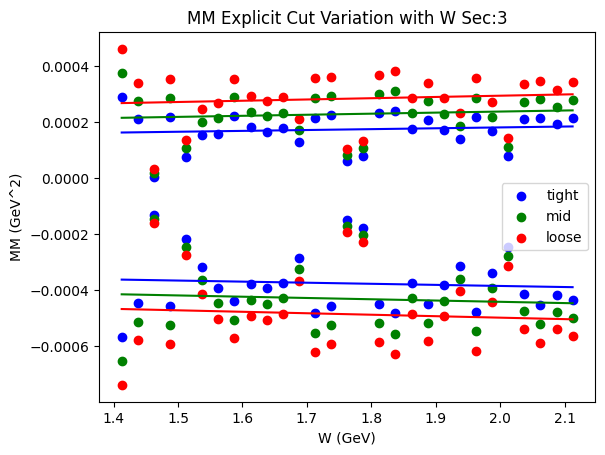

[-0.0002052  -0.00010166]
[-7.31123468e-05  3.86991112e-04]
[-2.66502897e-04 -5.64058651e-05]
[ 2.05691534e-04 -8.19922036e-05]
[-0.000494    0.00032066]
[ 0.00053047 -0.00064474]


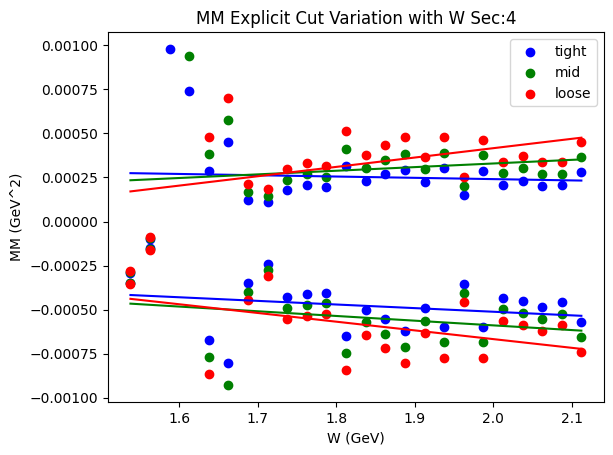

[ 1.86162117e-05 -6.17711592e-04]
[-6.49736443e-05  4.23358076e-04]
[ 2.69751619e-05 -7.21818498e-04]
[-7.33326284e-05  5.27465040e-04]
[-5.51302133e-05 -6.42100925e-04]
[-8.16916125e-05  6.31572004e-04]


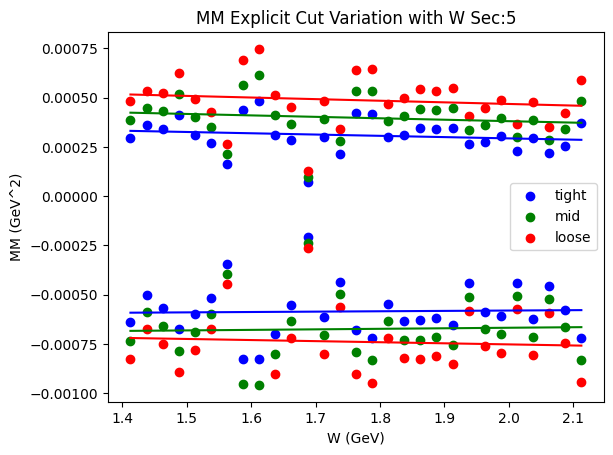

[-6.62815174e-05 -3.94709221e-04]
[4.56486706e-05 1.77659275e-04]
[-7.74745603e-05 -4.51946027e-04]
[5.68416799e-05 2.34896142e-04]
[-8.86675551e-05 -5.09182919e-04]
[6.80346916e-05 2.92133004e-04]


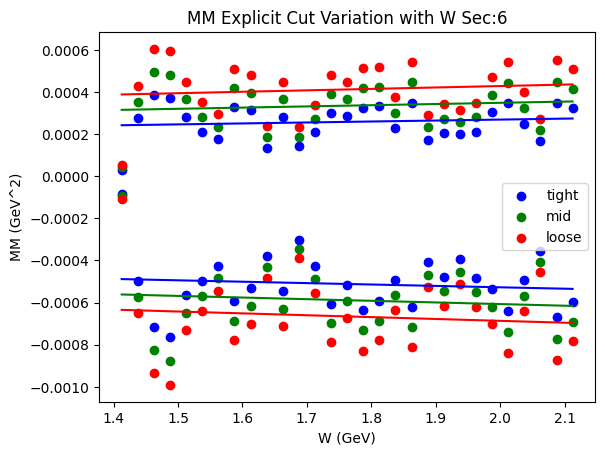

In [8]:
W_bins = [W_center(i) for i in range(_W_bins_)]

y_bou = [-0.001,0.001]

def Linear(x_, a_, b_):
    return a_*x_ + b_

#sec,side,tightness,parameters
var_cut_bounds = np.zeros((6,2,3,2))

color_order = ['b','g','r']
cut_names=['tight','mid','loose']

ini_par = [[ 3.25244146e-05, -5.87718393e-04],[-8.37597271e-05,  4.71230464e-04]]

for sec in range(6):
#     x = W_bins
    
    
#     y_tight_w1 = Bounds_on_Y([cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_tight_w2 = Bounds_on_Y([cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_mid_w1 = Bounds_on_Y([cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_mid_w2 = Bounds_on_Y([cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_loose_w1 = Bounds_on_Y([cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     y_loose_w2 = Bounds_on_Y([cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_tight_w1 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_tight_w2 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_mid_w1 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_mid_w2 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_loose_w1 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
#     x_loose_w2 = Bounds_on_X_From_Y(x,[cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1])
                  
    
    
    #y_tight_w1_err = [cut_bounds_err[sec][Wbin][0][0] for Wbin in range(_W_bins_)]
    #y_tight_w2_err = [cut_bounds_err[sec][Wbin][1][0] for Wbin in range(_W_bins_)]
    #y_mid_w1_err = [cut_bounds_err[sec][Wbin][0][1] for Wbin in range(_W_bins_)]
    #y_mid_w2_err = [cut_bounds_err[sec][Wbin][1][1] for Wbin in range(_W_bins_)]
    #y_loose_w1_err = [cut_bounds_err[sec][Wbin][0][2] for Wbin in range(_W_bins_)]
    #y_loose_w2_err = [cut_bounds_err[sec][Wbin][1][2] for Wbin in range(_W_bins_)]
    for cut in range(3):
        for side in range(2):
            y = Remove_Zeros_Y(Bounds_on_Y([cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1]))
            x = Remove_Zeros_X(Bounds_on_X_From_Y(W_bins,[cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1]),Bounds_on_Y([cut_bounds[sec][Wbin][side][cut] for Wbin in range(_W_bins_)],y_bou[0],y_bou[1]))
            if side ==0:
                plt.scatter(x,y,color=color_order[cut],label=cut_names[cut])
            else:
                plt.scatter(x,y,color=color_order[cut])
            try:
                pars, pars_cov = op.curve_fit(Linear,x,y,maxfev=5000,p0=ini_par[side])
                cont_x = np.linspace(np.min(x),np.max(x),200)
                plt.plot(cont_x,Linear(cont_x,pars[0],pars[1]),color=color_order[cut])
                var_cut_bounds[sec][side][cut][0] = pars[0]
                var_cut_bounds[sec][side][cut][1] = pars[1]
                print(var_cut_bounds[sec][side][cut])
                
            except RuntimeError:
                print("Runtime Error 2.0\n\tJust skip it for now")
            except ValueError:
                print("Value Error 2.0\n\tJust skip it for now")
            
    
#     plt.scatter(W_bins,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
#     #plt.errorbar(W_bins,y_tight_w1,yerr=y_tight_w1_err,color='b',ls='none')
#     plt.scatter(W_bins,y_tight_w2,color='b',)
#     #plt.errorbar(W_bins,y_tight_w2,yerr=y_tight_w2_err,color='b',ls='none')
#     plt.scatter(W_bins,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     #plt.errorbar(W_bins,y_mid_w1,yerr=y_mid_w1_err,color='g',ls='none')
#     plt.scatter(W_bins,y_mid_w2,color='g')
#     #plt.errorbar(W_bins,y_mid_w2,yerr=y_mid_w2_err,color='g',ls='none')
#     plt.scatter(W_bins,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     #plt.errorbar(W_bins,y_loose_w1,yerr=y_loose_w1_err,color='r',ls='none')
#     plt.scatter(W_bins,y_loose_w2,color='r')
#     #plt.errorbar(W_bins,y_loose_w2,yerr=y_loose_w2_err,color='r',ls='none')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][0],_W_min_,_W_max_,color='y')
#     plt.hlines(cut_bounds[sec][_W_bins_][1][0],_W_min_,_W_max_,color='y')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][1],_W_min_,_W_max_,color='m')
#     plt.hlines(cut_bounds[sec][_W_bins_][1][1],_W_min_,_W_max_,color='m')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][2],_W_min_,_W_max_,color='c')
#     plt.hlines(cut_bounds[sec][_W_bins_][1][2],_W_min_,_W_max_,color='c')
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV^2)")
    plt.show()
    
    
    
    

<function matplotlib.pyplot.show(close=None, block=None)>

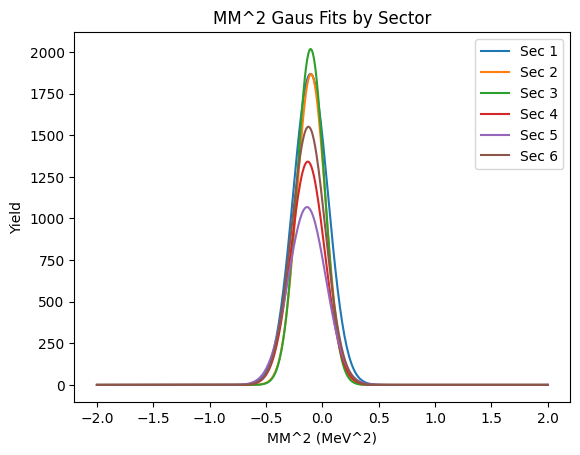

In [9]:
Wbin = _W_bins_
for sec in range(6):
    tmp_x2 = np.linspace(-0.002,0.002,400)
    tmp_x3 = 1000*tmp_x2
    plt.plot(tmp_x3,Gaus(tmp_x2,*gaus1_pars[sec][Wbin]),label="Sec {}".format(sec+1))
plt.legend()
plt.title("MM^2 Gaus Fits by Sector")
plt.ylabel("Yield")
plt.xlabel("MM^2 (MeV^2)")
plt.show

In [10]:
# print("MM "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                     else:
#                         print("\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                 else:
#                     print("{",cut_bounds[sec][_W_bins_][side][t],end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}}}")
#                     else:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}},")
#                 else: 
#                     print(cut_bounds[sec][_W_bins_][side][t],"},")
#             else: 
#                 print(cut_bounds[sec][_W_bins_][side][t],end=",")



In [11]:
print("MM^2 "+Particle+" Linear Cut Bounds [sec][low/high][tight/mid/loose][intercept,slope]")
for sec in range(6):
    for side in range(2):
        for t in range(3):
            for p in range(2):
                if p==0:
                    if t == 0:
                        if side ==0:
                            if sec==0:
                                print("{\t{\t{\t{",var_cut_bounds[sec][side][t][p],end=",")
                            else:
                                print("\t{\t{\t{",var_cut_bounds[sec][side][t][p],end=",")
                        else:
                            print("\t\t{\t{",var_cut_bounds[sec][side][t][p],end=",")
                    else:
                        print("{",var_cut_bounds[sec][side][t][p],end=",")
                elif p == 1:
                    if t == 2:
                        if side == 1:
                            if sec == 5:
                                print("",var_cut_bounds[sec][side][t][p],"}}}}")
                            else:
                                print("",var_cut_bounds[sec][side][t][p],"}}},")
                        else: 
                            print("",var_cut_bounds[sec][side][t][p],"}},")
                    else:
                        print("",var_cut_bounds[sec][side][t][p],end="},")
                else: 
                    print(var_cut_bounds[sec][side][t][p],end=",")

MM^2 Explicit Linear Cut Bounds [sec][low/high][tight/mid/loose][intercept,slope]
{	{	{	{ 3.0132645646911415e-05, -0.0005841179736899903},{ 4.134845396727275e-05, -0.0006893993172219905},{ 5.256431579752798e-05, -0.0007946807556833172 }},
		{	{ -8.202572346980116e-05, 0.0004686959723562774},{ -9.32415683932768e-05, 0.0005739773810144944},{ -0.00010445739300083255, 0.0006792587533083091 }}},
	{	{	{ -0.00019385548997039511, -5.7610283402337404e-05},{ -0.00022532743703116114, -6.231356286709874e-05},{ -0.0002567993837435295, -6.70168429154379e-05 }},
		{	{ 0.0001208639500665276, -1.0577432444553749e-05},{ 0.0001523358931829329, -5.874146286378144e-06},{ 0.00018380784256361236, -1.1708718506504915e-06 }}},
	{	{	{ -3.856444903093006e-05, -0.00030771597587570795},{ -4.552339967498065e-05, -0.00035040697279196546},{ -5.248237177721552e-05, -0.00039309793188817337 }},
		{	{ 3.102514381468421e-05, 0.00011919384184518419},{ 3.79840986336349e-05, 0.00016188483055586735},{ 4.4943059821853356e-05, 